# Simulating the Transits of Planets
***
<div class="alert alert-block alert-info">
<b>Sources referenced throughout:</b> 
    
1) https://arxiv.org/pdf/1001.2010.pdf

2) https://arxiv.org/pdf/1009.1738.pdf

3) https://www.qmul.ac.uk/spa/media/school-of-physics/outreach/research-in-schools/PlanetHuntingWithPythonManual-StudentVersion-UpdatedDataDownloadInstructions.pdf
</div>

<a id="1"></a>
# 1/2/21 - Orbital Motion
***
### Jump to date:
* [1/2/21 - Orbital Motion](#1)
* [8/2/21 - Limb darkening, Drawing the planet transiting in front of the star, Animation](#2)
* [Between Weeks - Optimisation and Bug fixing](#3)
* [15/2/21 - Spinning and Rotation](#4)
* [22/2/21 - Reading data and adding a moon](#5)
* [1/3/21 - Planet-Moon transit](#6)
* [8/3/21 - Improved limb darkening](#7)
* [15/3/21 - Planetry atmosphere](#8)

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import math

First, to see what the motion of the planet is around the star, I plotted the motion of the planet (where the star is at the origin) to make it easier to visualise. I used the equations found in paper 2.

In [2]:
# Defining variables and constants
a= 50 # Semi Major axis
e = 0.7 # Eccentricity < 1 to work
theta = np.linspace(0, 2*np.pi, num=200) # Over a full orbit
phase = np.pi/2 
f = theta - phase 

In [3]:
r = a*(1 - e**2)/ (1 + e*np.cos(f)) # Distance between the star and the planet

Plotting to see if the equations are correct.

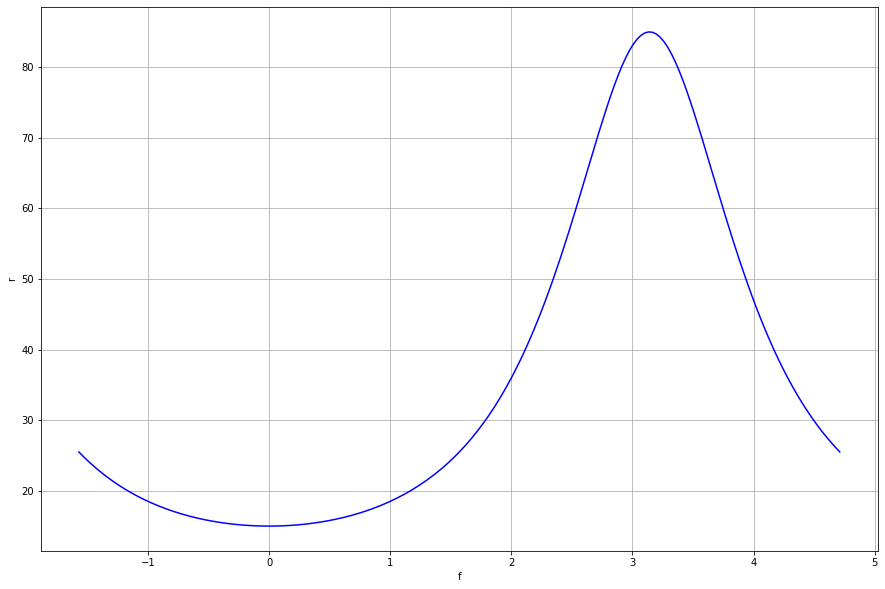

In [4]:
# Plotting r (the distance between the planet and star) against f (the angle of the orbit)

fig = plt.figure(figsize=(15,10))
ax = plt.plot(f, r, 'b-') 
plt.xlabel('f') 
plt.ylabel('r')
plt.grid()
plt.show()

## Motion of planet in x and y plane (2D) using equations from the paper 2:

In [5]:
X_2D = r*np.cos(f)
Y_2D= r*np.sin(f)

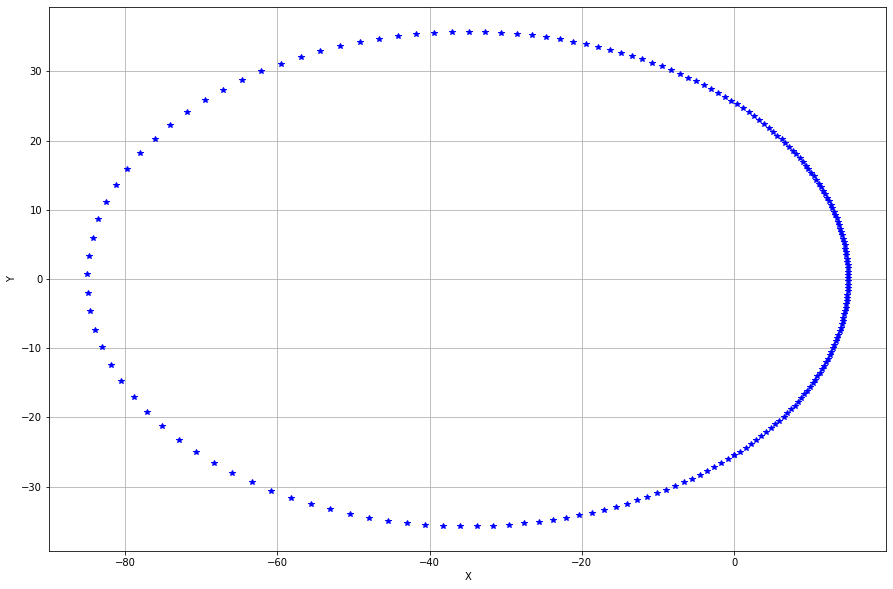

In [6]:
fig = plt.figure(figsize=(15,10))
ax = plt.plot(X_2D, Y_2D, 'b*') 
plt.xlabel('X') 
plt.ylabel('Y')
plt.grid()
plt.show()

Looking at the plot, I can see the difference between when the motion is evaluated close to the origin (where the points are close together) and when the motion is evaluated away from the origin (where the points are further apart). I think this is due to the fact the angle between two points is constant so the two points to the origin form similar triangles. When the distance to the points is further away, it stand to reason that the distance between two points will also increase.

Now the motion of the planet in 3D using equations from the paper 2

In [7]:
i = np.pi/2
omega = np.pi/4
w = omega + phase

X_3D = - r* np.cos(w +f) 
Y_3D = - r* np.sin(w +f)* np.cos(i)
Z_3D = r* np.sin(w +f)* np.sin(i)

Plotting in the XY plane to make sure I still get similar results

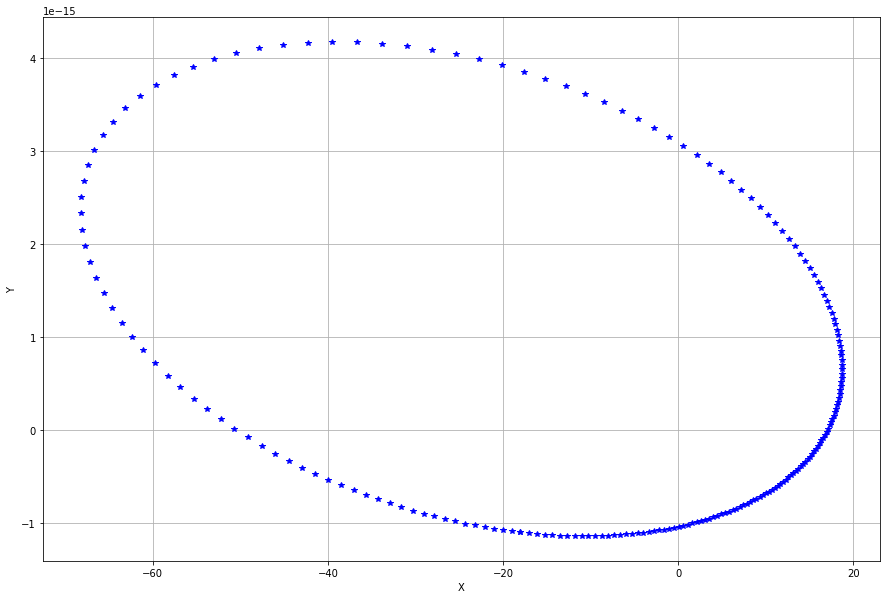

In [8]:
fig = plt.figure(figsize=(15,10))
ax = plt.plot(X_3D, Y_3D, 'b*') 
plt.xlabel('X') 
plt.ylabel('Y')
plt.grid()
plt.show()

## Plotting in 3D:

Plotting graphs in 3D using: https://www.codespeedy.com/plotting-3d-graphs-in-python-using-matplotlib/

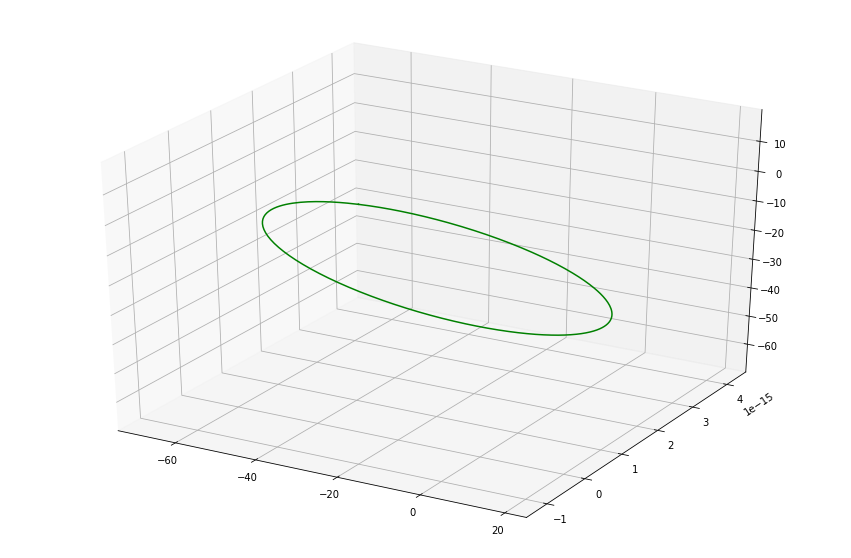

In [9]:
from mpl_toolkits import mplot3d 

fig = plt.figure(figsize=(15,10))
ax = plt.axes(projection ='3d') 
  
ax.plot3D(X_3D,Y_3D,Z_3D,'green') 

plt.show() 

I can now see that the elipse is tilted - which can be adjusted by changing the angular parameters

## Grid display:

Next, I tried to make a grid to display the star and planet moving infront/behind it. I started by using an array to act as a sudo 'display' which can be drawn on by adding numbers to specific cells. I started by trying to draw a circle. I used code from user Peter Gibson from https://stackoverflow.com/questions/22777049/how-can-i-draw-a-circle-in-a-data-array-map-in-python to do this.

In [10]:
display_height = 21
display_width = 21

display = np.zeros((display_width, display_height))

a = (display_width - 1)/2
b = (display_height - 1)/2


#############################
# https://stackoverflow.com/questions/22777049/how-can-i-draw-a-circle-in-a-data-array-map-in-python
# User: Peter Gibson
import math
# draw the circle
for angle in range(0, 360):
    x = 4 * math.sin(math.radians(angle)) + a
    y = 4 * math.cos(math.radians(angle)) + b
    display[int(np.round(y))][int(np.round(x))] = 1
############################


print (display)

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0.

The code draws a circle but I need it to be filled in so I iterated it over smaller and smaller radii.

In [11]:
display_height = 23
display_width = 23

display = np.zeros((display_width, display_height))

a = (display_width - 1)/2
b = (display_height - 1)/2

#############################
# https://stackoverflow.com/questions/22777049/how-can-i-draw-a-circle-in-a-data-array-map-in-python
# User: Peter Gibson


import math
# draw the circle

r=3
while r > 0:
    for angle in range(0, 360):
        x = r * math.sin(math.radians(angle)) + a
        y = r * math.cos(math.radians(angle)) + b
        display[int(np.round(y))][int(np.round(x))] = 1

        
    r-=1
    
display[int(round(b))][int(round(a))] = 1
############################

print (display)

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0.

Since the circle is filled in concentrically by decreasing the radius, it will allow me to account for limb darkening in the future since that depends radially from the centre of the star (1). 

## Drawing orbital motion on display

The coordinates from circular motion need to be scaled so that correspond to array cells. This can be done by finding the largest values of the circular motion and setting them to the edges of the array.

In [12]:
X_SF = (max(X_3D) - min(X_3D))
Y_SF = (max(Y_3D) - min(Y_3D))

X_coord_on_grid = X_3D/X_SF * (display_width/2)  + (display_width - 1)/2
Y_coord_on_grid = Y_3D/Y_SF * (display_height/2) + (display_height - 1)/2

In [13]:
print (np.round(X_coord_on_grid))

[ 9.  9.  9.  9.  9.  9.  9.  9. 10. 10. 10. 10. 10. 10. 10. 10. 10. 10.
 10. 11. 11. 11. 11. 11. 11. 11. 11. 11. 11. 11. 11. 11. 11. 12. 12. 12.
 12. 12. 12. 12. 12. 12. 12. 12. 12. 12. 12. 12. 12. 12. 12. 12. 13. 13.
 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13.
 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13.
 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13.
 13. 13. 13. 13. 13. 13. 13. 12. 12. 12. 12. 12. 12. 12. 11. 11. 11. 11.
 11. 10. 10. 10. 10.  9.  9.  9.  8.  8.  8.  7.  7.  7.  6.  6.  5.  5.
  5.  4.  4.  4.  3.  3.  3.  3.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.
  2.  2.  2.  3.  3.  3.  3.  3.  3.  4.  4.  4.  4.  4.  5.  5.  5.  5.
  6.  6.  6.  6.  6.  6.  7.  7.  7.  7.  7.  7.  8.  8.  8.  8.  8.  8.
  8.  9.]


In [14]:
print (np.round(Y_coord_on_grid))

[ 9.  9.  9.  9.  9.  9.  9.  9.  9.  9.  9.  9.  9.  9.  9.  9.  9.  9.
  9.  9.  9.  9.  9.  9.  9.  9.  9.  9.  9.  9.  9.  9.  9.  9.  9.  9.
  9.  9.  9.  9.  9.  9.  9.  9.  9.  9.  9.  9. 10. 10. 10. 10. 10. 10.
 10. 10. 10. 10. 10. 10. 10. 10. 10. 10. 10. 10. 10. 10. 11. 11. 11. 11.
 11. 11. 11. 11. 11. 11. 11. 11. 11. 11. 12. 12. 12. 12. 12. 12. 12. 12.
 12. 12. 13. 13. 13. 13. 13. 13. 13. 13. 13. 14. 14. 14. 14. 14. 14. 14.
 15. 15. 15. 15. 15. 15. 16. 16. 16. 16. 16. 17. 17. 17. 17. 17. 18. 18.
 18. 18. 18. 19. 19. 19. 19. 19. 19. 20. 20. 20. 20. 20. 20. 20. 20. 20.
 20. 20. 20. 19. 19. 19. 19. 18. 18. 18. 18. 17. 17. 16. 16. 16. 15. 15.
 15. 14. 14. 13. 13. 13. 13. 12. 12. 12. 11. 11. 11. 11. 11. 10. 10. 10.
 10. 10. 10. 10.  9.  9.  9.  9.  9.  9.  9.  9.  9.  9.  9.  9.  9.  9.
  9.  9.]


Once scaled correctly, the circular motion can be added to the display. I added it with the value of 2 so that it can be see separately to the circle.

In [15]:
for i in range(len(X_coord_on_grid)):
    display[int(np.round(Y_coord_on_grid[i]))][int(X_coord_on_grid[i])] = 2

In [16]:
print (display)

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 2. 2. 2. 2. 2. 2. 2. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 2. 2. 2. 0. 1. 1. 1. 1. 2. 2. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 2. 2. 0. 0. 0. 1. 1. 1. 1. 1. 2. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 2. 0. 0. 0. 0. 1. 1. 1. 1. 1. 2. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 2. 2. 0. 0. 0. 0. 1. 1. 1. 1. 1. 2. 1. 0. 0. 0. 0. 0. 0.

The orbit of the planet (2's) can be seen orbiting around the star (1's) 

<div class="alert alert-block alert-info">
<b>Project info:</b> We shared code between each other to get a better understanding of what to do next .
</div>

### Things to do for next week: 

* I need to find a good reasons for studying exoplanets with a cited paper                  

<a id="2"></a>
# 8/2/21 - Limb darkening, Drawing the planet transiting in front of the star and Animation
***
### Jump to date:
* [1/2/21 - Orbital Motion](#1)
* [8/2/21 - Limb darkening, Drawing the planet transiting in front of the star, Animation](#2)
* [Between Weeks - Optimisation and Bug fixing](#3)
* [15/2/21 - Spinning and Rotation](#4)
* [22/2/21 - Reading data and adding a moon](#5)
* [1/3/21 - Planet-Moon transit](#6)
* [8/3/21 - Improved limb darkening](#7)
* [15/3/21 - Planetry atmosphere](#8)

In [17]:
import math

## Limb darkening 

From paper 1, limb darkening intensity is defined as $ I \propto 1-\mu_{1}(1-\mu)-\mu_{2}(1-\mu)^2$.

Where $\mu = \sqrt{1-X^2-Y^2}$

I wrote a function to output the instensity for a given x,y value.

In [18]:
def intensity (X,Y):
    print (X)
    mu1 = 0.3
    mu2 = 0.4
    mu = np.sqrt(1-(X**2 + Y**2))
    return 100*(1-mu1*(1-mu)-mu2*(1-mu)**2) 

In [19]:
display_height = 23
display_width = 23

display = np.zeros((display_width, display_height))

a = (display_width - 1)/2
b = (display_height - 1)/2

#############################
# https://stackoverflow.com/questions/22777049/how-can-i-draw-a-circle-in-a-data-array-map-in-python
# User: Peter Gibson


import math
# draw the circle

r=3
while r > 0:
    for angle in range(0, 360):
        x = r * math.sin(math.radians(angle)) + a
        y = r * math.cos(math.radians(angle)) + b
        display[int(np.round(y))][int(np.round(x))] = 1
        print(intensity(int(np.round(x)),int(np.round(y))))
        
    r-=1
    
display[int(round(b))][int(round(a))] = 1
############################

print (display)

11
nan
11
nan
11
nan
11
nan
11
nan
11
nan
11
nan
11
nan
11
nan
11
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
14
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan

/Users/mathew3/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in sqrt
  """



nan
11
nan
11
nan
11
nan
11
nan
11
nan
11
nan
11
nan
11
nan
11
nan
11
nan
11
nan
11
nan
11
nan
11
nan
11
nan
11
nan
11
nan
11
nan
11
nan
11
nan
11
nan
11
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
12
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
13
nan
12
nan
12
nan
12
nan
1

Using this function leads to nan values since mu in the intensity function is imaginary.

Since $X^2+Y^2 = r^2$, $\mu = \sqrt{1-r^2}$ meaning mu is imaginary for values of r > 1

This will still give us imaginary mu values, the $r^2$ need to be normalised. $\mu = \sqrt{1 - \frac{r^2}{r*^2}}$ where r* is the radius of the star as this will give the effect of being brighter in the centre and dimmer at the edge as required.

In [20]:
mu1 = 0.3
mu2 = 0.1
Intensity_max = 100

def intensity (r_star,r):
    
    mu = np.sqrt(1 - r**2/r_star**2)
    return Intensity_max*(1-mu1*(1-mu)-mu2*(1 - mu)**2) 

In [21]:
display_height = 15
display_width = 15

display = np.zeros((display_width, display_height))

a = (display_width - 1)/2
b = (display_height - 1)/2

#############################
# https://stackoverflow.com/questions/22777049/how-can-i-draw-a-circle-in-a-data-array-map-in-python
# User: Peter Gibson


import math
# draw the circle

r_star = 6
r = r_star
while r > 0:
    for angle in range(0, 360):
        x = r * math.sin(math.radians(angle)) + a
        y = r * math.cos(math.radians(angle)) + b
        display[int(np.round(y))][int(np.round(x))] = int(intensity(r_star,r))
        
    r-=1
    
display[int(round(b))][int(round(a))] = Intensity_max
############################

print (display)

[[  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
    0.]
 [  0.   0.   0.   0.   0.  60.  60.  60.  60.  60.   0.   0.   0.   0.
    0.]
 [  0.   0.   0.  60.  60.  84.  84.  84.  84.  84.  60.  60.   0.   0.
    0.]
 [  0.   0.  60.  84.  84.  91.  91.  91.  91.  91.  84.  84.  60.   0.
    0.]
 [  0.   0.  60.  84.  91.  95.  95.  95.  95.  95.  91.  84.  60.   0.
    0.]
 [  0.  60.  84.  91.  95.  95.  98.  98.  98.  95.  95.  91.  84.  60.
    0.]
 [  0.  60.  84.  91.  95.  98.  99.  99.  99.  98.  95.  91.  84.  60.
    0.]
 [  0.  60.  84.  91.  95.  98.  99. 100.  99.  98.  95.  91.  84.  60.
    0.]
 [  0.  60.  84.  91.  95.  98.  99.  99.  99.  98.  95.  91.  84.  60.
    0.]
 [  0.  60.  84.  91.  95.  95.  98.  98.  98.  95.  95.  91.  84.  60.
    0.]
 [  0.   0.  60.  84.  91.  95.  95.  95.  95.  95.  91.  84.  60.   0.
    0.]
 [  0.   0.  60.  84.  84.  91.  91.  91.  91.  91.  84.  84.  60.   0.
    0.]
 [  0.   0.   0.  60.  60.  84.  84.  84

The effects of limb darkening can be seen in this plot as the relative intensity is highest at the centre and decreases near the edge. I tried playing around with the values of mu1 and mu2 which seem to dictate how quickly the intensity drops off radially. From looking at http://platoldmeeting.iaa.es/sites/default/files/pictures/s1_czismadia.pdf
mu1 and mu2 values of around 0.1 to 0.5 seemed to be roughly physically accurate. The values should also be less than 1 as this leads to negative values of intesity.

As useful as it is just looking at the number values, a higher resolution of image is needed for better, more accurate simulations. As the whole array cannot be displayed natively in the right shape, the array needs to be displayed in a different way. When searching the internet for ideas, I came across 
https://stackoverflow.com/questions/2659312/how-do-i-convert-a-numpy-array-to-and-display-an-image
with user Steve Tjoa's answer of using matlibplot imgshow. Using it gives the following result.

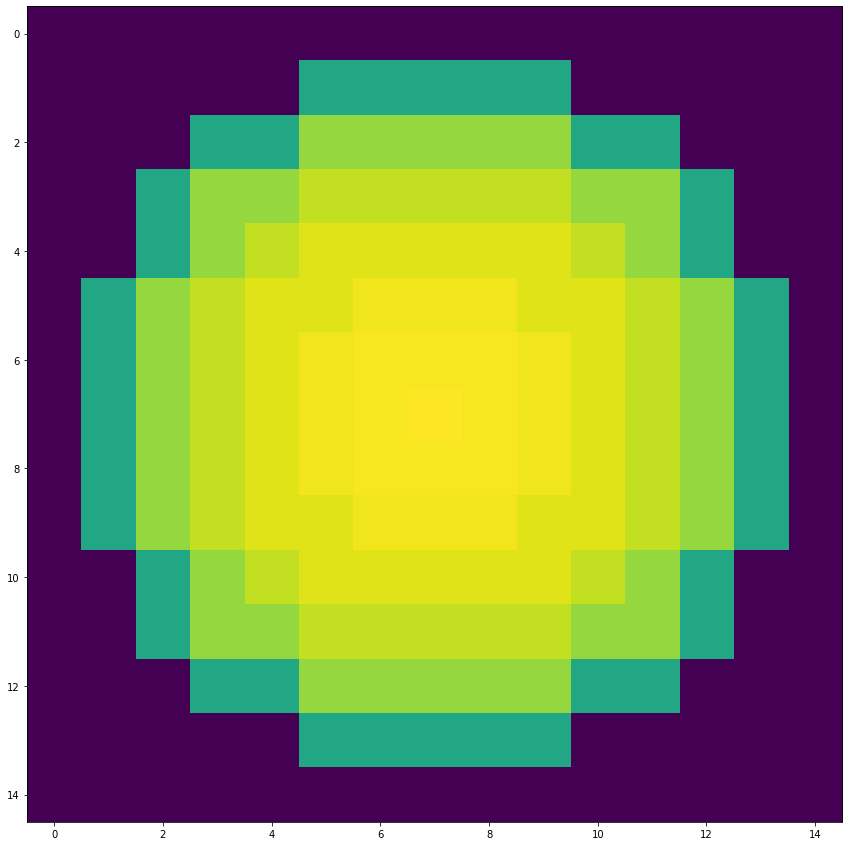

In [22]:
fig = plt.figure(figsize=(15,15))
plt.imshow(display, interpolation='nearest')
plt.show()

Now the display height and width can be increased for a higher resolution result (the star radius can also be increased for now so that it can be seen). This will make the star seem rounder and will therefore be more accurate.

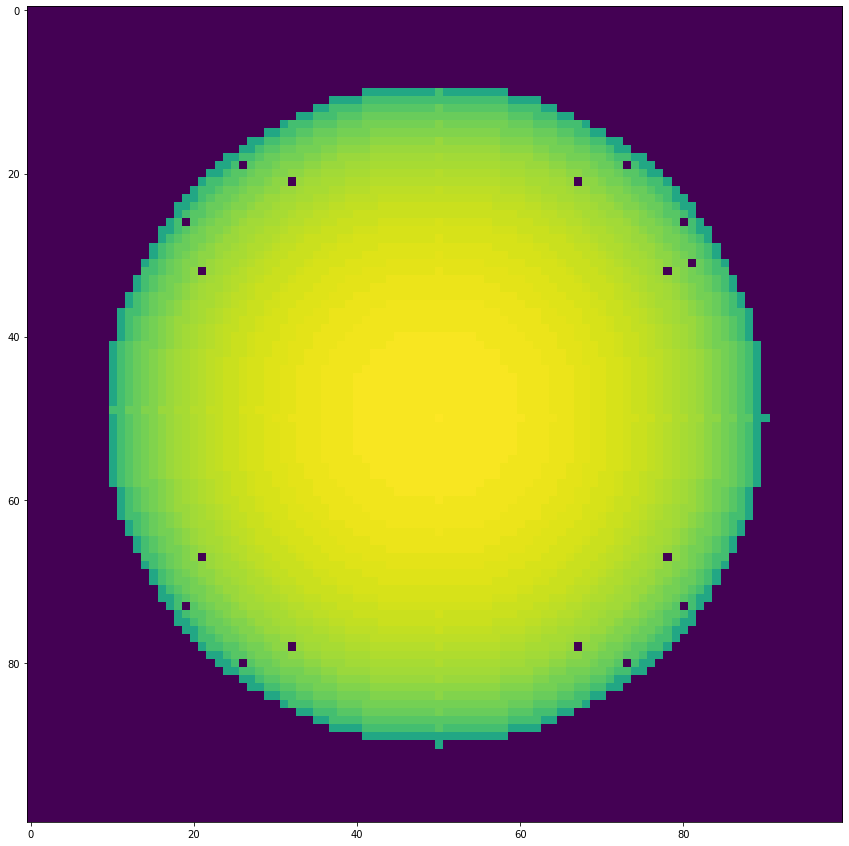

In [23]:
display_height = 100
display_width = 100

display = np.zeros((display_width, display_height))

a = (display_width - 1)/2
b = (display_height - 1)/2

#############################
# https://stackoverflow.com/questions/22777049/how-can-i-draw-a-circle-in-a-data-array-map-in-python
# User: Peter Gibson


import math
# draw the circle

r_star = 40
r = r_star
while r > 0:
    for angle in range(0, 360):
        x = r * math.sin(math.radians(angle)) + a
        y = r * math.cos(math.radians(angle)) + b
        display[int(np.round(y))][int(np.round(x))] = int(intensity(r_star,r))
        
    r-=1
    
display[int(round(b))][int(round(a))] = Intensity_max
############################

fig = plt.figure(figsize=(15,15))
plt.imshow(display, interpolation='nearest')
plt.show()

After increasing the array size to 100 and the star radius to 40, there seems to be some purple spots (suggesting a value of zero) inside the star. This is probably due to the method that I used to draw the circle as the problem seems to get worse the larger the of the radius is (i.e it is very pronounced when display height/width = 200 and radius = 70 as there are weird patterns around the edge)

By modifying the code, I found I could draw the circle to include more angles. Initially I was evaluating the circle at every degree but I changed it to evaluate the circle at every half a degree which seemed to resolve the problem (720 points from 0 to 2pi although this was later changed to 500 points as it did the same job but made the program run faster for now)

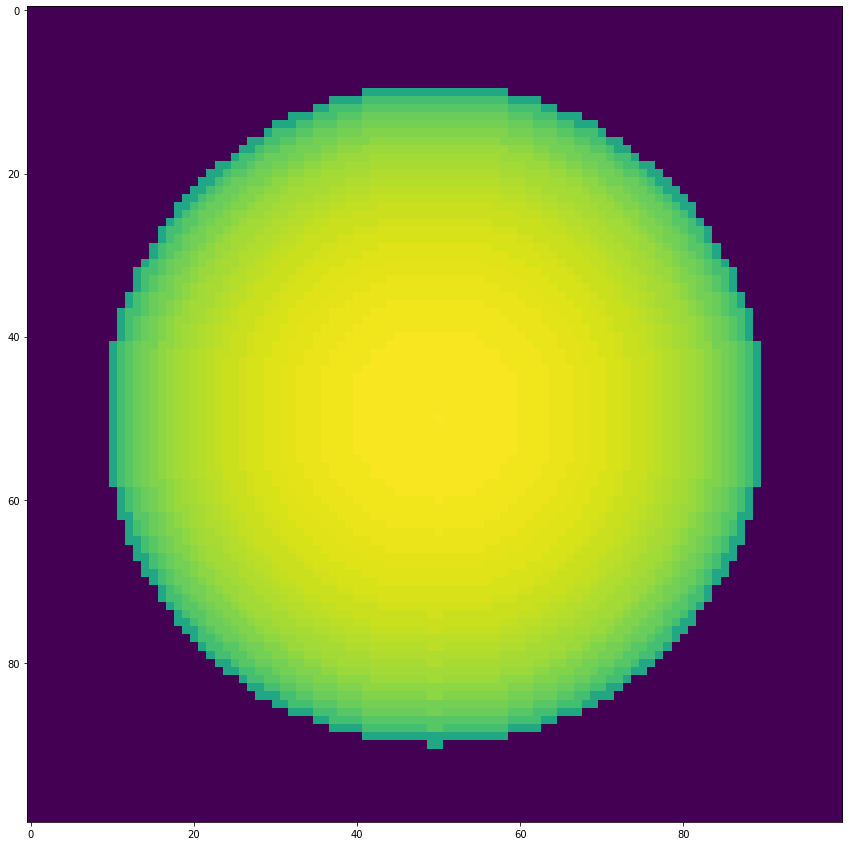

In [24]:
display_height = 100
display_width = 100

display = np.zeros((display_width, display_height))

a = (display_width - 1)/2
b = (display_height - 1)/2

import math

r_star = 40
r = r_star
while r > 0:
    for angle in np.linspace(0, 2*np.pi, num=500): ### Increased resolution of angles
        x = r * math.sin(angle) + a
        y = r * math.cos(angle) + b
        display[int(np.round(y))][int(np.round(x))] = int(intensity(r_star,r))
        
    r-=1
    
display[int(round(b))][int(round(a))] = Intensity_max

fig = plt.figure(figsize=(15,15))
plt.imshow(display, interpolation='nearest')
plt.show()

The next step is to add a planet to the diagram which moves along with orbital motion. To see the planet, I set the value of the planet to -200 so that it will be a different colour.

In [25]:
X_SF = (max(X_3D) - min(X_3D))
Y_SF = (max(Y_3D) - min(Y_3D))

X_coord_on_grid = X_3D/X_SF * (display_width/2)  + (display_width - 1)/2
Y_coord_on_grid = Y_3D/Y_SF * (display_height/2) + (display_height - 1)/2

# centre of the planet = int(np.round(Y_coord_on_grid[i])), int(X_coord_on_grid[i])


display[int(np.round(Y_coord_on_grid[i]))][int(X_coord_on_grid[i])] = -200

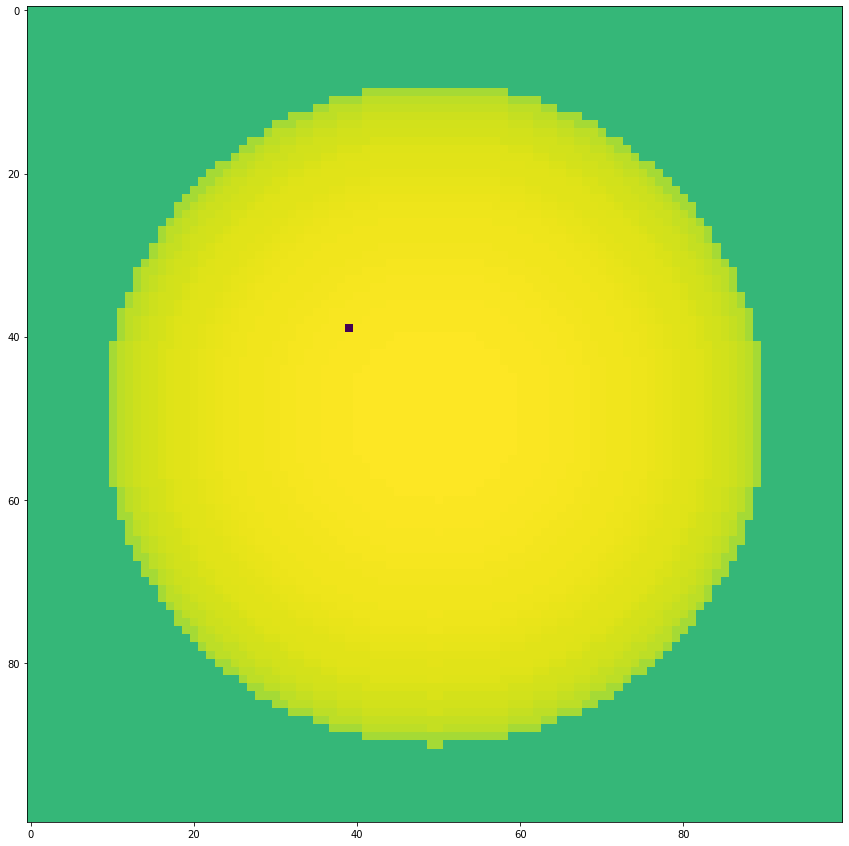

In [26]:
fig = plt.figure(figsize=(15,15))
plt.imshow(display, interpolation='nearest')
plt.show()

A function which draws a circle at a given centre.

In [83]:
def draw_circle(canvas,radius,centre,star):
    r = radius

    while r > 0:
        for angle in np.linspace(0, 2*np.pi, num=500):
            x = r * math.sin(angle) + centre[0]
            y = r * math.cos(angle) + centre[1]
            if star == True:
                try:
                    canvas[int(np.round(y))][int(np.round(x))] = int(intensity(radius,r))
                except:
                    pass  
            else:
                try:
                    canvas[int(np.round(y))][int(np.round(x))] = -200
                except:
                    pass
        r-=1
    if star == True:
        display[int(round(centre[1]))][int(round(centre[0]))] = Intensity_max
    else:
        ##### Woooo it's me from the future - added try/except for planet centre not on display
        try:
            display[int(round(centre[1]))][int(round(centre[0]))] = -200
        except:
            pass
        
    return canvas

Adding the planet to the star.

In [28]:
X_SF = (max(X_3D) - min(X_3D))
Y_SF = (max(Y_3D) - min(Y_3D))

X_coord_on_grid = X_3D/X_SF * (display_width/2)  + (display_width - 1)/2
Y_coord_on_grid = Y_3D/Y_SF * (display_height/2) + (display_height - 1)/2

# centre of the planet = int(np.round(Y_coord_on_grid[i])), int(X_coord_on_grid[i])


display[int(np.round(Y_coord_on_grid[i]))][int(X_coord_on_grid[i])] = -200

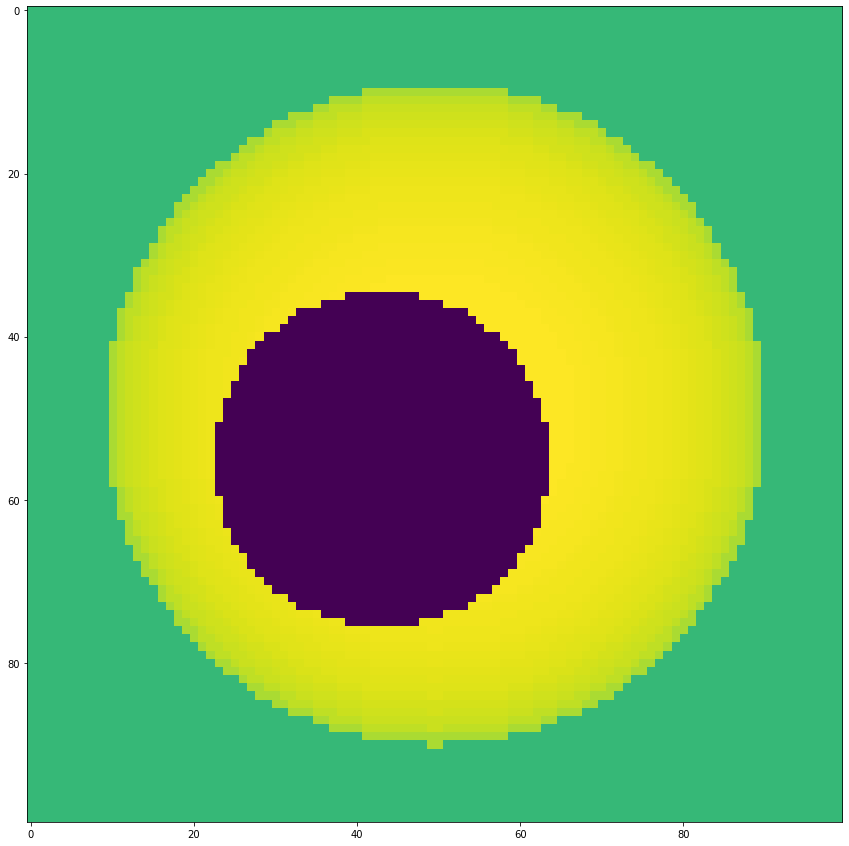

In [29]:
display_height = 100
display_width = 100

display = np.zeros((display_width, display_height))

a = (display_width - 1)/2
b = (display_height - 1)/2


#### Star ####
centre_of_star = [a,b]
r_star = 40

display = draw_circle(display,r_star,centre_of_star,True)

#### Planet ####
X_SF = (max(X_3D) - min(X_3D))
Y_SF = (max(Y_3D) - min(Y_3D))

X_coord_on_grid = X_3D/X_SF * (display_width/2)  + (display_width - 1)/2
Y_coord_on_grid = Y_3D/Y_SF * (display_height/2) + (display_height - 1)/2

# centre of the planet = int(np.round(Y_coord_on_grid[i])), int(X_coord_on_grid[i])
r_planet = 20

i = 50
centre_of_planet = [int(np.round(Y_coord_on_grid[i])),int(X_coord_on_grid[i])]


display = draw_circle(display,r_planet,centre_of_planet,False)



fig = plt.figure(figsize=(15,15))
plt.imshow(display, interpolation='nearest')
plt.show()

Changing the i value, which changes the centre of the planet, causes the the planet to move. It is not scaled correctly though so doesn't go around the planet.

## Animation

The image above shows the relative position of a planet and a star at one point in time. Since the position of the planet can be known at any point in time, the plot can be animated to show the orbit properly. The best method of animating the orbit (iterating through each point in the orbit and taking a 'picture' of the plot) was found using https://stackoverflow.com/questions/60033397/moviewriter-ffmpeg-unavailable-trying-to-use-class-matplotlib-animation-pillo where a library called celluloid is used to take 'snapshots' of the figure each time after it has been redrawn and piecing them together to form a gif (located in the file that this program is in).   

### Need to install the celluloid library:

In [ ]:
### !pip3 install celluloid # Remove hashtag to install

Adding celluloid so that 'pictures' of all the planetry centres can be taken to produce a GIF. 

In [ ]:
from matplotlib import pyplot as plt
from celluloid import Camera
import numpy as np




display_height = 100
display_width = 100

display = np.zeros((display_width, display_height))

a = (display_width - 1)/2
b = (display_height - 1)/2


#### Star ####
centre_of_star = [a,b]
r_star = 40

display = draw_circle(display,r_star,centre_of_star,True)

#### Planet ####
X_SF = (max(X_3D) - min(X_3D))
Y_SF = (max(Y_3D) - min(Y_3D))

X_coord_on_grid = X_3D/X_SF * (display_width/2)  + (display_width - 1)/2
Y_coord_on_grid = Y_3D/Y_SF * (display_height/2) + (display_height - 1)/2

# centre of the planet = int(np.round(Y_coord_on_grid[i])), int(X_coord_on_grid[i])
r_planet = 20


fig = plt.figure(figsize=(15,15))
camera = Camera(fig)
ax = plt.axes()

for i in range(int(len(X_coord_on_grid))/10 -1):
    display = np.zeros((display_width, display_height))
    display = draw_circle(display,r_star,centre_of_star,True)
    
    centre_of_planet =  [int(np.round(Y_coord_on_grid[i*10])),int(X_coord_on_grid[i*10])]
    display = draw_circle(display,r_planet,centre_of_planet,False)
    ax.imshow(display, interpolation='nearest')
    plt.pause(0.1)
    camera.snap()
    

animation = camera.animate()
animation.save('animation.gif', writer='PillowWriter', fps=5)

A GIF can now be produced which shows the planet as it moves in front of the star.

## Scaling the planet orbit correctly

To see the planet correctly orbiting a star, I used parameters for Jupiter and the Sun from https://nssdc.gsfc.nasa.gov/planetary/factsheet/jupiterfact.html

In [30]:
# Defining variables and constants
a= 7.8e9 # Semi Major axis
e = 0.0489 # Eccentricity < 1 to work

radius_of_sun = 7e5
radius_of_jupiter = 7e4 

theta = np.linspace(0, 2*np.pi, num=200) # Over a full orbit
phase = 0 
f = theta - phase 
r = a*(1 - e**2)/ (1 + e*np.cos(f)) # Distance between the star and the planet
print (r)
i = 0
omega = np.pi/2
w = omega + phase

X_3D = - r* np.cos(w +f) 
Y_3D = - r* np.sin(w +f)* np.cos(i)
Z_3D = r* np.sin(w +f)* np.sin(i)

[7.41858000e+09 7.41875238e+09 7.41926941e+09 7.42013070e+09
 7.42133564e+09 7.42288337e+09 7.42477277e+09 7.42700247e+09
 7.42957086e+09 7.43247609e+09 7.43571603e+09 7.43928833e+09
 7.44319038e+09 7.44741931e+09 7.45197201e+09 7.45684511e+09
 7.46203499e+09 7.46753777e+09 7.47334932e+09 7.47946527e+09
 7.48588097e+09 7.49259153e+09 7.49959180e+09 7.50687637e+09
 7.51443957e+09 7.52227549e+09 7.53037795e+09 7.53874052e+09
 7.54735651e+09 7.55621898e+09 7.56532072e+09 7.57465430e+09
 7.58421199e+09 7.59398586e+09 7.60396769e+09 7.61414905e+09
 7.62452124e+09 7.63507532e+09 7.64580213e+09 7.65669226e+09
 7.66773607e+09 7.67892372e+09 7.69024511e+09 7.70168995e+09
 7.71324773e+09 7.72490775e+09 7.73665909e+09 7.74849068e+09
 7.76039121e+09 7.77234926e+09 7.78435321e+09 7.79639129e+09
 7.80845158e+09 7.82052206e+09 7.83259054e+09 7.84464475e+09
 7.85667232e+09 7.86866078e+09 7.88059760e+09 7.89247020e+09
 7.90426594e+09 7.91597215e+09 7.92757617e+09 7.93906533e+09
 7.95042697e+09 7.961648

In [ ]:
from matplotlib import pyplot as plt
from celluloid import Camera
import numpy as np

display_height = 100
display_width = 100

display = np.zeros((display_width, display_height))

a = (display_width - 1)/2
b = (display_height - 1)/2

#### Planet ####
X_SF = (max(X_3D) - min(X_3D))
Y_SF = (max(Y_3D) - min(Y_3D))
Z_SF = (max(Z_3D) - min(Z_3D))

X_coord_on_grid = X_3D/X_SF * (display_width/2)  + (display_width - 1)/2
Y_coord_on_grid = Y_3D/Y_SF * (display_height/2) + (display_height - 1)/2
Z_coord_on_grid = Z_3D/Z_SF * (display_height/2) + (display_height - 1)/2


#### Star ####
centre_of_star = [a,b]
r_star = radius_of_sun/Y_SF

display = draw_circle(display,r_star,centre_of_star,True)

#### Planet ####
# centre of the planet = int(np.round(Y_coord_on_grid[i])), int(X_coord_on_grid[i])
r_planet = radius_of_jupiter/Y_SF


fig = plt.figure(figsize=(15,15))
camera = Camera(fig)
ax = plt.axes()

for i in range(int(len(X_coord_on_grid)/10 -1 )):
    display = np.zeros((display_width, display_height))
    display = draw_circle(display,r_star,centre_of_star,True)
    
    centre_of_planet =  [int(np.round(Y_coord_on_grid[i*10])),int(X_coord_on_grid[i*10])]
    display = draw_circle(display,r_planet,centre_of_planet,False)
    ax.imshow(display, interpolation='nearest')
    plt.pause(0.1)
    camera.snap()
    

animation = camera.animate()
animation.save('animation.gif', writer='PillowWriter', fps=5)

This makes the Sun and Jupiter very small. I think now it is a good time to change my approach from making the 'display' display the whole orbit to just focusing on the Sun and only the transit.

Having talked to *********, he made me realised how to do the light curve. He also talked to us about how using the grid model has advantages over a mathematical model - assumptions and limitations to add new things - much easier to just use a grid where new phenomena can be added easily such as sun spots. 

Ideally, I just need the star and enough room for the planet to be completely off of the star on both sides

To do this, I needed to go back to change the circle function to add a try/except for the centre of the planet not being on the display.

### Version 1.2:

Got rid of separate display height/width since the SF is now also now x/y independant as this makes it easier to scale the radii of the planet/star

[50, 13989]


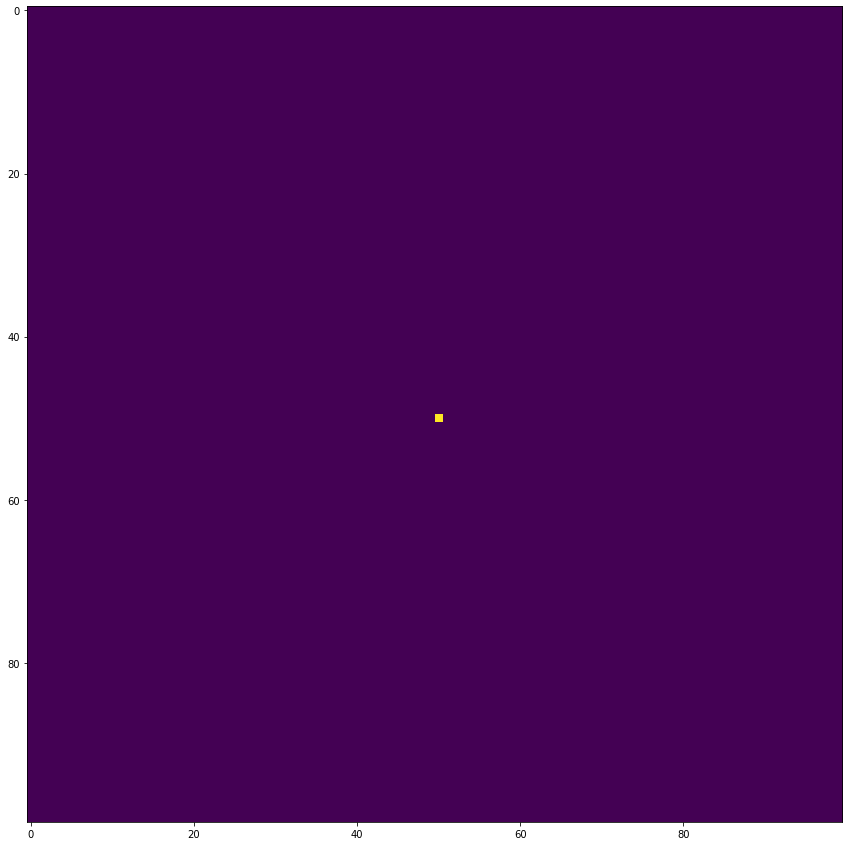

In [86]:
# Defining variables and constants
a= 7.8e9 # Semi Major axis
e = 0.0489 # Eccentricity < 1 to work

radius_of_sun = 7e5
radius_of_jupiter = 7e4 

theta = np.linspace(0, 2*np.pi, num=200) # Over a full orbit
phase = 0 
f = theta - phase 
r = a*(1 - e**2)/ (1 + e*np.cos(f)) # Distance between the star and the planet
i = 0
omega = np.pi/2
w = omega + phase

X_3D = - r* np.cos(w +f) 
Y_3D = - r* np.sin(w +f)* np.cos(i)
Z_3D = r* np.sin(w +f)* np.sin(i)



display_dim = 100

display = np.zeros((display_dim, display_dim))

a = (display_dim - 1)/2

#### Planet ####
SF = (radius_of_sun + 2*radius_of_jupiter)

X_coord_on_grid = X_3D/SF * (display_dim/2)  + (display_dim - 1)/2
Z_coord_on_grid = Z_3D/SF * (display_dim/2) + (display_dim - 1)/2


#### Star ####
centre_of_star = [a,a]
r_star = radius_of_sun/SF * display_dim/2
display = draw_circle(display,r_star,centre_of_star,True)

#### Planet ####
r_planet = radius_of_jupiter/SF *  display_dim/2


i = 1
centre_of_planet = [int(np.round(Z_coord_on_grid[i])),int(X_coord_on_grid[i])]

print (centre_of_planet)
display = draw_circle(display,r_planet,centre_of_planet,False)



fig = plt.figure(figsize=(15,15))
plt.imshow(display, interpolation='nearest')
plt.show()

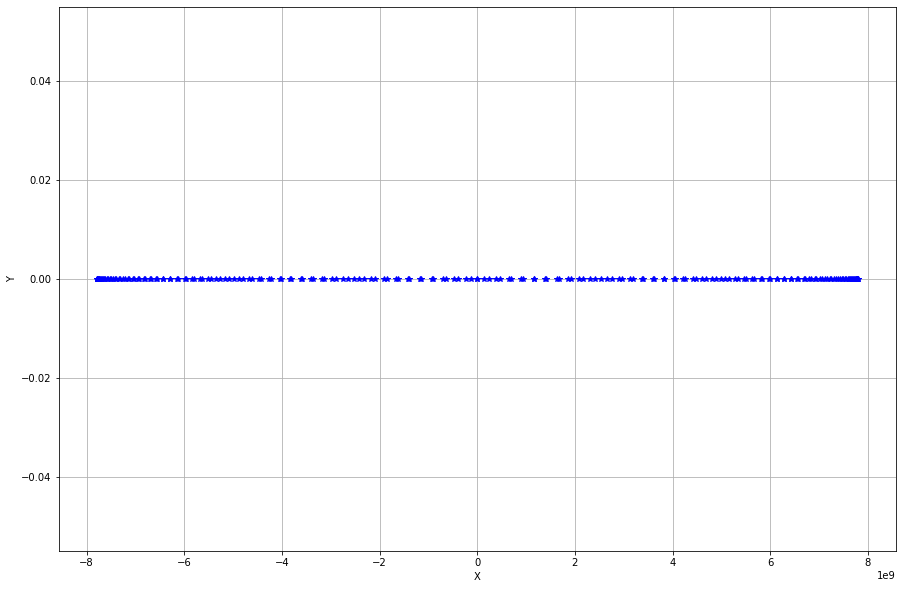

In [54]:
fig = plt.figure(figsize=(15,10))
ax = plt.plot(X_3D, Z_3D, 'b*') 
plt.xlabel('X') 
plt.ylabel('Y')
plt.grid()
plt.show()

Bugs:
The idiot that is me has been using XY instead of XZ so the orbit has been around the star not across it
Also the resolution of the steps is now far too small to perfectly see the planet crossing the star, only steps i = 1 and 199 have the planet infront of the star.  

This is unsuprising if I had thought about it as since arc length = $\theta r$ where the values of r I'm getting are on the order of $7x10^9$ km and the arc length is roughly the radius of the sun $7x10^5$ km , the angle to evalue ate the planet across the sun is roughly $10^{-4}$ which is roughly one arcminute.

### Version 1.3:
Changed flux of planet to zero in the draw circle function in preparation for flux/phase graph
Changed angular range to $\pm 0.6 x 10^{-4} $ to only sample the planet crossing the star. I originally set the range to $\pm 0.5 x 10^ {-4} $ but the last image still had the planet just over the star.
Increased the number of radial steps to 500 for better calculation

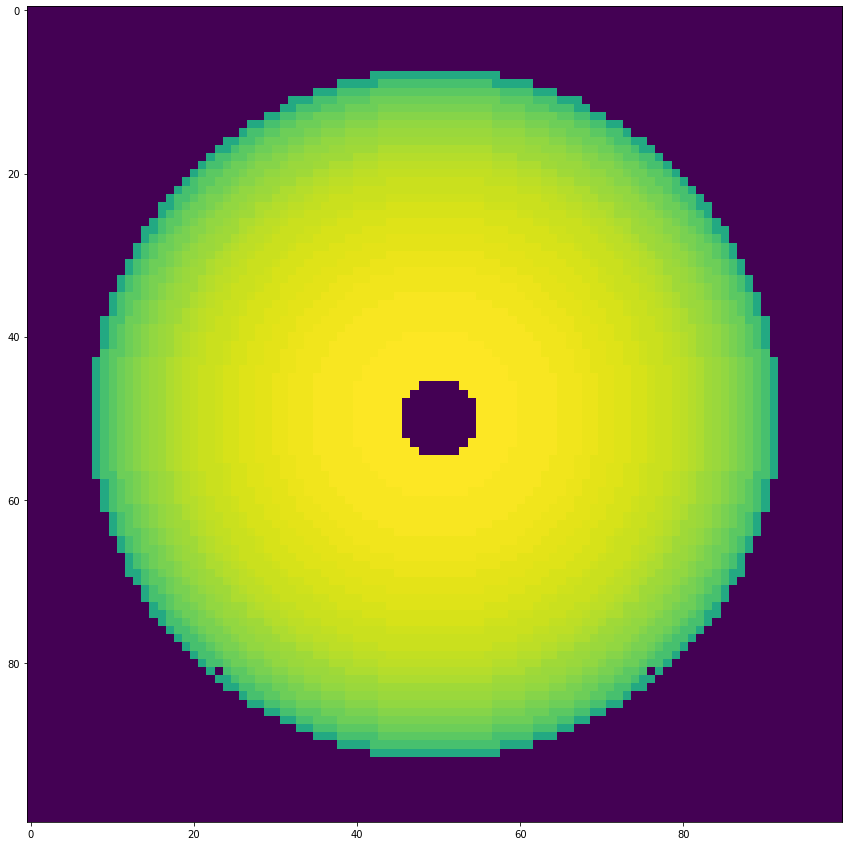

In [80]:
import numpy as np
import matplotlib.pyplot as plt

def draw_circle(canvas,radius,centre,star):
    r = radius

    while r > 0:
        for angle in np.linspace(0, 2*np.pi, num=500):
            x = r * math.sin(angle) + centre[0]
            y = r * math.cos(angle) + centre[1]
            if star == True:
                try:
                    canvas[int(np.round(y))][int(np.round(x))] = int(intensity(radius,r))
                except:
                    pass  
            else:
                try:
                    canvas[int(np.round(y))][int(np.round(x))] = 0
                except:
                    pass
        r-=1
    if star == True:
        display[int(round(centre[1]))][int(round(centre[0]))] = Intensity_max
    else:
        try:
            display[int(round(centre[1]))][int(round(centre[0]))] = 0 
        except:
            pass
        
    return canvas


# Defining variables and constants
a= 7.8e9 # Semi Major axis
e = 0.0489 # Eccentricity < 1 to work

radius_of_sun = 7e5
radius_of_jupiter = 7e4 

theta = np.linspace(0.6 *-10e-4, 0.6*10e-4, num=500) # Over a full orbit
phase = 0 
f = theta - phase 
r = a*(1 - e**2)/ (1 + e*np.cos(f)) # Distance between the star and the planet
i = 0
omega = np.pi/2
w = omega + phase

X_3D = - r* np.cos(w +f) 
Y_3D = - r* np.sin(w +f)* np.cos(i)
Z_3D = r* np.sin(w +f)* np.sin(i)



display_dim = 100

display = np.zeros((display_dim, display_dim))

a = (display_dim - 1)/2

#### Planet ####
SF = (radius_of_sun + 2*radius_of_jupiter)

X_coord_on_grid = X_3D/SF * (display_dim/2)  + (display_dim - 1)/2
Z_coord_on_grid = Z_3D/SF * (display_dim/2) + (display_dim - 1)/2


#### Star ####
centre_of_star = [a,a]
r_star = radius_of_sun/SF * display_dim/2
display = draw_circle(display,r_star,centre_of_star,True)

#### Planet ####
r_planet = radius_of_jupiter/SF *  display_dim/2


i = 250 ################################## Change this to change position of the planet



centre_of_planet = [int(np.round(Z_coord_on_grid[i])),int(X_coord_on_grid[i])]

display = draw_circle(display,r_planet,centre_of_planet,False)



fig = plt.figure(figsize=(15,15))
plt.imshow(display, interpolation='nearest')
plt.show()

<div class="alert alert-block alert-info">
<b>Project info:</b> Sent ***** the revised code again so that he can do the light curve.
</div>



<a id="3"></a>
# Between Weeks - Optimisation and Bug fixing
***
### Jump to date:
* [1/2/21 - Orbital Motion](#1)
* [8/2/21 - Limb darkening, Drawing the planet transiting in front of the star, Animation](#2)
* [Between Weeks - Optimisation and Bug fixing](#3)
* [15/2/21 - Spinning and Rotation](#4)
* [22/2/21 - Reading data and adding a moon](#5)
* [1/3/21 - Planet-Moon transit](#6)
* [8/3/21 - Improved limb darkening](#7)
* [15/3/21 - Planetry atmosphere](#8)

In [1]:
import math
from celluloid import Camera
import numpy as np
import matplotlib.pyplot as plt

def draw_circle(canvas,radius,centre,star):
    r = radius

    while r > 0:
        for angle in np.linspace(0, 2*np.pi, num=500):
            x = r * math.sin(angle) + centre[0]
            y = r * math.cos(angle) + centre[1]
            if star == True:
                try:
                    canvas[int(np.round(y))][int(np.round(x))] = int(intensity(radius,r))
                except:
                    pass  
            else:
                try:
                    canvas[int(np.round(y))][int(np.round(x))] = 0
                except:
                    pass
        r-=1
    if star == True:
        display[int(round(centre[1]))][int(round(centre[0]))] = Intensity_max
    else:
        try:
            display[int(round(centre[1]))][int(round(centre[0]))] = 0 
        except:
            pass
        
    return canvas


# Defining variables and constants
a= 7.8e9 # Semi Major axis
e = 0.0489 # Eccentricity < 1 to work

radius_of_sun = 7e5
radius_of_jupiter = 7e4 

theta = np.linspace(0.6 *-10e-4, 0.6*10e-4, num=500) # Over a full orbit
phase = 0 
f = theta - phase 
r = a*(1 - e**2)/ (1 + e*np.cos(f)) # Distance between the star and the planet
i = 0
omega = np.pi/2
w = omega + phase

X_3D = - r* np.cos(w +f) 
Y_3D = - r* np.sin(w +f)* np.cos(i)
Z_3D = r* np.sin(w +f)* np.sin(i)



display_dim = 100


a = (display_dim - 1)/2

#### Planet ####
SF = (radius_of_sun + 2*radius_of_jupiter)

X_coord_on_grid = X_3D/SF * (display_dim/2)  + (display_dim - 1)/2
Z_coord_on_grid = Z_3D/SF * (display_dim/2) + (display_dim - 1)/2


#### Star ####
centre_of_star = [a,a]
r_star = radius_of_sun/SF * display_dim/2
display = draw_circle(display,r_star,centre_of_star,True)

#### Planet ####
r_planet = radius_of_jupiter/SF *  display_dim/2


i = 250 ################################## Change this to change position of the planet




display = draw_circle(display,r_planet,centre_of_planet,False)

fig = plt.figure(figsize=(15,15))
camera = Camera(fig)
ax = plt.axes()

for i in range(int(len(X_coord_on_grid)/10 -1 )):
    display = np.zeros((display_dim, display_dim))
    display = draw_circle(display,r_star,centre_of_star,True)
    centre_of_planet = [int(np.round(Z_coord_on_grid[i*10])),int(X_coord_on_grid[i*10])]
    display = draw_circle(display,r_planet,centre_of_planet,False)
    ax.imshow(display, interpolation='nearest')
    plt.pause(0.1)
    camera.snap()
    

animation = camera.animate()
animation.save('animation.gif', writer='PillowWriter', fps=5)

NameError: name 'math' is not defined

Bugs: From looking at the animation, it looks like the planet is passing the star twice. I also don't like the fact the star is being drawn every cycle as this will slow down program. There also seems to be two purple dots inside the star but this can easily be fixed.

### Version 1.4:
<div class="alert alert-block alert-success">
<b>Fixes:</b> 
    
* Tried to optimise the simulation

* Split the planet/star draw circle function into two (draw_star and draw_planet) as starting new philosophy of having a 'background' image of the star and a 'mask' of the planet added on top so that the star doesn't need to be drawn each frame. This will also apply to other physics effects later on such as sunspots.  

* Added a draw stage function to combine the masks and the background

* Optimised the centre of the planet by rounding the X and Z arrays beforehand and removing the redundant int()
</div>

CPU times: user 24.1 s, sys: 37.4 ms, total: 24.1 s
Wall time: 24.1 s


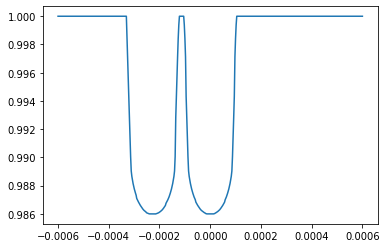

In [3]:
%%time
import numpy as np
import matplotlib.pyplot as plt
import math

mu1 = 0.3
mu2 = 0.1
Intensity_max = 100

def intensity (r_star,r):
    mu = np.sqrt(1 - r**2/r_star**2)
    return Intensity_max*(1-mu1*(1-mu)-mu2*(1 - mu)**2) 


def draw_star(canvas,radius,centre):
    r = radius
    while r > 0:
        for angle in np.linspace(0, 2*np.pi, num=500):
            x = r * math.sin(angle) + centre[0]
            y = r * math.cos(angle) + centre[1]
            try:
                canvas[int(np.round(y))][int(np.round(x))] = int(intensity(radius,r))
            except:
                pass  
        r-=1
        
    canvas[int(round(centre[1]))][int(round(centre[0]))] = Intensity_max
        
    return canvas

def draw_planet(radius,centre):
    r = radius
    planet_canvas = np.ones((100,100))
    
    while r > 0:
        for angle in np.linspace(0, 2*np.pi, num=500):
            x = r * math.sin(angle) + centre[0]
            y = r * math.cos(angle) + centre[1]

            try:
                planet_canvas[int(np.round(y))][int(np.round(x))] = 0
            except:
                pass
        r-=1

    try:
        planet_canvas[int(round(centre[1]))][int(round(centre[0]))] = 0
    except:
        pass
        
    return planet_canvas


# Defining variables and constants
a= 7.8e9 # Semi Major axis
e = 0.0489 # Eccentricity < 1 to work
radius_of_sun = 7e5
radius_of_jupiter = 7e4 
theta = np.linspace(0.6 *-10e-4, 0.6*10e-4, num=500) # Where the planet crossees the star
phase = 0 
f = theta - phase 
r = a*(1 - e**2)/ (1 + e*np.cos(f)) # Distance between the star and the planet
i = 0
omega = np.pi/2
w = omega + phase

    
###################################### Equations of motion
X_3D = - r* np.cos(w +f) 
Y_3D = - r* np.sin(w +f)* np.cos(i)
Z_3D = r* np.sin(w +f)* np.sin(i)


###################################### Set up of display
display_dim = 100
display = np.zeros((display_dim, display_dim))
a = (display_dim - 1)/2
    

#### Planet ####
SF = (radius_of_sun + 2*radius_of_jupiter)

X_coord_on_grid = X_3D/SF * (display_dim/2)  + (display_dim - 1)/2
Z_coord_on_grid = Z_3D/SF * (display_dim/2) + (display_dim - 1)/2

r_planet = radius_of_jupiter/SF *  display_dim/2


X_coord_on_grid = np.round(X_coord_on_grid)

Z_coord_on_grid = np.round(Z_coord_on_grid)
#### Star ####
centre_of_star = [a,a]
r_star = radius_of_sun/SF * display_dim/2

display_with_star = draw_star(display,r_star,centre_of_star)

flux = []

def draw_stage(i,background):
    centre_of_planet = [Z_coord_on_grid[i],X_coord_on_grid[i]]
    
    display_added_planet = draw_planet(r_planet,centre_of_planet)
   
    return display_added_planet * background


for i in range(0,500):
    flux.append(np.sum(draw_stage(i,display_with_star)))

plt.plot(theta[0:500],flux/flux[0])

Using %%time to time how long the program runs for:

Total time with old code for 250 positions = 4 min 8

Star with planet mask total time now for 250 positions = 16.5 seconds

Rounding X and Z arrays before for loop and removing int() for 250 positions = 14.1 seconds

As can be seen, drawing the star once and adding the planet 'mask' on top saves a huge amount of time as the radius of the star is large so takes a long time to fill in. Rounding the whole array instead of individual values also saved some time which is good as it is much easier to do it once rather than 250 times (which would only get worse if I decided to increase the resolution of the orbit). Now that the simulation is more optimised, it leads the way for larger displays for better resolutions and more demanding physical effects can now also be taken into consideration. 

I found that I can round a whole array at once

In [8]:
array_test = np.zeros((2,2)) + np.pi
print (np.round(array_test))

[[3. 3.]
 [3. 3.]]


The other problem I found with the last version of the code is that the planet was appearing twice per transit when it should only appear once. To see if it was a physical mistake or a coding mistake I checked I had the correct orientation of the orbit.

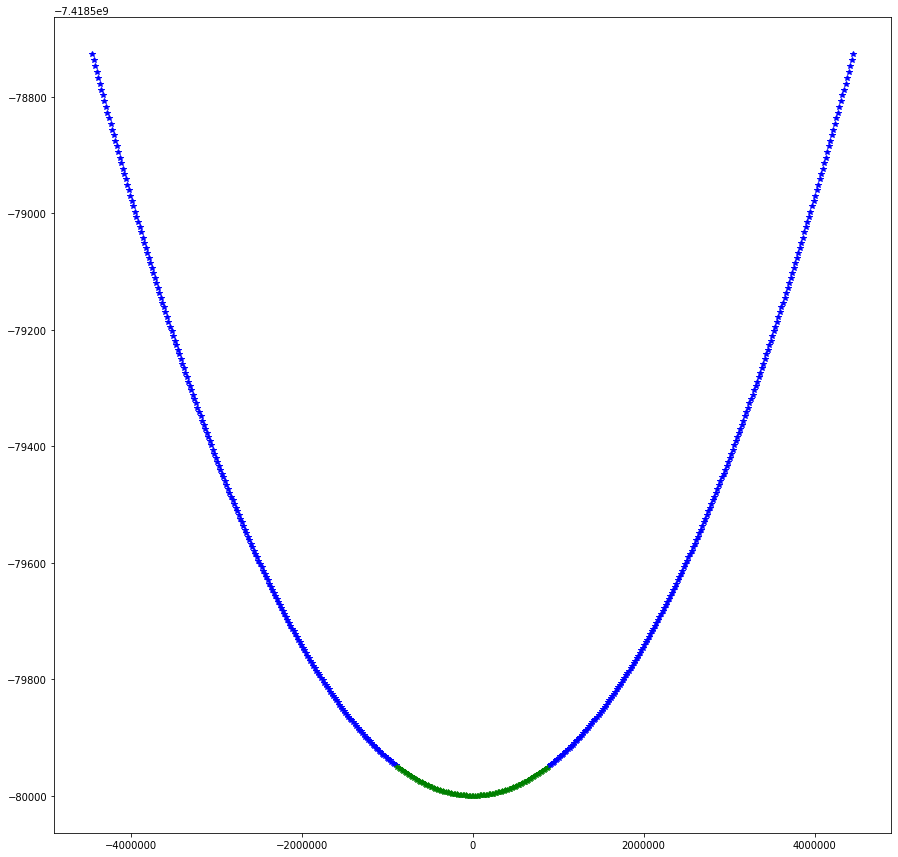

In [28]:
fig = plt.figure(figsize=(15,15))
plt.plot(X_3D[:200], Y_3D[:200], 'b*') 
plt.plot(X_3D[200:300], Y_3D[200:300], 'g*') 
plt.plot(X_3D[300:], Y_3D[300:], 'b*') 

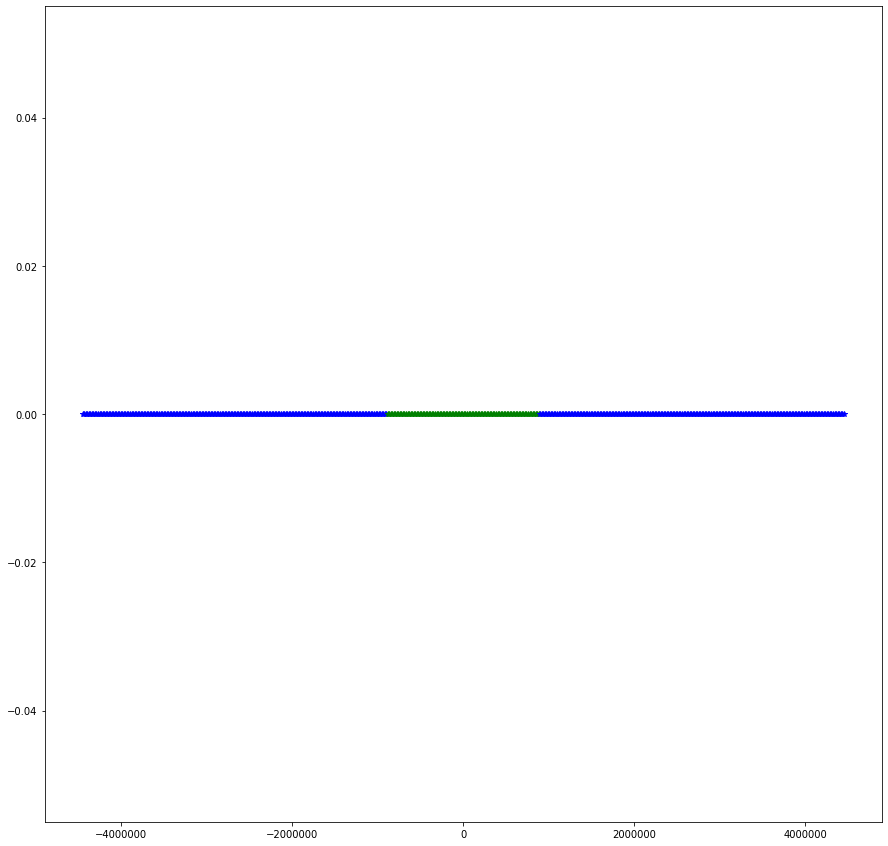

In [25]:
fig = plt.figure(figsize=(15,15))
plt.plot(X_3D[:200], Z_3D[:200], 'b*') 
plt.plot(X_3D[200:300], Z_3D[200:300], 'g*') 
plt.plot(X_3D[300:], Z_3D[300:], 'b*') 

As can be seen, the 'apex' of the orbit in the the XY plane is in the middle of the XZ plane meaning each X value should only appear once in the transit. Since this is correct, it must be a coding error causing this bug.

### Version 1.5:

<div class="alert alert-block alert-success">
<b>Fixes:</b> 

* Swapped X and Z so that planet orbits left to right.
* Changed the draw_planet to only draw the planet when it is on the display and removed the try/except which seems to solve the double planet issue
* Now that the simulation runs quickly, I've increased the number of angles the circle is evaluated at to get rid of the purple spots I noticed earlier.
</div>



In [ ]:
%%time
from celluloid import Camera
import numpy as np
import matplotlib.pyplot as plt
import math

mu1 = 0.3
mu2 = 0.1
Intensity_max = 100

def intensity (r_star,r):
    mu = np.sqrt(1 - r**2/r_star**2)
    return Intensity_max*(1-mu1*(1-mu)-mu2*(1 - mu)**2) 


def draw_star(canvas,radius,centre):
    r = radius
    while r > 0:
        for angle in np.linspace(0, 2*np.pi, num=720):
            x = r * math.sin(angle) + centre[0]
            y = r * math.cos(angle) + centre[1]
            try:
                canvas[int(np.round(y))][int(np.round(x))] = int(intensity(radius,r))
            except:
                pass  
        r-=1
        
    canvas[int(round(centre[1]))][int(round(centre[0]))] = Intensity_max
        
    return canvas

def draw_planet(radius,centre,display_size):
    r = radius
    planet_canvas = np.ones((100,100))
    
    while r > 0:
        for angle in np.linspace(0, 2*np.pi, num=500):
            x = r * math.sin(angle) + centre[0]
            y = r * math.cos(angle) + centre[1]

            if int(np.round(x)) < display_size and int(np.round(x)) > 0:
                planet_canvas[int(np.round(y))][int(np.round(x))] = 0
        r-=1

    if int(np.round(x)) < display_size and int(np.round(x)) > 0:
        planet_canvas[int(round(centre[1]))][int(round(centre[0]))] = 0

        
    return planet_canvas


# Defining variables and constants
a= 7.8e9 # Semi Major axis
e = 0.0489 # Eccentricity < 1 to work
radius_of_sun = 7e5
radius_of_jupiter = 7e4 
theta = np.linspace(0.6 *-10e-4, 0.6*10e-4, num=500) # Where the planet crossees the star
phase = 0 
f = theta - phase 
r = a*(1 - e**2)/ (1 + e*np.cos(f)) # Distance between the star and the planet
i = 0
omega = np.pi/2
w = omega + phase

    
###################################### Equations of motion
X_3D = - r* np.cos(w +f) 
Y_3D = - r* np.sin(w +f)* np.cos(i)
Z_3D = r* np.sin(w +f)* np.sin(i)


###################################### Set up of display
display_dim = 100
display = np.zeros((display_dim, display_dim))
a = (display_dim - 1)/2
    

#### Planet ####
SF = (radius_of_sun + 2*radius_of_jupiter)

X_coord_on_grid = X_3D/SF * (display_dim/2)  + (display_dim - 1)/2
Z_coord_on_grid = Z_3D/SF * (display_dim/2) + (display_dim - 1)/2

r_planet = radius_of_jupiter/SF *  display_dim/2


X_coord_on_grid = np.round(X_coord_on_grid)

Z_coord_on_grid = np.round(Z_coord_on_grid)

#### Star ####
centre_of_star = [a,a]
r_star = radius_of_sun/SF * display_dim/2

display_with_star = draw_star(display,r_star,centre_of_star)

flux = []

def draw_stage(i,background):
    centre_of_planet = [X_coord_on_grid[i],Z_coord_on_grid[i]]
    
    display_added_planet = draw_planet(r_planet,centre_of_planet,display_dim)
   
    return display_added_planet * background


fig = plt.figure(figsize=(15,15))
camera = Camera(fig)
ax = plt.axes()


for i in range(int(len(X_3D))):
    ax.imshow(draw_stage(i,display_with_star), interpolation='nearest')
    plt.pause(0.1)
    camera.snap()
    

animation = camera.animate()
animation.save("1.gif", writer='PillowWriter', fps=10)

<Figure size 1500x1500 with 1 Axes>

MovieWriter PillowWriter unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.


## Change of philosophy

Whilst looking looking through the numpy functions when I was bored, I saw some functions which I though might be useful:

In [2]:
import numpy as np
dir(np)

['ALLOW_THREADS',
 'AxisError',
 'BUFSIZE',
 'CLIP',
 'ComplexWarning',
 'DataSource',
 'ERR_CALL',
 'ERR_DEFAULT',
 'ERR_IGNORE',
 'ERR_LOG',
 'ERR_PRINT',
 'ERR_RAISE',
 'ERR_WARN',
 'FLOATING_POINT_SUPPORT',
 'FPE_DIVIDEBYZERO',
 'FPE_INVALID',
 'FPE_OVERFLOW',
 'FPE_UNDERFLOW',
 'False_',
 'Inf',
 'Infinity',
 'MAXDIMS',
 'MAY_SHARE_BOUNDS',
 'MAY_SHARE_EXACT',
 'MachAr',
 'ModuleDeprecationWarning',
 'NAN',
 'NINF',
 'NZERO',
 'NaN',
 'PINF',
 'PZERO',
 'RAISE',
 'RankWarning',
 'SHIFT_DIVIDEBYZERO',
 'SHIFT_INVALID',
 'SHIFT_OVERFLOW',
 'SHIFT_UNDERFLOW',
 'ScalarType',
 'Tester',
 'TooHardError',
 'True_',
 'UFUNC_BUFSIZE_DEFAULT',
 'UFUNC_PYVALS_NAME',
 'VisibleDeprecationWarning',
 'WRAP',
 '_NoValue',
 '_UFUNC_API',
 '__NUMPY_SETUP__',
 '__all__',
 '__builtins__',
 '__cached__',
 '__config__',
 '__doc__',
 '__file__',
 '__git_revision__',
 '__loader__',
 '__mkl_version__',
 '__name__',
 '__package__',
 '__path__',
 '__spec__',
 '__version__',
 '_add_newdoc_ufunc',
 '_distribu

Numpy.block looked promising as a way of doing the same static planet canvas way of drawing the star as a smaller array and surrounding it with the required amount of zeros in each dimension to place it in the right place in relation to the star. The problem with this is that it seems like a lot of work to move the planet around and it gets complicated when the planet is only being partially displayed. 

In [4]:
help(np.block)

Help on function block in module numpy:

block(arrays)
    Assemble an nd-array from nested lists of blocks.
    
    Blocks in the innermost lists are concatenated (see `concatenate`) along
    the last dimension (-1), then these are concatenated along the
    second-last dimension (-2), and so on until the outermost list is reached.
    
    Blocks can be of any dimension, but will not be broadcasted using the normal
    rules. Instead, leading axes of size 1 are inserted, to make ``block.ndim``
    the same for all blocks. This is primarily useful for working with scalars,
    and means that code like ``np.block([v, 1])`` is valid, where
    ``v.ndim == 1``.
    
    When the nested list is two levels deep, this allows block matrices to be
    constructed from their components.
    
    .. versionadded:: 1.13.0
    
    Parameters
    ----------
    arrays : nested list of array_like or scalars (but not tuples)
        If passed a single ndarray or scalar (a nested list of depth 0),

I did try messing around with it though to see if I could make it work.

In [5]:
x = np.array([[1,2,3],[4,5,6]])
y = np.ones((2,2))
#z = np.block([[np.zeros(5,5),x],[np.zeros(2,2),x,np.zeros(2,2)]])



A = np.eye(2) * 2
B = np.eye(3) * 3
np.block([[np.zeros((2, 5))],[np.ones((3, 1)), B, np.ones((3, 1)) ],[np.zeros((2, 5))]])

array([[0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.],
       [1., 3., 0., 0., 1.],
       [1., 0., 3., 0., 1.],
       [1., 0., 0., 3., 1.],
       [0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.]])

I also found the function Numpy.fromfunction which allows an array to be processed as coordinated and have a function act at each coordinate. This is exactly what I'm try to do with my code in the first place, so a function that does it automatically (which is probably much better since it was written by developer that actually know what they are doing) seems like a great idea. 

In [7]:
help(np.fromfunction)

Help on function fromfunction in module numpy:

fromfunction(function, shape, **kwargs)
    Construct an array by executing a function over each coordinate.
    
    The resulting array therefore has a value ``fn(x, y, z)`` at
    coordinate ``(x, y, z)``.
    
    Parameters
    ----------
    function : callable
        The function is called with N parameters, where N is the rank of
        `shape`.  Each parameter represents the coordinates of the array
        varying along a specific axis.  For example, if `shape`
        were ``(2, 2)``, then the parameters would be
        ``array([[0, 0], [1, 1]])`` and ``array([[0, 1], [0, 1]])``
    shape : (N,) tuple of ints
        Shape of the output array, which also determines the shape of
        the coordinate arrays passed to `function`.
    dtype : data-type, optional
        Data-type of the coordinate arrays passed to `function`.
        By default, `dtype` is float.
    
    Returns
    -------
    fromfunction : any
        The 

First, I tried using it to draw a circle.

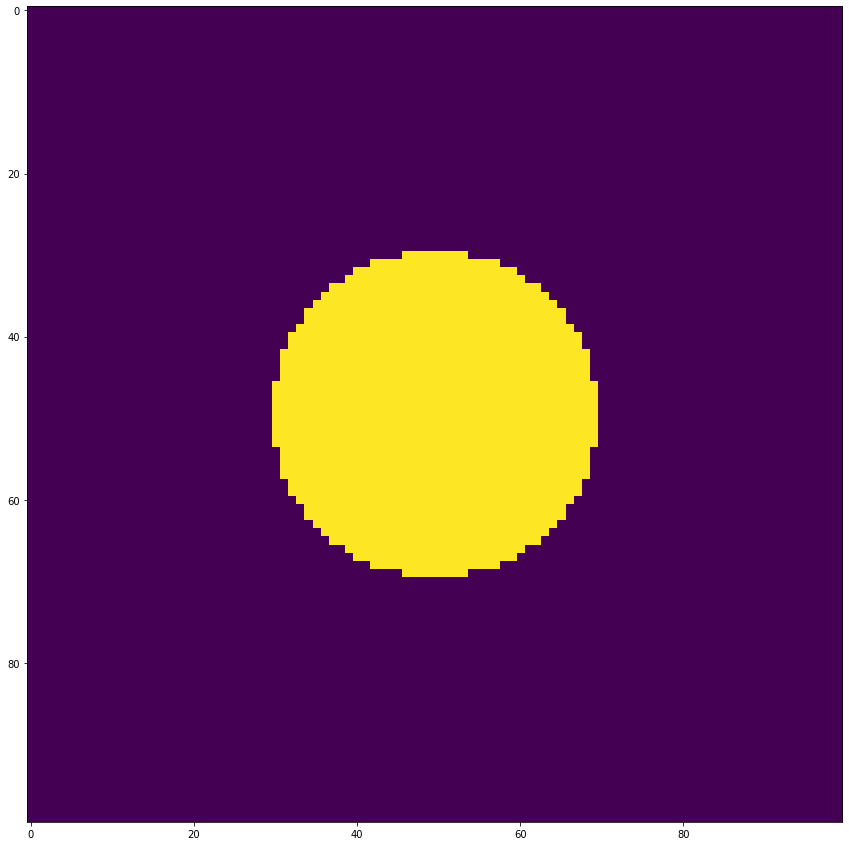

In [38]:
display_dim =100
import matplotlib.pyplot as plt

def hello(x,y):
    return (x-(display_dim - 1)/2)**2 + (y-(display_dim - 1)/2)**2 <= 20**2

circle = np.fromfunction(hello, (display_dim, display_dim), dtype=int)
fig = plt.figure(figsize=(15,15))
plt.imshow(circle, interpolation='nearest')
plt.show()

Then I compared it to the circle drawn in my previous code

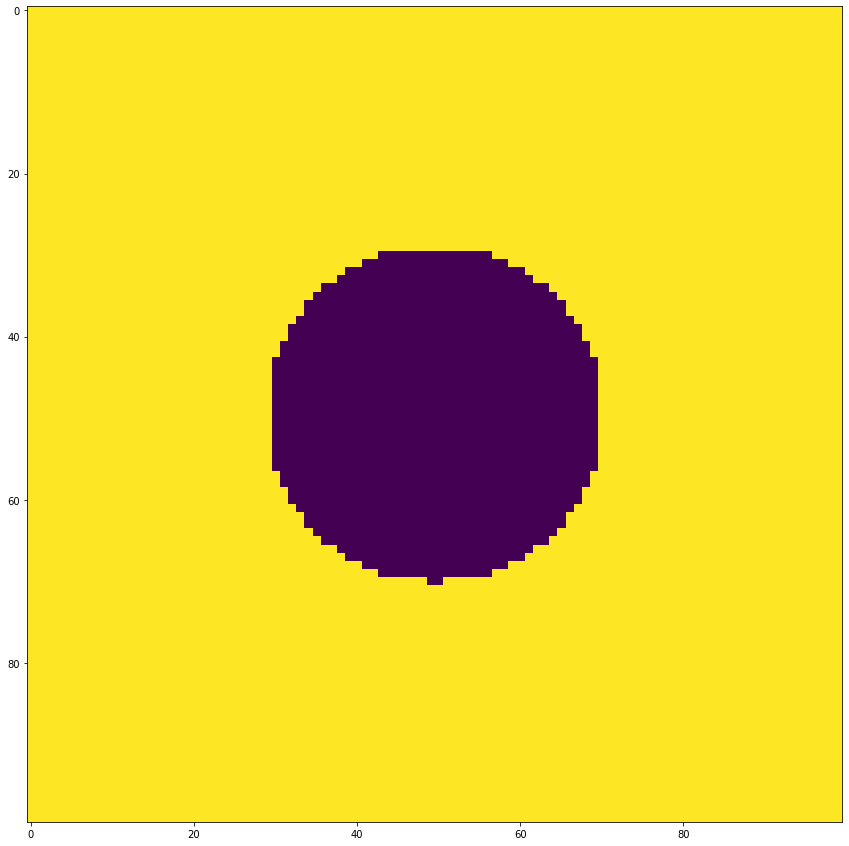

In [39]:
def draw_planet(radius,centre):
    r = radius
    planet_canvas = np.ones((100,100))
    
    while r > 0:
        for angle in np.linspace(0, 2*np.pi, num=800):
            x = r * math.sin(angle) + centre[0]
            y = r * math.cos(angle) + centre[1]

            try:
                planet_canvas[int(np.round(y))][int(np.round(x))] = 0
            except:
                pass
        r-=1

    try:
        planet_canvas[int(round(centre[1]))][int(round(centre[0]))] = 0
    except:
        pass
        
    return planet_canvas

a = (display_dim - 1)/2
fig = plt.figure(figsize=(15,15))
planet = draw_planet(20,[a,a])
plt.imshow(planet, interpolation='nearest')
plt.show()

To test if the circles were the same, I added them together (since one was 1 inside the circle and the other was 0 inside the circle) to see if there were any differences. To my suprise, there was an outer ring missing from the fromfuctions circle. Further investigation found that they had values of radius close to the radius of the circle but slighly more. This is probably due to the way the coordinates were rounded in the old method. Although this will now make circles at smaller radii look more 'cross' like, the resolution of the display can be increased so much by the time saving of this new way that it shouldn't matter. Also, scaling the radius by 10% also seems to give a more rounded circle like the old method if needed.

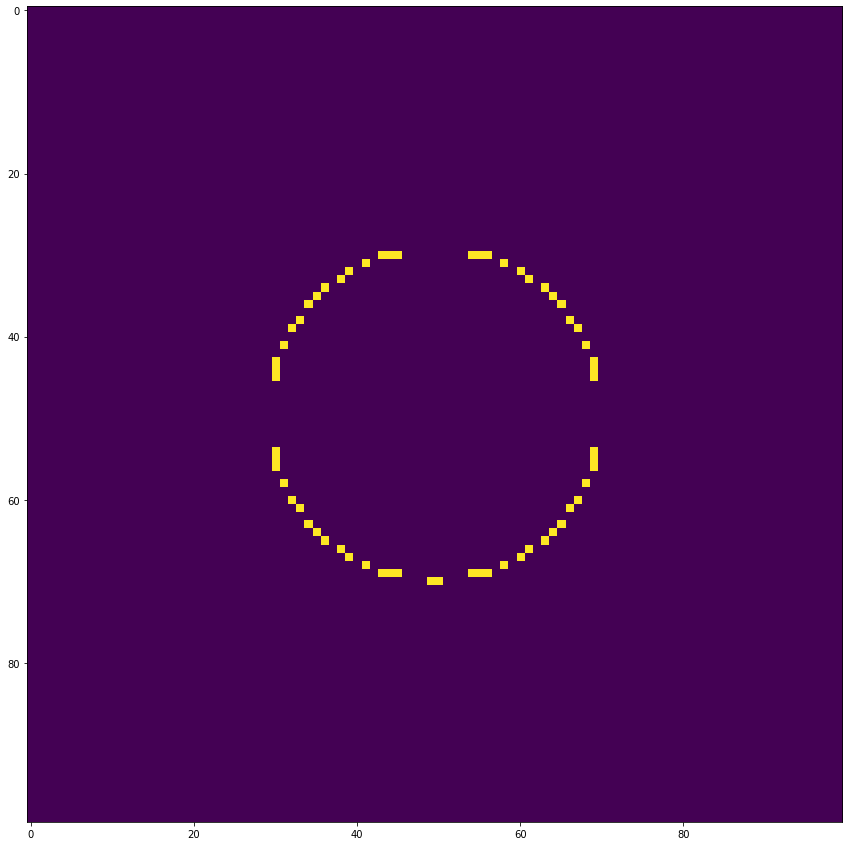

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]
62.0


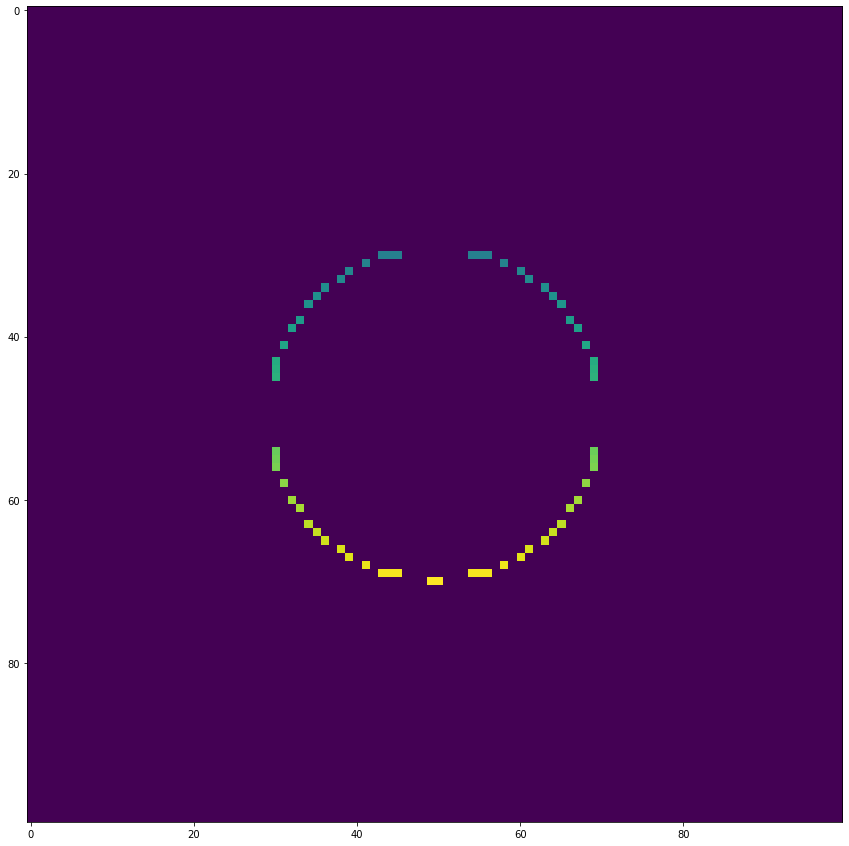

[30.43 30.44 30.45 30.54 30.55 30.56 31.41 31.58 32.39 32.6  33.38 33.61
 34.36 34.63 35.35 35.64 36.34 36.65 38.33 38.66 39.32 39.67 41.31 41.68
 43.3  43.69 44.3  44.69 45.3  45.69 54.3  54.69 55.3  55.69 56.3  56.69
 58.31 58.68 60.32 60.67 61.33 61.66 63.34 63.65 64.35 64.64 65.36 65.63
 66.38 66.61 67.39 67.6  68.41 68.58 69.43 69.44 69.45 69.54 69.55 69.56
 70.49 70.5 ]
[30. 30. 30. 30. 30. 30. 31. 31. 32. 32. 33. 33. 34. 34. 35. 35. 36. 36.
 38. 38. 39. 39. 41. 41. 43. 43. 44. 44. 45. 45. 54. 54. 55. 55. 56. 56.
 58. 58. 60. 60. 61. 61. 63. 63. 64. 64. 65. 65. 66. 66. 67. 67. 68. 68.
 69. 69. 69. 69. 69. 69. 70. 70.]
[43. 44. 45. 54. 55. 56. 41. 58. 39. 60. 38. 61. 36. 63. 35. 64. 34. 65.
 33. 66. 32. 67. 31. 68. 30. 69. 30. 69. 30. 69. 30. 69. 30. 69. 30. 69.
 31. 68. 32. 67. 33. 66. 34. 65. 35. 64. 36. 63. 38. 61. 39. 60. 41. 58.
 43. 44. 45. 54. 55. 56. 49. 50.]


In [50]:
difference = planet+circle


difference[difference == 0] = 5
difference[difference != 5] = 0
difference[difference == 5] = 1

fig = plt.figure(figsize=(15,15))
plt.imshow(difference, interpolation='nearest')
plt.show()
print (difference[0])
print (np.sum(difference))

def lol(x,y):
    return x+y/100
circleoftruth = np.fromfunction(lol, (display_dim, display_dim), dtype=int)

coord = difference*circleoftruth

fig = plt.figure(figsize=(15,15))
plt.imshow(coord, interpolation='nearest')
plt.show()

diffcoords = coord[coord != 0]

xcoord = np.floor(diffcoords)
ycoord = (diffcoords - xcoord)*100
print(diffcoords)
print (xcoord)
print(ycoord)

In [43]:
centre

[30, 20]

In [47]:
radius_over = np.square(xcoord-49.5) +np.square(ycoord-49.5)
print (radius_over)

[422.5 410.5 400.5 400.5 410.5 422.5 414.5 414.5 416.5 416.5 404.5 404.5
 422.5 422.5 420.5 420.5 422.5 422.5 404.5 404.5 416.5 416.5 414.5 414.5
 422.5 422.5 410.5 410.5 400.5 400.5 400.5 400.5 410.5 410.5 422.5 422.5
 414.5 414.5 416.5 416.5 404.5 404.5 422.5 422.5 420.5 420.5 422.5 422.5
 404.5 404.5 416.5 416.5 414.5 414.5 422.5 410.5 400.5 400.5 410.5 422.5
 420.5 420.5]


In [48]:
np.sqrt(radius_over.max())

20.554804791094735

Since I was so suprised at how fast the circle using the fromfunction loaded, I decided to increase the dimensions to 1000 X 1000 to see how fast it would load.  To my suprise, it was taking around half a second. I compared this to the previous method of drawing circles which took around 10 seconds to do the drawing and had loads of places in the circle that hadn't been filled in since the number of angles was too small. Therefore, more angles would have to be considered to fully fill in the circle (a problem that will get worse with size and there take a lot more time). 

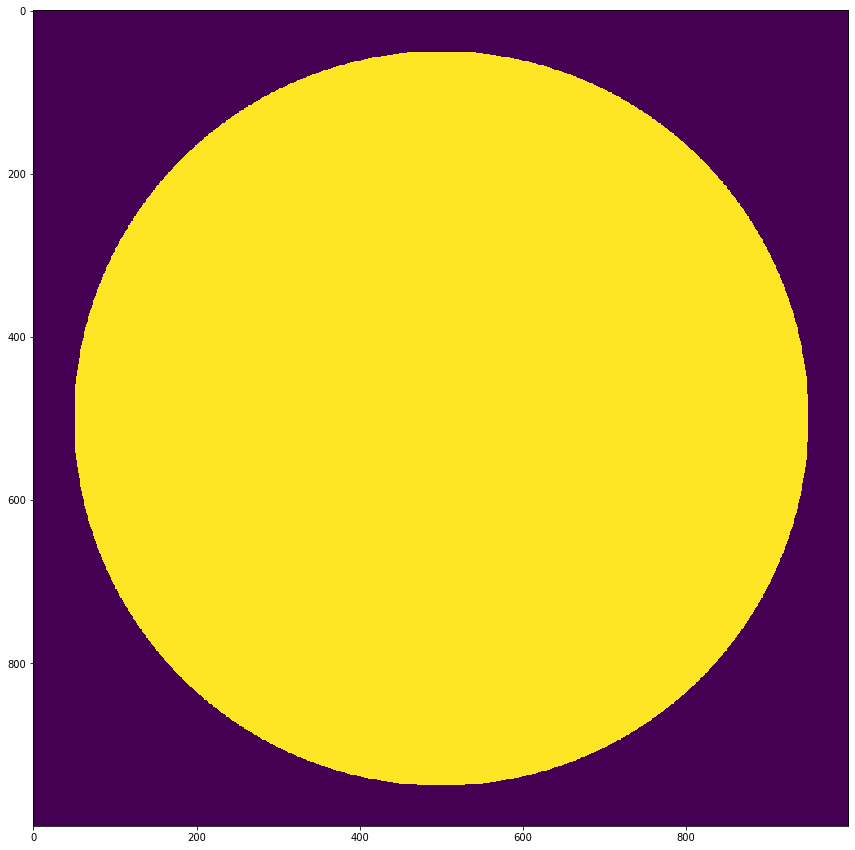

CPU times: user 933 ms, sys: 57.1 ms, total: 990 ms
Wall time: 600 ms


In [22]:
%%time
def hello(x,y):
    return (x-500)**2 + (y-500)**2 < 450**2


planet_canvas = 1*np.fromfunction(hello, (1000, 1000), dtype=int)

fig = plt.figure(figsize=(15,15))
plt.imshow(planet_canvas, interpolation='nearest')
plt.show()

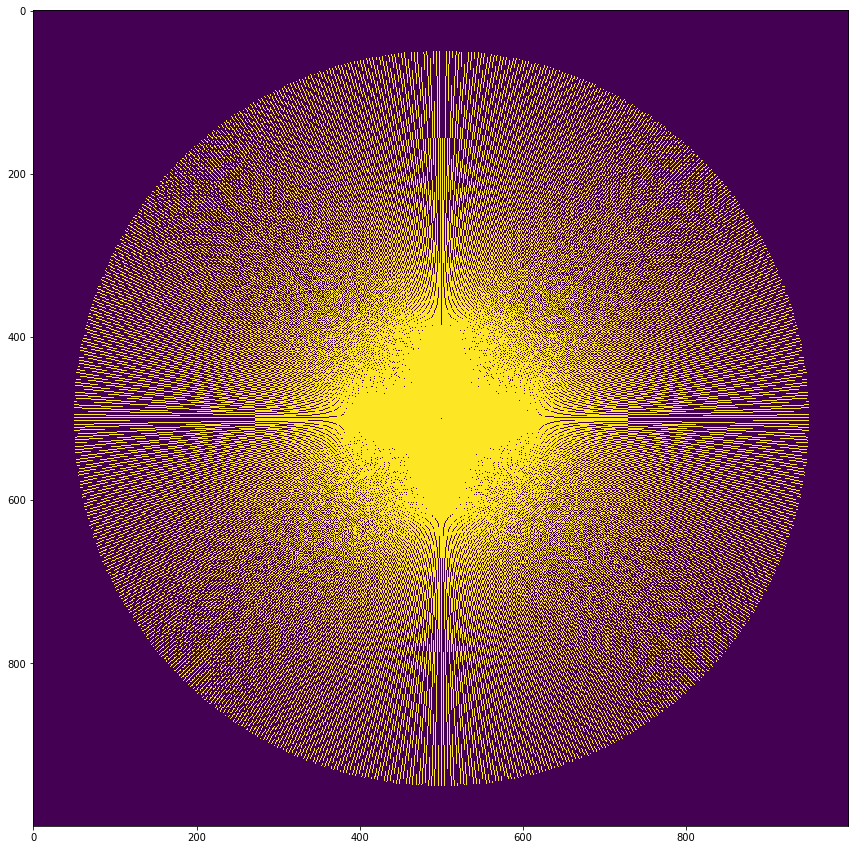

CPU times: user 11.3 s, sys: 110 ms, total: 11.4 s
Wall time: 11.1 s


In [32]:
%%time
def draw_planet(radius,centre):
    r = radius
    planet_canvas = np.zeros((1000,1000))
    
    while r > 0:
        for angle in np.linspace(0, 2*np.pi, num=720):
            x = r * math.sin(angle) + centre[0]
            y = r * math.cos(angle) + centre[1]

            try:
                planet_canvas[int(np.round(y))][int(np.round(x))] = 1
            except:
                pass
        r-=1

    try:
        rcanvas[int(round(centre[1]))][int(round(centre[0]))] = 1
    except:
        pass
        
    return planet_canvas

fig = plt.figure(figsize=(15,15))
plt.imshow(draw_planet(450,(500,500)), interpolation='nearest')
plt.show()

Seeing this I decided to also draw the star using the fromfunction function. Initially, I got error messages since the radius is calculated for all values in the array and values of r outside of the circle give an imaginary mu value, although this was later fixed by looking at the parameters of the square root function which allowed me to specify a condition for the function so that only values inside the circle were evaluated.

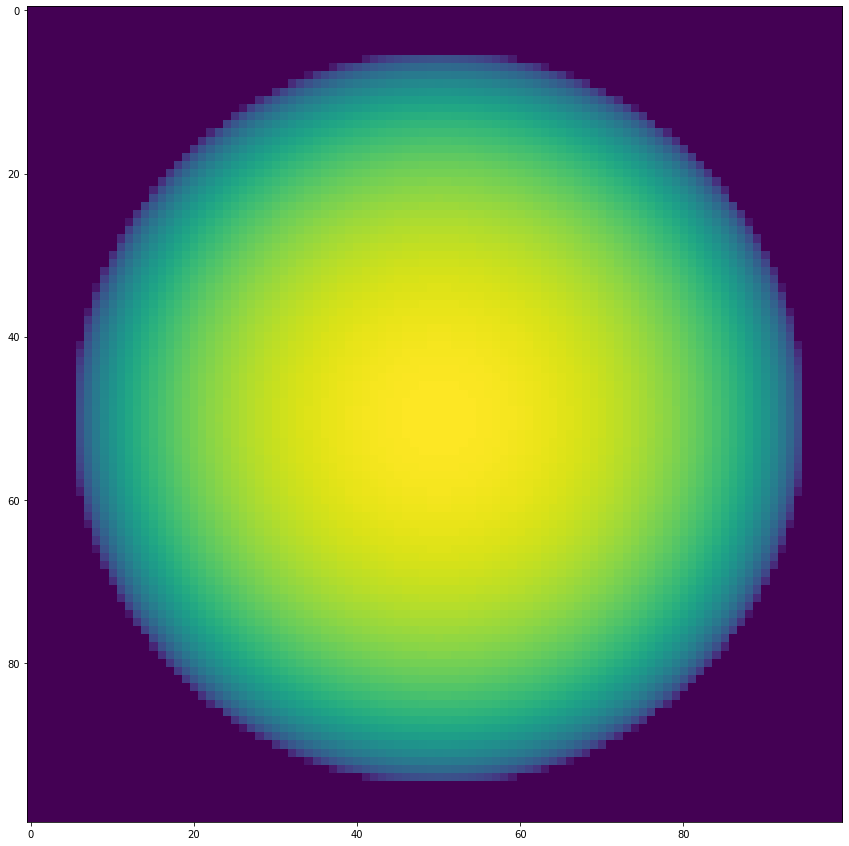

In [30]:
def intensity (x,y):
    r_star = 45
    r_squared= (x-50)**2 + (y-50)**2
    mu = 1*np.sqrt(1 - r_squared/r_star**2,where=(x-50)**2 + (y-50)**2 < 45**2)
    return Intensity_max*(1-mu1*(1-mu)-mu2*(1 - mu)**2) 

star_canvas = np.fromfunction(intensity, (100, 100), dtype=int)

fig = plt.figure(figsize=(15,15))
plt.imshow(star_canvas, interpolation='nearest')
plt.show()

The resulting image doesn't look like the limb darkening calculated before but at the time, I thought this was just due to scaling and decided to add it into the program.

CPU times: user 14.5 s, sys: 77.9 ms, total: 14.6 s
Wall time: 14.7 s


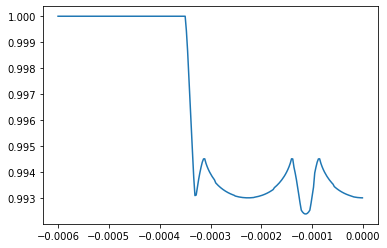

In [31]:
%%time
import numpy as np
import matplotlib.pyplot as plt
import math

mu1 = 0.3
mu2 = 0.1
Intensity_max = 100

def intensity (x,y):
    global r_star,centre_of_star
    r_squared= (x-centre_of_star[1])**2 + (y-centre_of_star[1])**2
    mu = np.sqrt(1 - r_squared/r_star**2,where=(r_squared < r_star**2))
    return Intensity_max*(1-mu1*(1-mu)-mu2*(1 - mu)**2) 


def draw_planet(radius,centre):
    r = radius
    planet_canvas = np.ones((100,100))
    
    while r > 0:
        for angle in np.linspace(0, 2*np.pi, num=500):
            x = r * math.sin(angle) + centre[0]
            y = r * math.cos(angle) + centre[1]

            try:
                planet_canvas[int(np.round(y))][int(np.round(x))] = 0
            except:
                pass
        r-=1

    try:
        planet_canvas[int(round(centre[1]))][int(round(centre[0]))] = 0
    except:
        pass
        
    return planet_canvas


# Defining variables and constants
a= 7.8e9 # Semi Major axis
e = 0.0489 # Eccentricity < 1 to work
radius_of_sun = 7e5
radius_of_jupiter = 7e4 
theta = np.linspace(0.6 *-10e-4, 0.6*10e-4, num=500) # Where the planet crossees the star
phase = 0 
f = theta - phase 
r = a*(1 - e**2)/ (1 + e*np.cos(f)) # Distance between the star and the planet
i = 0
omega = np.pi/2
w = omega + phase

    
###################################### Equations of motion
X_3D = - r* np.cos(w +f) 
Y_3D = - r* np.sin(w +f)* np.cos(i)
Z_3D = r* np.sin(w +f)* np.sin(i)


###################################### Set up of display
display_dim = 100
display = np.zeros((display_dim, display_dim))
a = (display_dim - 1)/2
    

#### Planet ####
SF = (radius_of_sun + 2*radius_of_jupiter)

X_coord_on_grid = X_3D/SF * (display_dim/2)  + (display_dim - 1)/2
Z_coord_on_grid = Z_3D/SF * (display_dim/2) + (display_dim - 1)/2

r_planet = radius_of_jupiter/SF *  display_dim/2


X_coord_on_grid = np.round(X_coord_on_grid)

Z_coord_on_grid = np.round(Z_coord_on_grid)

#### Star ####
centre_of_star = [a,a]
r_star = radius_of_sun/SF * display_dim/2

draw_star = np.fromfunction(intensity,(100, 100), dtype=int)

display_with_star = draw_star

flux = []

def draw_stage(i,background):
    centre_of_planet = [Z_coord_on_grid[i],X_coord_on_grid[i]]
    
    display_added_planet = draw_planet(r_planet,centre_of_planet)
    return display_added_planet * background


for i in range(0,250):
    flux.append(np.sum(draw_stage(i,display_with_star)))

    

plt.plot(theta[0:250],flux/flux[0])

Looking at the graph it produced, I realised there must be something wrong with the star drawing as it was giving me wildly different results after only changing that piece of code.

After a while, I realised that this was due to the fact that cells outside of the array still had non zero intensitys as mu = 0 still gives a non zero intensity. I rectifyed this by adding a 'circle mask' whick multiplied values inside the circle by one and by zero outside the circle. This seemed to fix the issue.  

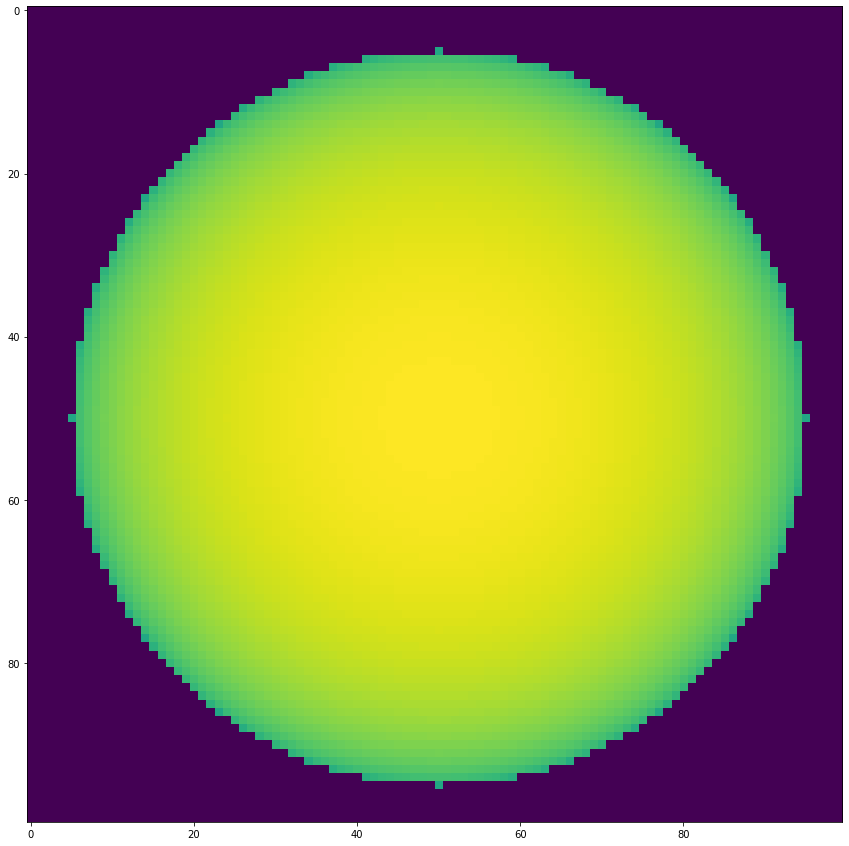

CPU times: user 872 ms, sys: 36.1 ms, total: 908 ms
Wall time: 513 ms


In [32]:
%%time
mu1 = 0.3
mu2 = 0.1
Intensity_max = 100
r_star = 45
centre_of_star = [50,50]

def intensity (x,y):
    global r_star,centre_of_star
    r_squared= (x-centre_of_star[1])**2 + (y-centre_of_star[1])**2
    circle_mask = (x-centre_of_star[1])**2 + (y-centre_of_star[1])**2 <= r_star**2
    mu = np.sqrt(1 - r_squared/r_star**2,where=((x-centre_of_star[1])**2 + (y-centre_of_star[1])**2 <= r_star**2))
    
    return Intensity_max*(1-mu1*(1-mu)-mu2*(1 - mu)**2)*circle_mask



draw_star = np.fromfunction(intensity,(100, 100), dtype=int)
fig = plt.figure(figsize=(15,15))
plt.imshow(draw_star, interpolation='nearest')
plt.show()

I next tried to draw the circle in two different places by interating through an array of centres. Since the fromfunction gives two arguments to the function, I couldn't find a way to add more parameters to the function to specify the centre. Therefore, I had to use a global variable to do it instead. I am not 100% happy with this as it does not seem very elegant and might be confusing mixing variables betweens functions but it will have to do. It also means that the function can only be used for one planet at a time which is against the spirit of functions. 

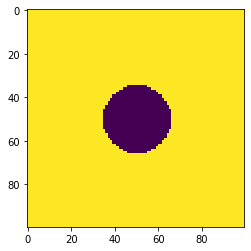

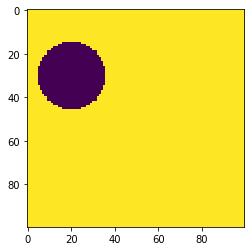

In [22]:
import numpy as np
import matplotlib.pyplot as plt
def planet_writer(x,y):
    global centre
    r=3
    return (x-centre[0])**2 + (y-centre[1])**2 >r**5


centres_array = [[50,50],[30,20]]

for i in range (2):
    centre = centres_array [i]
    planet_canvas = 1* np.fromfunction(planet_writer, (100, 100), dtype=int)
    
    plt.imshow(planet_canvas, interpolation='nearest')
    plt.show()

Finally, I added all of the pieces together. I am really happy with this result as it now takes around 200ms to do all 500 coordinate values instead of 14 seconds to do 250. I can also do 1000 X 1000 in around 15 seconds without any modifications, which means the circles look round without the need for interpolation. This allows me a much larger scope for increasing the resolution of the simulation (i.e. coordinated measured at and display size) without overheating my computer.

## Version 1.6:
Version 1.5 but using the numpy.fromfunction to make everything really fast

CPU times: user 164 ms, sys: 6.24 ms, total: 170 ms
Wall time: 178 ms


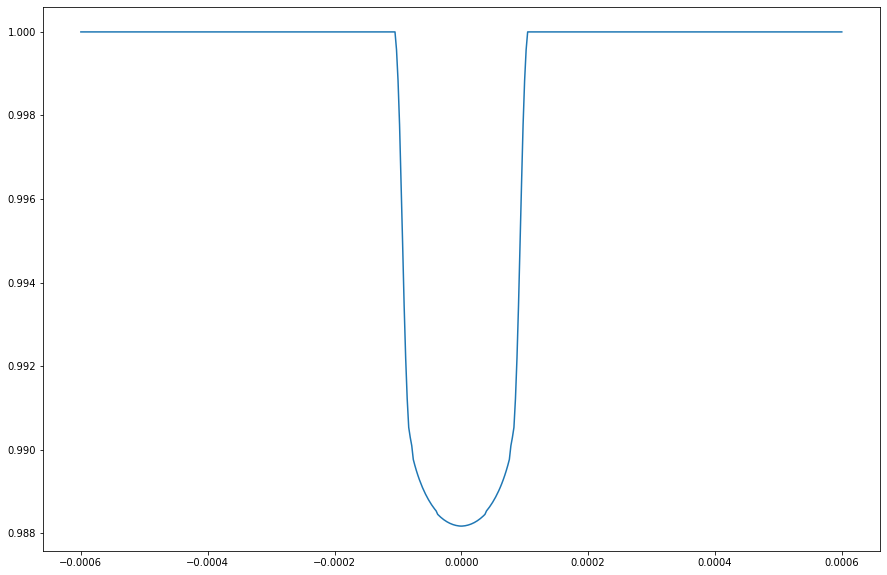

In [10]:
%%time
# Times how long it takes for the program to run

import numpy as np
import matplotlib.pyplot as plt

def intensity (x,y): # Draws the star with limb darkening  
    global r_star,centre_of_star
    r_squared= (x-centre_of_star[1])**2 + (y-centre_of_star[1])**2
    circle_mask = (x-centre_of_star[1])**2 + (y-centre_of_star[1])**2 <= r_star**2
    mu = np.sqrt(1 - r_squared/r_star**2,where=((x-centre_of_star[1])**2 + (y-centre_of_star[1])**2 <= r_star**2))
    
    return Intensity_max*(1-mu1*(1-mu)-mu2*(1 - mu)**2)*circle_mask

def planet_writer(x,y): # Draws the planet at the given centre  
    global centre_of_planet,r_planet
    return (x-centre_of_planet[1])**2 + (y-centre_of_planet[0])**2 > (r_planet)**2


def draw_stage(i,background): # Adds together the planet and star onto the same canvas
    global centre_of_planet, display_dim
    centre_of_planet = [X_coord_on_grid[i],Z_coord_on_grid[i]]
    
    display_added_planet = 1 * np.fromfunction(planet_writer, (display_dim, display_dim), dtype=int)
   
    return display_added_planet * background

###################################### Defining variables and constants

### Physical dimensions
radius_of_sun = 7e5 # Planet radius
radius_of_jupiter = 7e4 # Star radius

#### Stuff for orbit
a= 7.8e9 # Semi Major axis
e = 0.0489 # Eccentricity < 1 to work
theta = np.linspace(-0.6 *10e-4, 0.6*10e-4, num=500) # Angular range where the planet crosses the star
phase = 0 
f = theta - phase 
r = a*(1 - e**2)/ (1 + e*np.cos(f)) # Distance between the star and the planet
i = 0
omega = np.pi/2
w = omega + phase

#### Stuff for Limb Darkening
mu1 = 0.3 # Variables for limb darkening 
mu2 = 0.1 # Variables for limb darkening 
Intensity_max = 100 # Max Intensity for limb darkening

### Stuff for Display
display_dim = 100 # Size of the 'display'

### Stuff for Flux graph
flux = []
###################################### Equations of motion
X_3D = - r* np.cos(w +f) 
Y_3D = - r* np.sin(w +f)* np.cos(i)
Z_3D = r* np.sin(w +f)* np.sin(i)

###################################### Set up of display
display = np.zeros((display_dim, display_dim))
centre_of_display = display_dim/2

###################################### Planet
SF = (radius_of_sun + 2*radius_of_jupiter) # Scaling display to fit star/planet

X_coord_on_grid = np.round(X_3D/SF * centre_of_display + centre_of_display) # Scaling X with respect to display
Z_coord_on_grid = np.round(Z_3D/SF * centre_of_display + centre_of_display) # Scaling Z with respect to display

r_planet = radius_of_jupiter/SF *  display_dim/2 # Scaling planet radius with respect to display
###################################### Star 
centre_of_star = [centre_of_display,centre_of_display] # Centre of star
r_star = radius_of_sun/SF * display_dim/2 # Scaling star centre with respect to display

display_with_star = np.fromfunction(intensity,(display_dim, display_dim), dtype=int) # Drawing Star
###################################### Putting everything together

for i in range(0,500):
    display = np.sum(draw_stage(i,display_with_star)) # Drawing the star/planet at each planet centre
    flux.append(display)

fig = plt.figure(figsize=(15,10))
plt.plot(theta[0:500],flux/flux[0])

<div class="alert alert-block alert-info">
<b>Project info:</b> I recieved the flux code back from *****
</div>

### Code from ******  with flux:

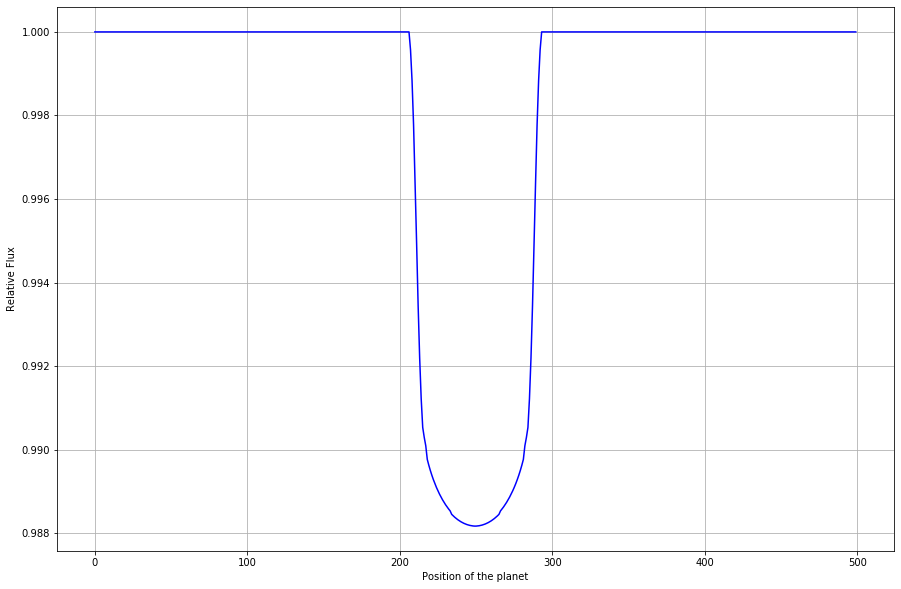

In [68]:
import numpy as np
import matplotlib.pyplot as plt

def intensity (x,y): # Draws the star with limb darkening  
    global r_star,centre_of_star
    r_squared= (x-centre_of_star[1])**2 + (y-centre_of_star[1])**2
    circle_mask = (x-centre_of_star[1])**2 + (y-centre_of_star[1])**2 <= r_star**2
    mu = np.sqrt(1 - r_squared/r_star**2,where=((x-centre_of_star[1])**2 + (y-centre_of_star[1])**2 <= r_star**2))
    
    return Intensity_max*(1-mu1*(1-mu)-mu2*(1 - mu)**2)*circle_mask

def planet_writer(x,y): # Draws the planet at the given centre  
    global centre_of_planet,r_planet
    return (x-centre_of_planet[1])**2 + (y-centre_of_planet[0])**2 > (r_planet)**2


def draw_stage(i,background): # Adds together the planet and star onto the same canvas
    global centre_of_planet, display_dim
    centre_of_planet = [X_coord_on_grid[i],Z_coord_on_grid[i]]
    
    display_added_planet = 1 * np.fromfunction(planet_writer, (display_dim, display_dim), dtype=int)
   
    return display_added_planet * background

###################################### Defining variables and constants

### Physical dimensions
radius_of_sun = 7e5 # Planet radius
radius_of_jupiter = 7e4 # Star radius

#### Stuff for orbit
a= 7.8e9 # Semi Major axis
e = 0.0489 # Eccentricity < 1 to work
theta = np.linspace(-0.6 *10e-4, 0.6*10e-4, num=500) # Angular range where the planet crosses the star
phase = 0 
f = theta - phase 
r = a*(1 - e**2)/ (1 + e*np.cos(f)) # Distance between the star and the planet
i = 0
omega = np.pi/2
w = omega + phase

#### Stuff for Limb Darkening
mu1 = 0.3 # Variables for limb darkening 
mu2 = 0.1 # Variables for limb darkening 
Intensity_max = 100 # Max Intensity for limb darkening

### Stuff for Display
display_dim = 100 # Size of the 'display'

### Stuff for Flux graph
flux = []
###################################### Equations of motion
X_3D = - r* np.cos(w +f) 
Y_3D = - r* np.sin(w +f)* np.cos(i)
Z_3D = r* np.sin(w +f)* np.sin(i)

###################################### Set up of display
display = np.zeros((display_dim, display_dim))
centre_of_display = display_dim/2

###################################### Planet
SF = (radius_of_sun + 2*radius_of_jupiter) # Scaling display to fit star/planet

X_coord_on_grid = np.round(X_3D/SF * centre_of_display + centre_of_display) # Scaling X with respect to display
Z_coord_on_grid = np.round(Z_3D/SF * centre_of_display + centre_of_display) # Scaling Z with respect to display

r_planet = radius_of_jupiter/SF *  display_dim/2 # Scaling planet radius with respect to display
###################################### Star 
centre_of_star = [centre_of_display,centre_of_display] # Centre of star
r_star = radius_of_sun/SF * display_dim/2 # Scaling star centre with respect to display

display_with_star = np.fromfunction(intensity,(display_dim, display_dim), dtype=int) # Drawing Star

###################################### Putting everything together

##################################### Finding the max flux
i = 0 

display = np.sum(draw_stage(i,display_with_star))
max_flux = display
normalisation_constant = max_flux

###################################### Finding the relative flux of the star at different planetary positions
i = 0

while i<500:

    display = np.sum(draw_stage(i,display_with_star)) # Drawing the star/planet at each planet centre
    flux.append(display)
    display = np.sum(draw_stage(0,display_with_star))
    
    i+=1
    
relative_flux = flux/normalisation_constant

#################################### Plotting the transit of the planet at different positions
i = range(500)

fig = plt.figure(figsize=(15,10))
ax = plt.plot(i, relative_flux, 'b')
plt.grid()
plt.xlabel('Position of the planet')
plt.ylabel('Relative Flux')
plt.show()

<a id="4"></a>
# 15/2/21 - Spinning and Rotation
***
### Jump to date:
* [1/2/21 - Orbital Motion](#1)
* [8/2/21 - Limb darkening, Drawing the planet transiting in front of the star, Animation](#2)
* [Between Weeks - Optimisation and Bug fixing](#3)
* [15/2/21 - Spinning and Rotation](#4)
* [22/2/21 - Reading data and adding a moon](#5)
* [1/3/21 - Planet-Moon transit](#6)
* [8/3/21 - Improved limb darkening](#7)
* [15/3/21 - Planetry atmosphere](#8)

## Rotating around the planet

The next thing to look at is rotating the planet/star. Up until now, we don't need to focus on the planet moving behind the star as we can just limit the range we look over to only be transits rather than occulations. For rotation, satellites and occulations though, this needs to be fixed.

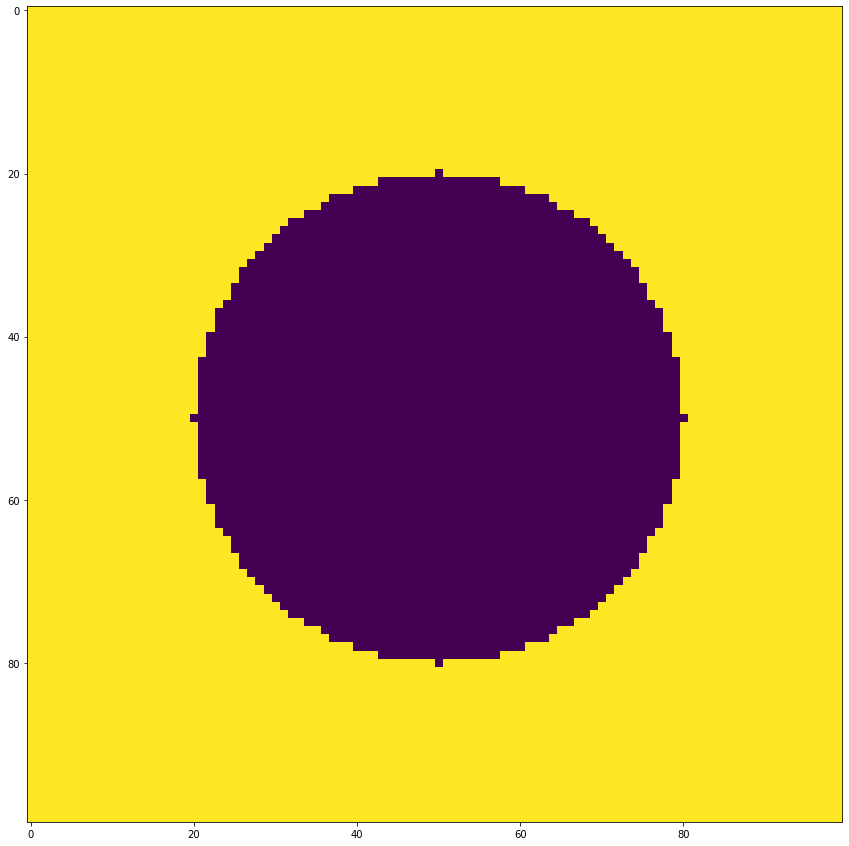

-40.0
-0.0
False
-39.671600552929846
-5.11508646738024
False
-38.69179452156118
-10.146183356380295
False
-37.07667029384087
-15.010680195174963
False
-34.852748164935576
-19.628702080157513
False
-32.05654487471827
-23.924421219648636
False
-28.733974003909104
-27.827302024139456
False
-24.939592074349342
-31.273259298721186
False
-20.735702732421007
-34.20571052021384
False
-16.191333724895756
-36.576504920632495
False
-11.381103465241306
-38.34671412146642
False
-6.383995801335171
-39.487271336578004
False
-1.2820631028662133
-39.979448648027514
False
3.840921036307262
-39.81516451796793
False
8.900837358252573
-38.99711648727295
False
13.8146021768523
-37.53873688199042
False
18.501531609633403
-35.46397225492
False
22.88466640488678
-32.806890183878245
False
26.89203561045266
-29.611119883012627
False
30.45783833476537
-25.92913581231155
False
33.523524195673616
-21.82139604842196
False
36.03875471609676
-17.35534956470233
False
37.96222988042675
-12.604328720944833
False
39.26236

In [66]:
import numpy as np
import matplotlib.pyplot as plt

theta1 = np.linspace(0, 2*np.pi, num=50)
r_sphere = 40
X_3D = - r_sphere* np.cos(theta1) 
Y_3D = - r_sphere* np.sin(theta1)* np.cos(0)
Z_3D = r_sphere* np.sin(theta1)* np.sin(0)

def spot_writer(x,z):
    global centre
    r=5
    return (x-centre[1]-X_3D[i])**2 + (z-centre[0]-Z_3D[i])**2 < r**2

def planet_writer(x,y):
    global centre
    r=30
    return (x-centre[0])**2 + (y-centre[1])**2 > r**2

def planet_mask(x,y):
    global centre
    r=30
    return (x-centre[0])**2 + (y-centre[1])**2 > r**2

Y_Less_Zero = Y_3D>0
centre = [50,50]


fig = plt.figure(figsize=(15,15))


planet_canvas = 1* np.fromfunction(planet_writer, (100, 100), dtype=int)
planet_mask_canvas =   1* np.fromfunction(planet_mask, (100, 100), dtype=int)

plt.imshow(planet_mask_canvas, interpolation='nearest')
plt.show()
for i in range(len(theta1)):
    print (X_3D[i])
    print (Y_3D[i])
    print (Y_Less_Zero[i])
    
    spot_canvas =   1* np.fromfunction(spot_writer, (100, 100), dtype=int)

I want the planet mask to be added only when Y value is less than zero.
Y_Less_Zero should be False when planet in front of star, True when planet is behind the star.

In [63]:
Y_Less_Zero[7] * planet_mask_canvas # want this to be all ones

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [64]:
Y_Less_Zero[40] * planet_mask_canvas # want this to be the same

array([[1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       ...,
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1]])

False


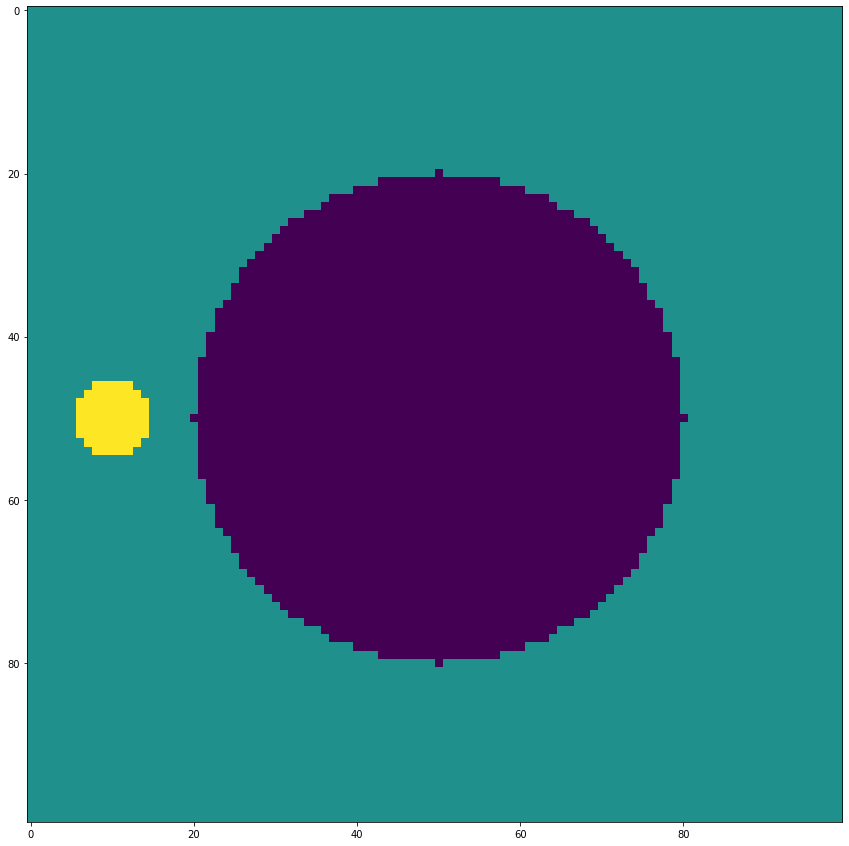

False


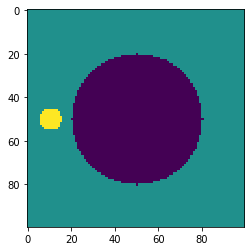

False


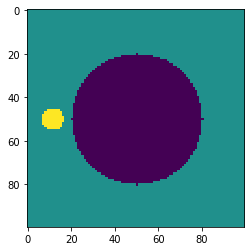

False


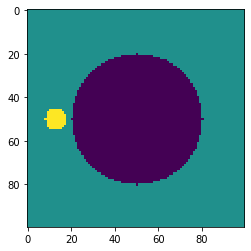

False


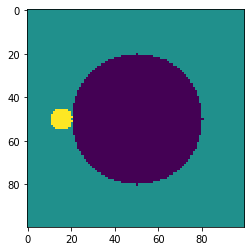

False


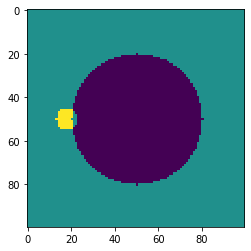

False


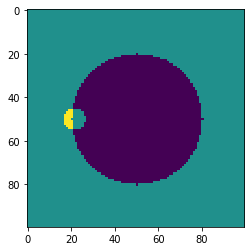

False


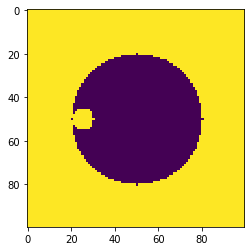

False


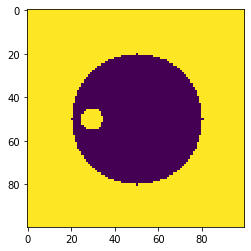

False


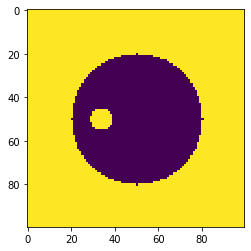

False


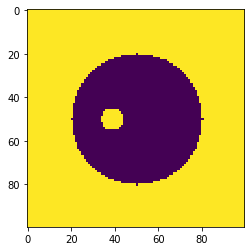

False


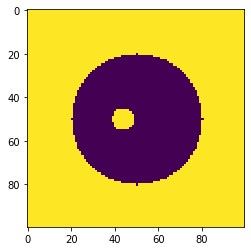

False


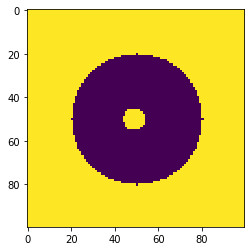

False


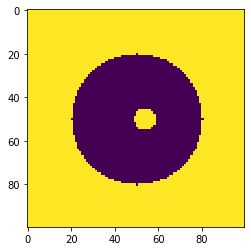

False


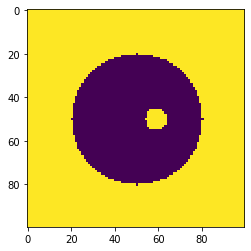

False


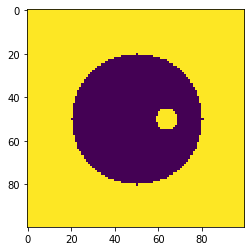

False


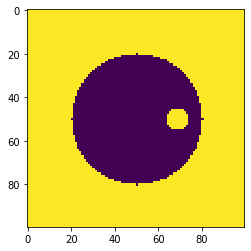

False


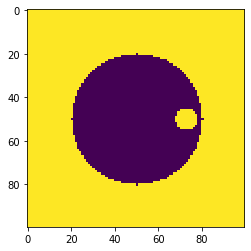

False


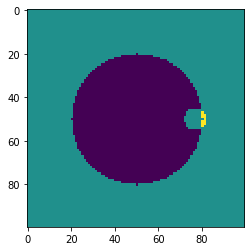

False


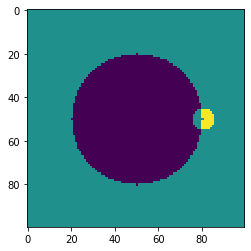

False


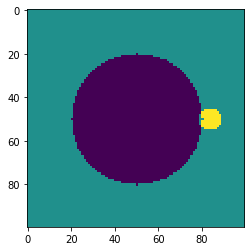

False


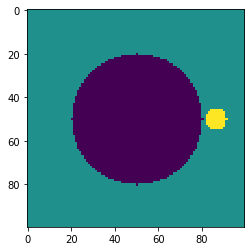

False


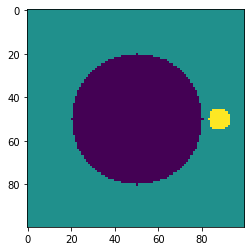

False


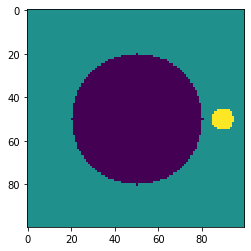

False


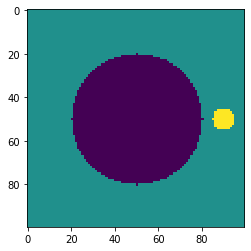

True


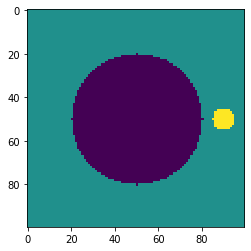

True


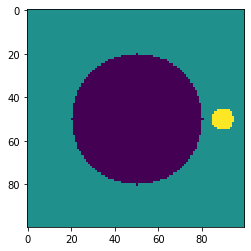

True


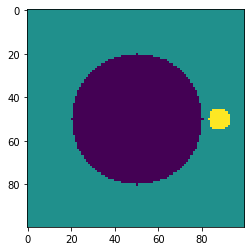

True


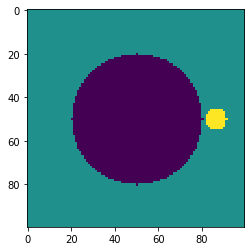

True


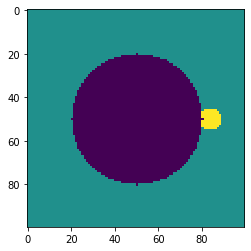

True


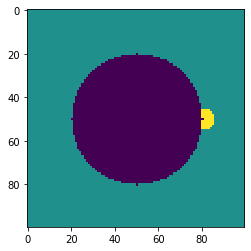

True


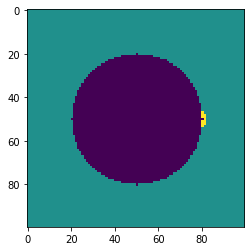

True


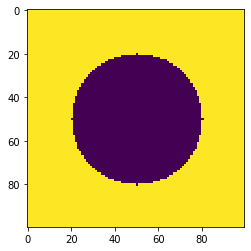

True


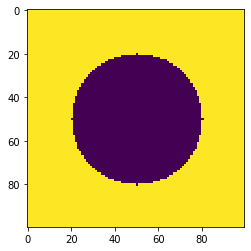

True


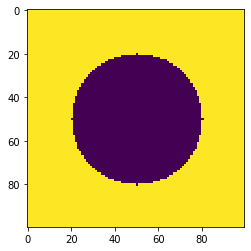

True


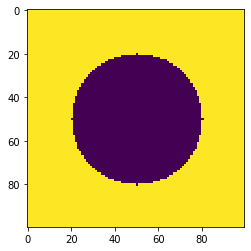

True


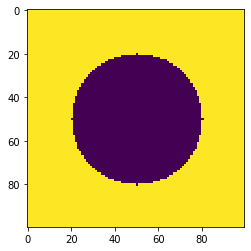

True


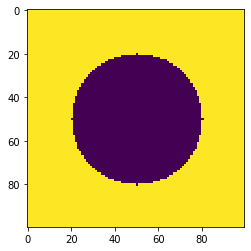

True


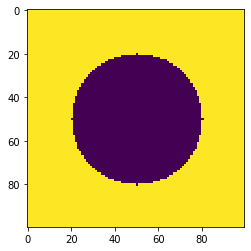

True


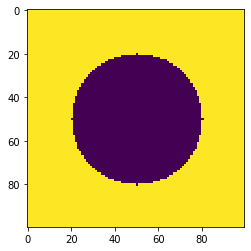

True


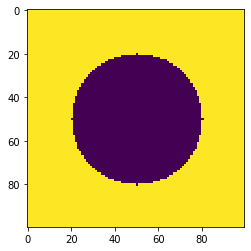

True


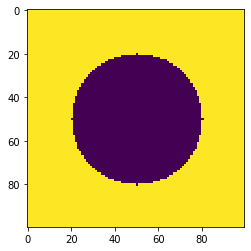

True


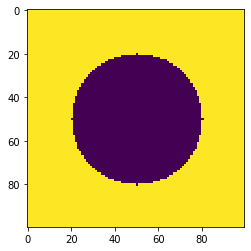

True


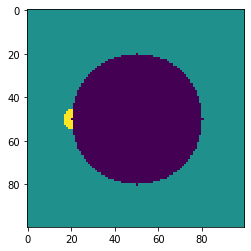

True


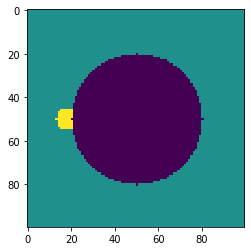

True


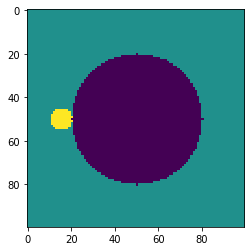

True


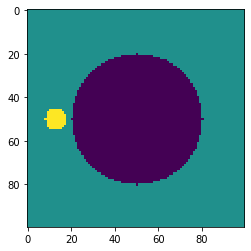

True


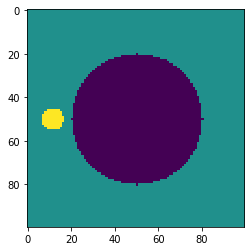

True


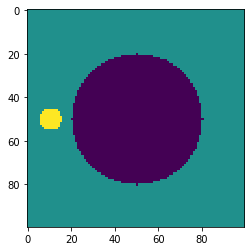

True


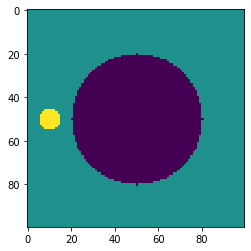

In [117]:
import numpy as np
import matplotlib.pyplot as plt

theta1 = np.linspace(0, 2*np.pi, num=50)
r_sphere = 40
X_3D = - r_sphere* np.cos(theta1) 
Y_3D = - r_sphere* np.sin(theta1)* np.cos(0)
Z_3D = r_sphere* np.sin(theta1)* np.sin(0)

def spot_writer(x,z):
    global centre
    r=5
    return (x-centre[1]-Z_3D[i])**2 + (z-centre[0]-X_3D[i])**2 < r**2

def planet_writer(x,y):
    global centre
    r=30
    return (x-centre[0])**2 + (y-centre[1])**2 > r**2

def planet_mask(x,y):
    global centre
    r=30
    return (x-centre[0])**2 + (y-centre[1])**2 > r**2

Y_Less_Zero = Y_3D>0
centre = [50,50]


fig = plt.figure(figsize=(15,15))


planet_canvas = 1* np.fromfunction(planet_writer, (100, 100), dtype=int)
planet_mask_canvas =   1* np.fromfunction(planet_mask, (100, 100), dtype=int)

for i in range(len(theta1)):
    print (Y_Less_Zero[i])
    
    if Y_Less_Zero[i] == True:
        addmask=planet_mask_canvas
    else:
        addmask = 1
        
    spot_canvas =   1* np.fromfunction(spot_writer, (100, 100), dtype=int)
    plt.imshow((planet_canvas + spot_canvas*addmask) , interpolation='nearest')
    plt.show()

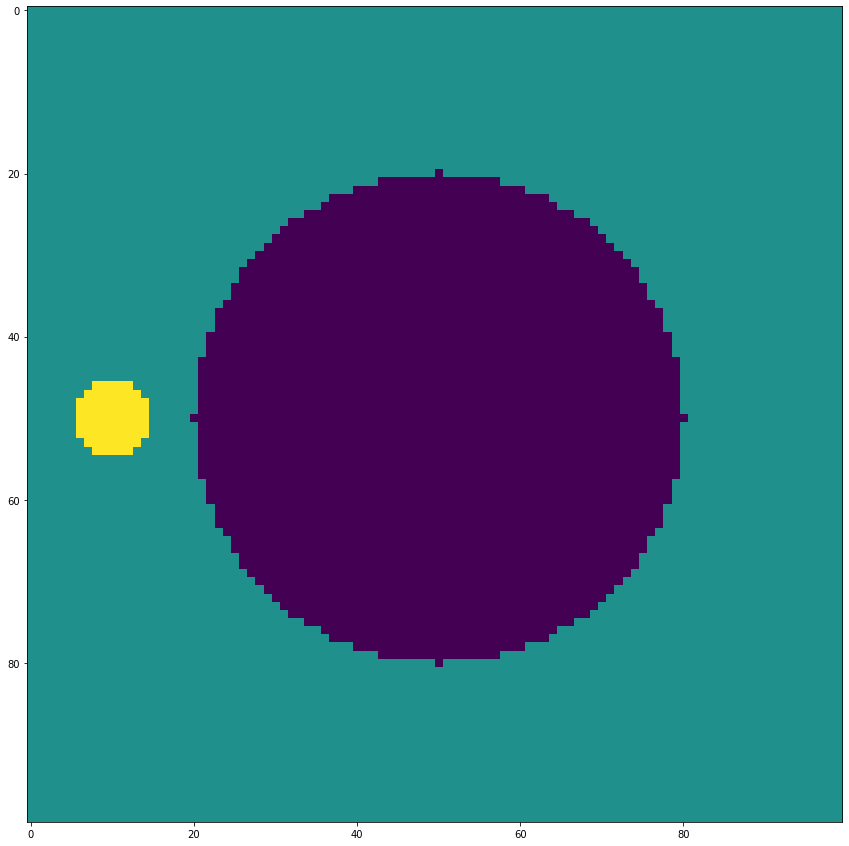

MovieWriter PillowWriter unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.


In [48]:
fig = plt.figure(figsize=(15,15))
camera = Camera(fig)
ax = plt.axes()

for i in range(len(theta1)):
    
    if Y_Less_Zero[i] == True:
        addmask=planet_mask_canvas
    else:
        addmask = 1
        
    spot_canvas =   1* np.fromfunction(spot_writer, (100, 100), dtype=int)
    ax.imshow((planet_canvas + spot_canvas*addmask) , interpolation='nearest')
    plt.pause(0.1)
    camera.snap()
    
animation = camera.animate()
animation.save('spinny.gif', writer='PillowWriter', fps=5)

This seems to give the right sort of motion I was looking for.
From looking at the animation, the planet seems to wobble a bit. I don't know if this is just due the fact the the sphere is quite small so may have values inbetween the grid values or that its something to do with the method used.

### Rotating planet

In theory, an object should look the same when rotating except for objects such as spots ect. which are unique to a certain area of the surface. Therefore, they can be seen to be orbiting a stationary planet (which we sort of know how to do already).

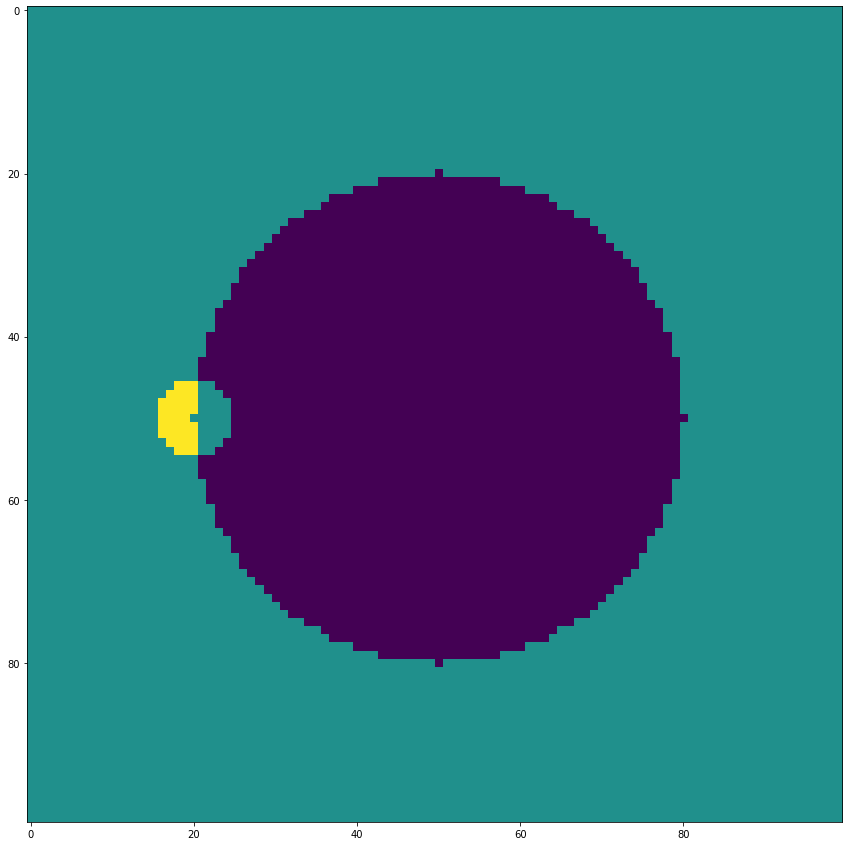

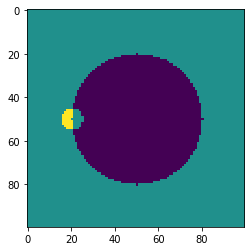

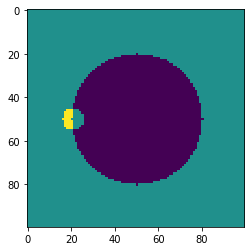

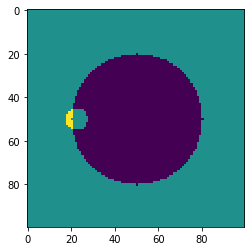

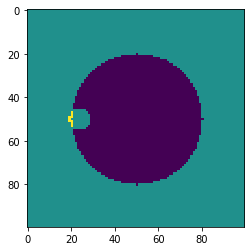

...

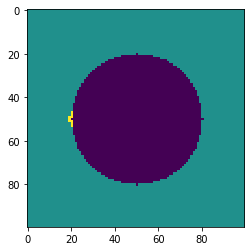

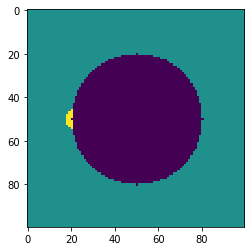

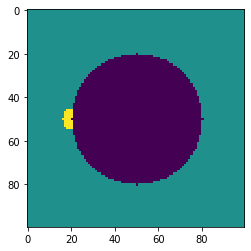

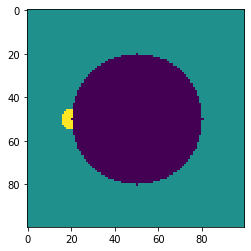

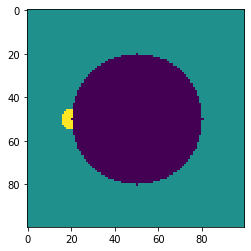

In [115]:
import numpy as np
import matplotlib.pyplot as plt

theta1 = np.linspace(0, 2*np.pi, num=50)
r_sphere = 30 # Setting the orbital radius to the radius of the planet 
X_3D = - r_sphere* np.cos(theta1) 
Y_3D = - r_sphere* np.sin(theta1)* np.cos(0)
Z_3D = r_sphere* np.sin(theta1)* np.sin(0)

def spot_writer(x,y):
    global centre
    r=5
    return (x-centre[1]-Z_3D[i])**2 + (y-centre[0]-X_3D[i])**2 < r**2

def planet_writer(x,y):
    global centre
    r=30
    return (x-centre[0])**2 + (y-centre[1])**2 > r**2

def planet_mask(x,y):
    global centre
    r=30
    return (x-centre[0])**2 + (y-centre[1])**2 > r**2

Y_Less_Zero = Y_3D>0
centre = [50,50]


fig = plt.figure(figsize=(15,15))


planet_canvas = 1* np.fromfunction(planet_writer, (100, 100), dtype=int)
planet_mask_canvas =   1* np.fromfunction(planet_mask, (100, 100), dtype=int)
for i in range(len(theta1)):

    
    if Y_Less_Zero[i] == True:
        addmask=planet_canvas
    else:
        addmask = 1
        
    spot_canvas =   1* np.fromfunction(spot_writer, (100, 100), dtype=int)
    plt.imshow((planet_canvas + spot_canvas*addmask), interpolation='nearest')
    plt.show()

For most of the frames, the picture is correct. However, at the edges, the planet sticks out over the edge.

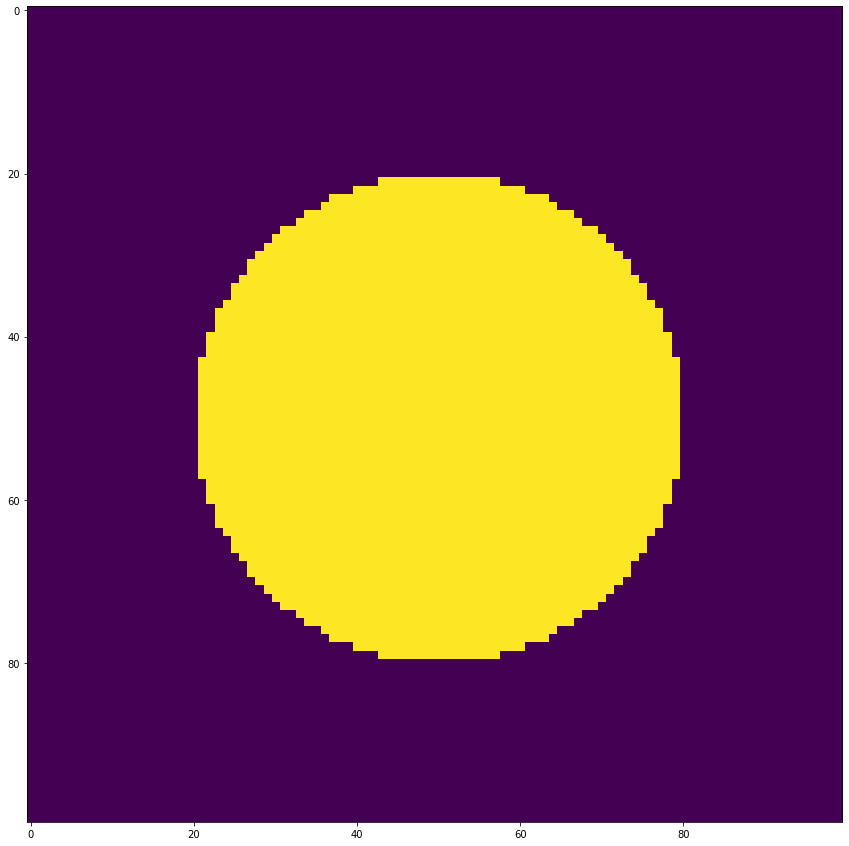

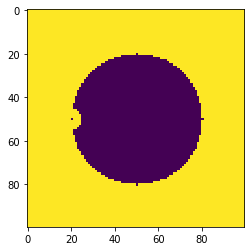

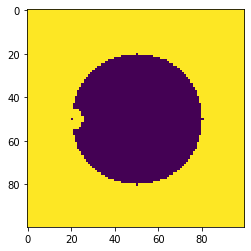

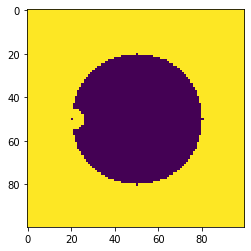

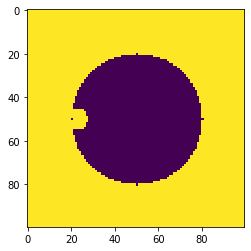

...

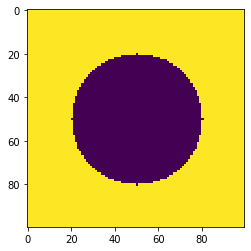

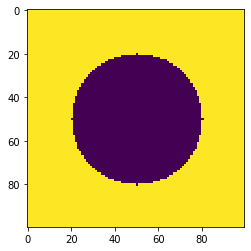

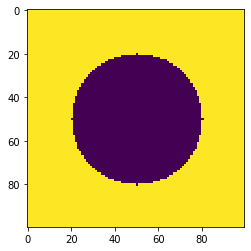

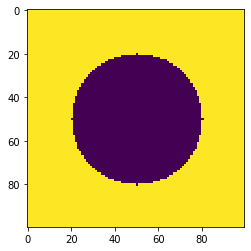

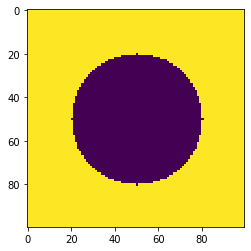

In [57]:
import numpy as np
import matplotlib.pyplot as plt

theta1 = np.linspace(0, 2*np.pi, num=50)
r_sphere = 30 # Setting the orbital radius to the radius of the planet 
X_3D = - r_sphere* np.cos(theta1) 
Y_3D = - r_sphere* np.sin(theta1)* np.cos(0)
Z_3D = r_sphere* np.sin(theta1)* np.sin(0)

def spot_writer(x,y):
    global centre
    r=5
    
    return (x-centre[1]-Z_3D[i])**2 + (y-centre[0]-X_3D[i])**2 < r**2

def planet_writer(x,y):
    global centre
    r=30
    return (x-centre[0])**2 + (y-centre[1])**2 > r**2

def planet_mask(x,y):
    global centre
    r=30
    return (x-centre[0])**2 + (y-centre[1])**2 < r**2

Y_Less_Zero = Y_3D>0
centre = [50,50]


fig = plt.figure(figsize=(15,15))


planet_canvas = 1* np.fromfunction(planet_writer, (100, 100), dtype=int)
planet_mask_canvas =   1* np.fromfunction(planet_mask, (100, 100), dtype=int)

plt.imshow(planet_mask_canvas, interpolation='nearest')
plt.show()

for i in range(len(theta1)):

    if Y_Less_Zero[i] == True:
        addmask=planet_canvas
    else:
        addmask = 1
        
    spot_canvas =   1* np.fromfunction(spot_writer, (100, 100), dtype=int)
    plt.imshow((planet_canvas + spot_canvas*addmask*planet_mask_canvas), interpolation='nearest')
    plt.show()

Adding another mask to only display bits of the spot only on the star seems to get rid of the edges. However, the spot disappears when the middle of the spot is at Y = 0 rather than when the edge is. As this will also be the case on the opposite side of the planet with the opposite size of the spot, I don't think there is an easy solution to this. There are two possible approximations to solve this issue:

Leave it as it is - assume that the rotation of the star is low enough that only a portion of full rotation will be seen during transit

Increase the radius of the 'orbit' to the radius of the planet plus the radius - this will allow the spot to fully leave the star and so long as the radius of the spot is small, should be a good approximation for what the surface looks like


I think the second approximation is good enough for now

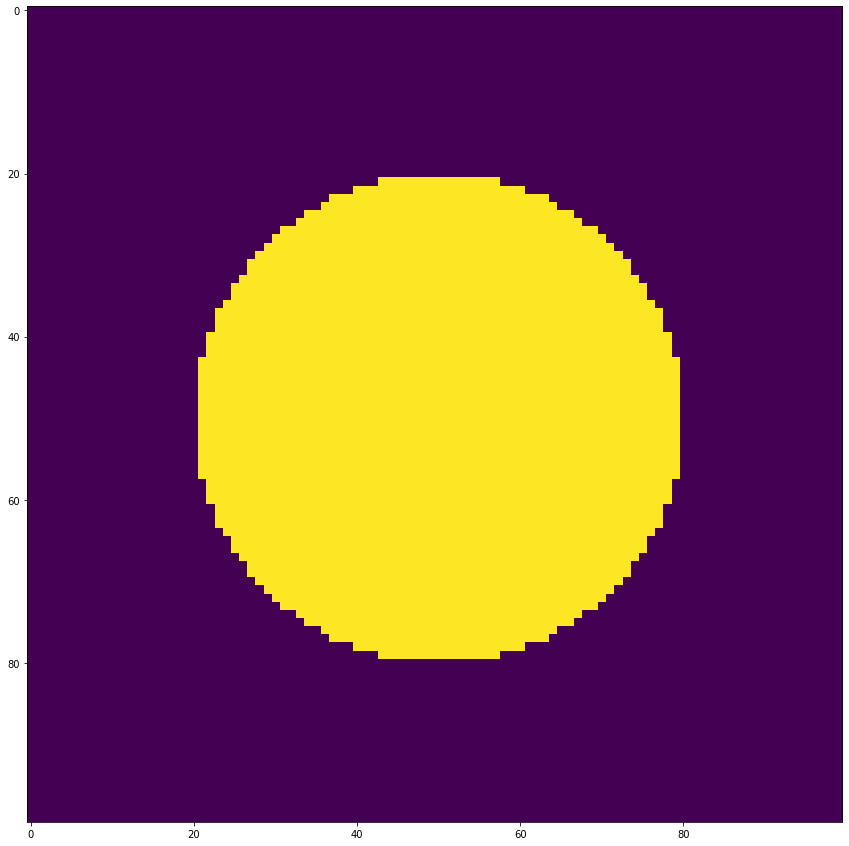

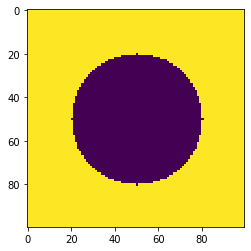

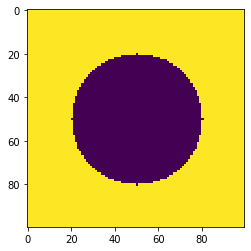

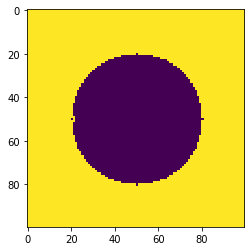

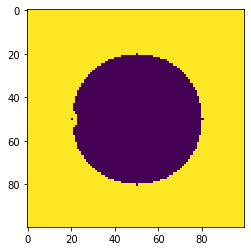

...

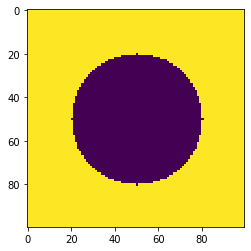

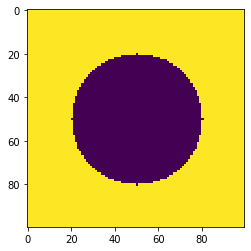

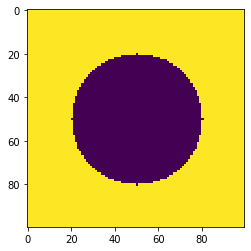

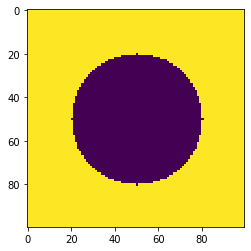

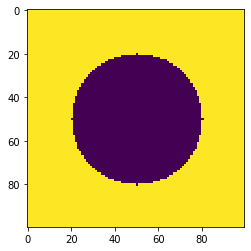

In [61]:
import numpy as np
import matplotlib.pyplot as plt

theta1 = np.linspace(0, 2*np.pi, num=50)
r_sphere = 35 # Setting the orbital radius to the radius of the planet 
X_3D = - r_sphere* np.cos(theta1) 
Y_3D = - r_sphere* np.sin(theta1)* np.cos(0)
Z_3D = r_sphere* np.sin(theta1)* np.sin(0)

def spot_writer(x,y):
    global centre
    r=5
    return (x-centre[1]-Z_3D[i])**2 + (y-centre[0]-X_3D[i])**2 < r**2

def planet_writer(x,y):
    global centre
    r=30
    return (x-centre[0])**2 + (y-centre[1])**2 > r**2

def planet_mask(x,y):
    global centre
    r=30
    return (x-centre[0])**2 + (y-centre[1])**2 < r**2

Y_Less_Zero = Y_3D>0
centre = [50,50]



planet_canvas = 1* np.fromfunction(planet_writer, (100, 100), dtype=int)

planet_mask_canvas =   1* np.fromfunction(planet_mask, (100, 100), dtype=int)

fig = plt.figure(figsize=(15,15))
for i in range(len(theta1)):

    if Y_Less_Zero[i] == True:
        addmask=planet_canvas
    else:
        addmask = 1
        
    spot_canvas =   1* np.fromfunction(spot_writer, (100, 100), dtype=int)
    plt.imshow((planet_canvas + spot_canvas*addmask*planet_mask_canvas), interpolation='nearest')
    plt.show()

## Version 1.6.1
The fromfunction takes the x value to be my y value so I swapped the variables around to make it easier to read. 

In [71]:
def coord(x,y):
    print ((x))

    return x+y

print(np.fromfunction(coord, (10, 10), dtype=int))

[[0 0 0 0 0 0 0 0 0 0]
 [1 1 1 1 1 1 1 1 1 1]
 [2 2 2 2 2 2 2 2 2 2]
 [3 3 3 3 3 3 3 3 3 3]
 [4 4 4 4 4 4 4 4 4 4]
 [5 5 5 5 5 5 5 5 5 5]
 [6 6 6 6 6 6 6 6 6 6]
 [7 7 7 7 7 7 7 7 7 7]
 [8 8 8 8 8 8 8 8 8 8]
 [9 9 9 9 9 9 9 9 9 9]]
[[ 0  1  2  3  4  5  6  7  8  9]
 [ 1  2  3  4  5  6  7  8  9 10]
 [ 2  3  4  5  6  7  8  9 10 11]
 [ 3  4  5  6  7  8  9 10 11 12]
 [ 4  5  6  7  8  9 10 11 12 13]
 [ 5  6  7  8  9 10 11 12 13 14]
 [ 6  7  8  9 10 11 12 13 14 15]
 [ 7  8  9 10 11 12 13 14 15 16]
 [ 8  9 10 11 12 13 14 15 16 17]
 [ 9 10 11 12 13 14 15 16 17 18]]


First parameter is now z, second is x (since the program is acting in the x,z plane).

CPU times: user 164 ms, sys: 9.45 ms, total: 174 ms
Wall time: 176 ms


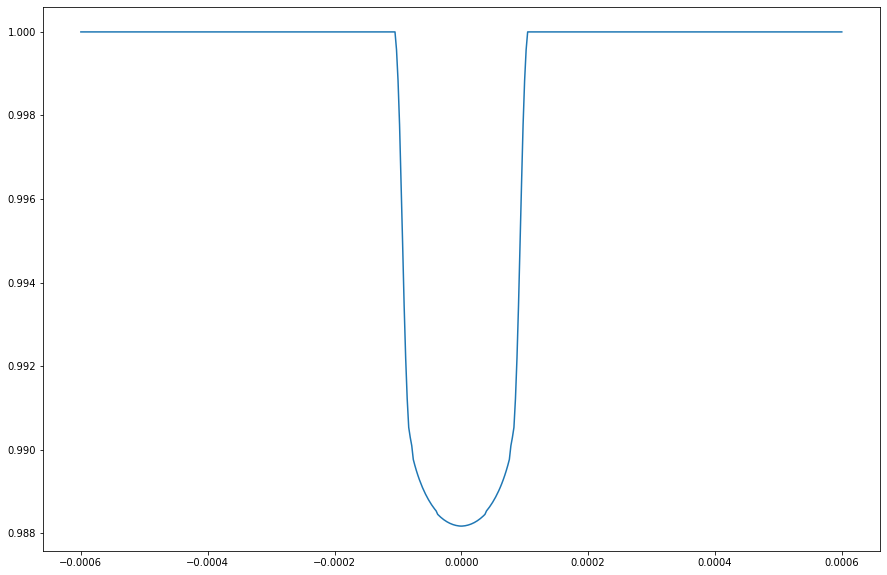

In [73]:
%%time
# Times how long it takes for the program to run

import numpy as np
import matplotlib.pyplot as plt

def intensity (z,x): # Draws the star with limb darkening  
    global r_star,centre_of_star
    r_squared= (z-centre_of_star)**2 + (x - centre_of_star)**2
    circle_mask = (z-centre_of_star)**2 + (x - centre_of_star)**2 <= r_star**2
    
    mu = np.sqrt(1 - r_squared/r_star**2,where=((z-centre_of_star)**2 + (x-centre_of_star)**2 <= r_star**2))
    
    return Intensity_max*(1-mu1*(1-mu)-mu2*(1 - mu)**2)*circle_mask

def planet_writer(z,x): # Draws the planet at the given centre  
    global centre_of_planet,r_planet
    return (z-centre_of_planet[1])**2 + (x-centre_of_planet[0])**2 > (r_planet)**2


def draw_stage(i,background): # Adds together the planet and star onto the same canvas
    global centre_of_planet, display_dim
    centre_of_planet = [X_coord_on_grid[i],Z_coord_on_grid[i]]
    
    display_added_planet = 1 * np.fromfunction(planet_writer, (display_dim, display_dim), dtype=int)
   
    return display_added_planet * background

###################################### Defining variables and constants

### Physical dimensions
radius_of_sun = 7e5 # Planet radius
radius_of_jupiter = 7e4 # Star radius

#### Stuff for orbit
a= 7.8e9 # Semi Major axis
e = 0.0489 # Eccentricity < 1 to work
theta = np.linspace(-0.6 *10e-4, 0.6*10e-4, num=500) # Angular range where the planet crosses the star
phase = 0 
f = theta - phase 
r = a*(1 - e**2)/ (1 + e*np.cos(f)) # Distance between the star and the planet
i = 0
omega = np.pi/2
w = omega + phase

#### Stuff for Limb Darkening
mu1 = 0.3 # Variables for limb darkening 
mu2 = 0.1 # Variables for limb darkening 
Intensity_max = 100 # Max Intensity for limb darkening

### Stuff for Display
display_dim = 100 # Size of the 'display'

### Stuff for Flux graph
flux = []
###################################### Equations of motion
X_3D = - r* np.cos(w +f) 
Y_3D = - r* np.sin(w +f)* np.cos(i)
Z_3D = r* np.sin(w +f)* np.sin(i)

###################################### Set up of display
display = np.zeros((display_dim, display_dim))
centre_of_display = display_dim/2

###################################### Planet
SF = (radius_of_sun + 2*radius_of_jupiter) # Scaling display to fit star/planet

X_coord_on_grid = np.round(X_3D/SF * centre_of_display + centre_of_display) # Scaling X with respect to display
Z_coord_on_grid = np.round(Z_3D/SF * centre_of_display + centre_of_display) # Scaling Z with respect to display

r_planet = radius_of_jupiter/SF *  display_dim/2 # Scaling planet radius with respect to display
###################################### Star 
centre_of_star = centre_of_display # Centre of star
r_star = radius_of_sun/SF * display_dim/2 # Scaling star centre with respect to display

display_with_star = np.fromfunction(intensity,(display_dim, display_dim), dtype=int) # Drawing Star
###################################### Putting everything together

for i in range(0,500):
    display = np.sum(draw_stage(i,display_with_star)) # Drawing the star/planet at each planet centre
    flux.append(display)

fig = plt.figure(figsize=(15,10))
plt.xlabel('Angle (Radians)')
plt.ylabel('Relative Flux')
plt.plot(theta[0:500],flux/flux[0])

## Adding moon to transit

Now I'm going to to to combine the satellite's orbit to the rest of the program.

In [81]:
%%time
# Times how long it takes for the program to run

import numpy as np
import matplotlib.pyplot as plt

def intensity (z,x): # Draws the star with limb darkening  
    global r_star,centre_of_star
    r_squared= (z-centre_of_star)**2 + (x - centre_of_star)**2
    circle_mask = (z-centre_of_star)**2 + (x - centre_of_star)**2 <= r_star**2
    
    mu = np.sqrt(1 - r_squared/r_star**2,where=((z-centre_of_star)**2 + (x-centre_of_star)**2 <= r_star**2))
    
    return Intensity_max*(1-mu1*(1-mu)-mu2*(1 - mu)**2)*circle_mask

def planet_writer(z,x): # Draws the planet at the given centre  
    global centre_of_planet,r_planet
    return (z-centre_of_planet[1])**2 + (x-centre_of_planet[0])**2 > (r_planet)**2


def draw_stage(i,background): # Adds together the planet and star onto the same canvas
    global centre_of_planet, display_dim
    centre_of_planet = [X_coord_on_grid[i],Z_coord_on_grid[i]]
    
    display_added_planet = 1 * np.fromfunction(planet_writer, (display_dim, display_dim), dtype=int)
   
    return display_added_planet * background

###################################### Defining variables and constants

### Physical dimensions
radius_of_sun = 7e5 # Planet radius
radius_of_jupiter = 7e4 # Star radius

#### Stuff for orbit
a= 7.8e9 # Semi Major axis
e = 0.0489 # Eccentricity < 1 to work
theta = np.linspace(-0.6 *10e-4, 0.6*10e-4, num=500) # Angular range where the planet crosses the star
phase = 0 
f = theta - phase 
r = a*(1 - e**2)/ (1 + e*np.cos(f)) # Distance between the star and the planet
i = 0
omega = np.pi/2
w = omega + phase

#### Stuff for Limb Darkening
mu1 = 0.3 # Variables for limb darkening 
mu2 = 0.1 # Variables for limb darkening 
Intensity_max = 100 # Max Intensity for limb darkening

### Stuff for Display
display_dim = 100 # Size of the 'display'

### Stuff for Flux graph
flux = []
###################################### Equations of motion
X_3D = - r* np.cos(w +f) 
Y_3D = - r* np.sin(w +f)* np.cos(i)
Z_3D = r* np.sin(w +f)* np.sin(i)

###################################### Set up of display
display = np.zeros((display_dim, display_dim))
centre_of_display = display_dim/2

###################################### Planet
SF = (radius_of_sun + 2*radius_of_jupiter) # Scaling display to fit star/planet

X_coord_on_grid = np.round(X_3D/SF * centre_of_display + centre_of_display) # Scaling X with respect to display
Z_coord_on_grid = np.round(Z_3D/SF * centre_of_display + centre_of_display) # Scaling Z with respect to display

r_planet = radius_of_jupiter/SF *  display_dim/2 # Scaling planet radius with respect to display
###################################### Star 
centre_of_star = centre_of_display # Centre of star
r_star = radius_of_sun/SF * display_dim/2 # Scaling star centre with respect to display

display_with_star = np.fromfunction(intensity,(display_dim, display_dim), dtype=int) # Drawing Star
###################################### Moon Stuff
theta_moon = np.linspace(0, 2*np.pi, num=500)

r_moon_orbit = 
X_3D_Moon = - r_moon_orbit* np.cos(theta_moon) 
Y_3D_Moon = - r_moon_orbit* np.sin(theta_moon)* np.cos(0)
Z_3D_Moon = r_moon_orbit* np.sin(theta_moon)* np.sin(0)

def moon_writer(z,x):
    global centre_of_moon,centre_of_planet
    r=5
    return (z-centre_of_planet[1]-centre_of_moon[1])**2 + (x-centre_of_planet[0]-centre_of_moon[0])**2 > r**2

Y_Less_Zero = Y_3D>0


centre_of_moon = [X_3D_Moon[i],Z_3D_Moon[i]]

def planet_mask(x,y):
    global centre
    r=30
    return (x-centre[0])**2 + (y-centre[1])**2 < r**2

planet_mask_canvas =1* np.fromfunction(planet_mask, (100, 100), dtype=int)

for i in range(0,500):
    
    if Y_Less_Zero[i] == True:
        addmask=planet_canvas
    else:
        addmask = 1
        
    spot_canvas =   1* np.fromfunction(moon_writer, (100, 100), dtype=int)
    display = np.sum(draw_stage(i,display_with_star)+ spot_canvas) # Drawing the star/planet at each planet centre
    flux.append(display)

fig = plt.figure(figsize=(15,10))
plt.plot(theta[0:500],flux/flux[0])


###########################################################################################


SyntaxError: invalid syntax (<unknown>, line 79)

Unfortunately, I didn't have enough time to finish this. See below for [Completed code](#moon).

<a id="5"></a>
# 22/2/21 - Reading data and adding a moon
***
### Jump to date:
* [1/2/21 - Orbital Motion](#1)
* [8/2/21 - Limb darkening, Drawing the planet transiting in front of the star, Animation](#2)
* [Between Weeks - Optimisation and Bug fixing](#3)
* [15/2/21 - Spinning and Rotation](#4)
* [22/2/21 - Reading data and adding a moon](#5)
* [1/3/21 - Planet-Moon transit](#6)
* [8/3/21 - Improved limb darkening](#7)
* [15/3/21 - Planetry atmosphere](#8)

## Reading data

At the start of the session, we were given some real data to plot so that we can compare it to the model.

I'm going to use pandas as it is a library I'm somewhat familiar with.

I didn't know how to read space separated files but found I could use "delim_whitespace=True" by looking at https://stackoverflow.com/questions/19632075/how-to-read-file-with-space-separated-values-in-pandas
User: HYRY

In [285]:
import pandas as pd
data = pd.read_csv('Lab_data.txt',delim_whitespace=True)

In [286]:
data

,Center_Wavelength,Heliocentric_Julian_Date,Relative_flux,Uncertainty_in_RFlux
0,320.1,2.452763e+06,1.000531,0.000609
1,320.1,2.452763e+06,1.000054,0.000609
2,320.1,2.452763e+06,1.000691,0.000609
3,320.1,2.452763e+06,1.000254,0.000609
4,320.1,2.452763e+06,1.000361,0.000609
...,...,...,...,...
5255,970.8,2.452827e+06,1.000026,0.000418
5256,970.8,2.452827e+06,0.999634,0.000418
5257,970.8,2.452827e+06,1.000220,0.000418
5258,970.8,2.452827e+06,0.999865,0.000418


Plotting the data:

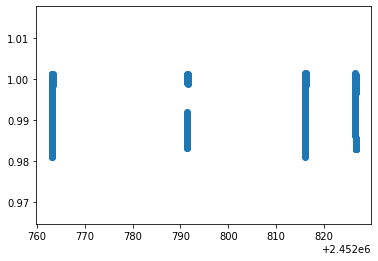

In [287]:
import matplotlib.pyplot as plt
time= data['Heliocentric_Julian_Date']
Rf= data['Relative_flux']
plt.scatter(time,Rf)

There seems to be 4 different transits at differnt times, these need to be separated to see the light graphs clearly.

I thought it might be interesting to see the date format in a more usable form so I converted it to ISO time usung https://docs.astropy.org/en/stable/time/

In [288]:
from astropy.time import Time

In [289]:
t = Time(time, format='jd', scale='utc')

In [290]:
t.format = 'isot'

In [291]:
data['iso_time'] = t

In [292]:
data

,Center_Wavelength,Heliocentric_Julian_Date,Relative_flux,Uncertainty_in_RFlux,iso_time
0,320.1,2.452763e+06,1.000531,0.000609,2003-05-03T13:20:07.296
1,320.1,2.452763e+06,1.000054,0.000609,2003-05-03T13:20:49.286
2,320.1,2.452763e+06,1.000691,0.000609,2003-05-03T13:21:31.277
3,320.1,2.452763e+06,1.000254,0.000609,2003-05-03T13:22:13.267
4,320.1,2.452763e+06,1.000361,0.000609,2003-05-03T13:22:55.344
...,...,...,...,...,...
5255,970.8,2.452827e+06,1.000026,0.000418,2003-07-06T05:11:39.379
5256,970.8,2.452827e+06,0.999634,0.000418,2003-07-06T05:12:18.346
5257,970.8,2.452827e+06,1.000220,0.000418,2003-07-06T05:12:57.398
5258,970.8,2.452827e+06,0.999865,0.000418,2003-07-06T05:13:36.365


To separate the transits, I rounded the time to only the day. I used https://datatofish.com/round-values-pandas-dataframe/ to find how to round.

In [293]:
data['epochs'] = data['Heliocentric_Julian_Date'].round(0)
print (data)

      Center_Wavelength  Heliocentric_Julian_Date  Relative_flux  \
0                 320.1              2.452763e+06       1.000531   
1                 320.1              2.452763e+06       1.000054   
2                 320.1              2.452763e+06       1.000691   
3                 320.1              2.452763e+06       1.000254   
4                 320.1              2.452763e+06       1.000361   
...                 ...                       ...            ...   
5255              970.8              2.452827e+06       1.000026   
5256              970.8              2.452827e+06       0.999634   
5257              970.8              2.452827e+06       1.000220   
5258              970.8              2.452827e+06       0.999865   
5259              970.8              2.452827e+06       1.000096   

      Uncertainty_in_RFlux                 iso_time     epochs  
0                 0.000609  2003-05-03T13:20:07.296  2452763.0  
1                 0.000609  2003-05-03T13:20:49.286  

Now I need to find the the unique days where the transits take place. Found how to find unique values using https://chrisalbon.com/python/data_wrangling/pandas_list_unique_values_in_column/

In [294]:
uniques = data.epochs.unique()

I was only expecting 4 days but there are five values in the list

In [295]:
uniques

array([2452763., 2452791., 2452816., 2452826., 2452827.])

Now I can separate each transit into individual tables so that they are easier to plot. https://www.geeksforgeeks.org/selecting-rows-in-pandas-dataframe-based-on-conditions/

In [296]:
first_transit  = data[data['epochs']  == uniques[0]]
second_transit = data[data['epochs']  == uniques[1]]
third_transit = data[data['epochs']  == uniques[2]]
fourth_transit = data[data['epochs']  == uniques[3]]
fifth_transit = data[data['epochs']  == uniques[4]]

In [297]:
first_transit

,Center_Wavelength,Heliocentric_Julian_Date,Relative_flux,Uncertainty_in_RFlux,iso_time,epochs
0,320.1,2.452763e+06,1.000531,0.000609,2003-05-03T13:20:07.296,2452763.0
1,320.1,2.452763e+06,1.000054,0.000609,2003-05-03T13:20:49.286,2452763.0
2,320.1,2.452763e+06,1.000691,0.000609,2003-05-03T13:21:31.277,2452763.0
3,320.1,2.452763e+06,1.000254,0.000609,2003-05-03T13:22:13.267,2452763.0
4,320.1,2.452763e+06,1.000361,0.000609,2003-05-03T13:22:55.344,2452763.0
...,...,...,...,...,...,...
1255,539.8,2.452763e+06,0.999850,0.000199,2003-05-03T18:48:27.792,2452763.0
1256,539.8,2.452763e+06,0.999975,0.000199,2003-05-03T18:49:09.782,2452763.0
1257,539.8,2.452763e+06,1.000148,0.000199,2003-05-03T18:49:51.773,2452763.0
1258,539.8,2.452763e+06,0.999983,0.000199,2003-05-03T18:50:33.763,2452763.0


Plotting each transit separately with error bars (using https://www.geeksforgeeks.org/errorbar-graph-in-python-using-matplotlib/ to find error bars) 

<ErrorbarContainer object of 3 artists>

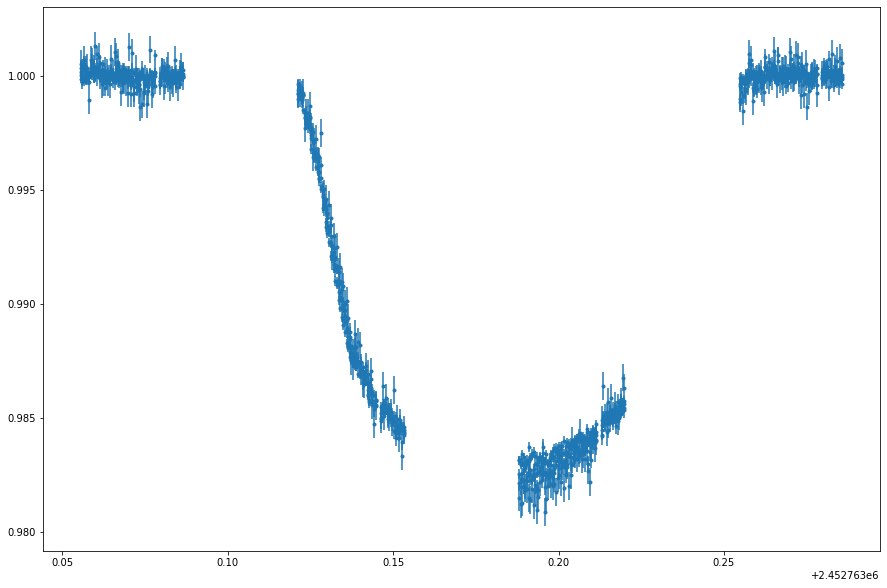

In [298]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(15,10))
time= first_transit['Heliocentric_Julian_Date']
Rf= first_transit['Relative_flux']
y_error = first_transit['Uncertainty_in_RFlux']
plt.errorbar(time,Rf, 
             yerr = y_error, 
             fmt ='.') 

<ErrorbarContainer object of 3 artists>

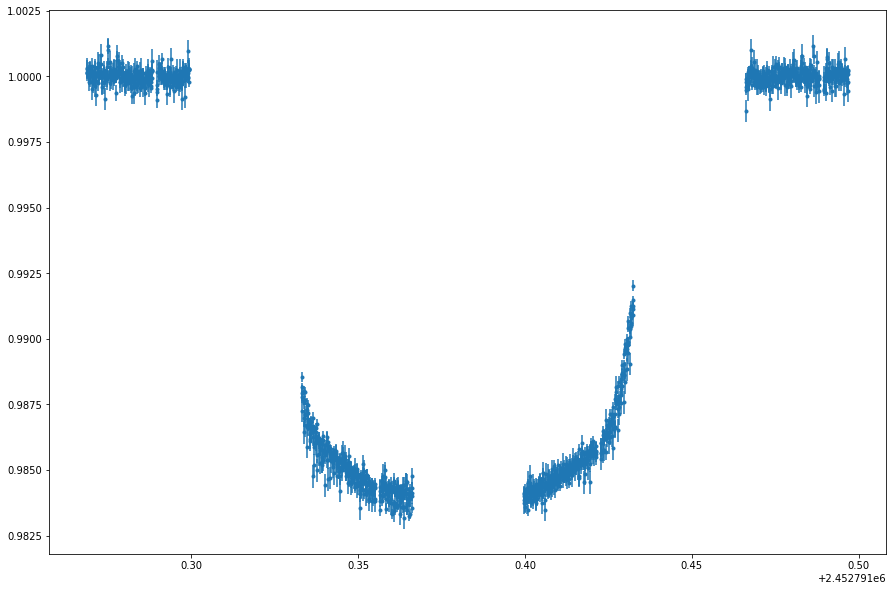

In [100]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(15,10))
time= second_transit['Heliocentric_Julian_Date']
Rf= second_transit['Relative_flux']
y_error = second_transit['Uncertainty_in_RFlux']
plt.errorbar(time,Rf, 
             yerr = y_error, 
             fmt ='.') 

<ErrorbarContainer object of 3 artists>

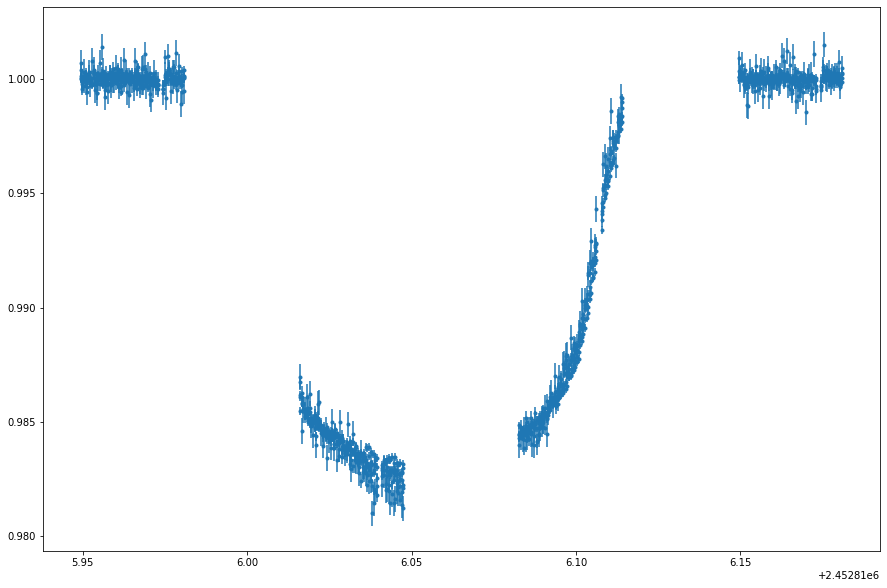

In [101]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(15,10))
time= third_transit['Heliocentric_Julian_Date']
Rf= third_transit['Relative_flux']
y_error = third_transit['Uncertainty_in_RFlux']
plt.errorbar(time,Rf, 
             yerr = y_error, 
             fmt ='.') 

## This one is probably due to the dot above the second line in the plot with four lines

<ErrorbarContainer object of 3 artists>

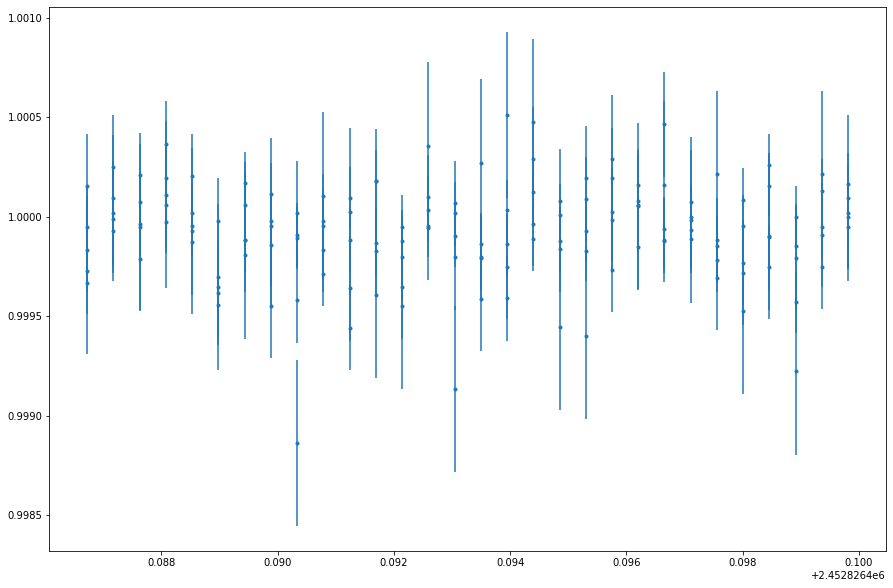

In [102]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(15,10))
time= fourth_transit['Heliocentric_Julian_Date']
Rf= fourth_transit['Relative_flux']
y_error = fourth_transit['Uncertainty_in_RFlux']
plt.errorbar(time,Rf, 
             yerr = y_error, 
             fmt ='.') 

<ErrorbarContainer object of 3 artists>

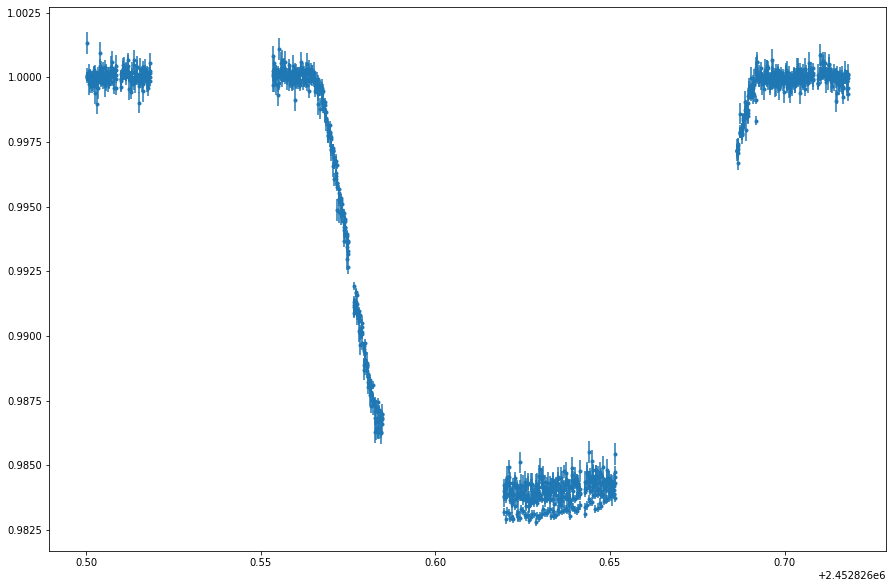

In [103]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(15,10))
time= fifth_transit['Heliocentric_Julian_Date']
Rf= fifth_transit['Relative_flux']
y_error = fifth_transit['Uncertainty_in_RFlux']
plt.errorbar(time,Rf, 
             yerr = y_error, 
             fmt ='.') 

<a id="moon"></a>
## Going back to trying to add moons 

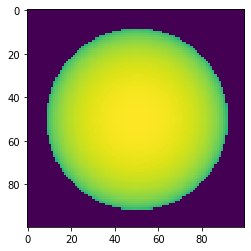

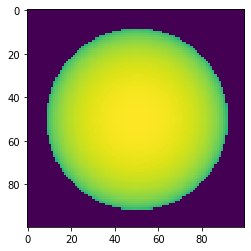

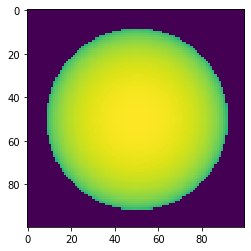

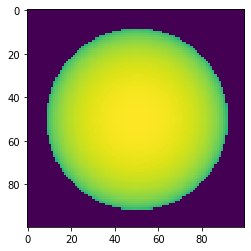

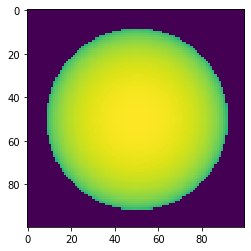

...

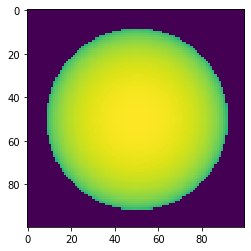

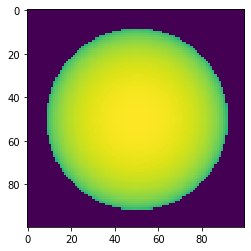

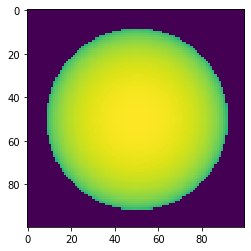

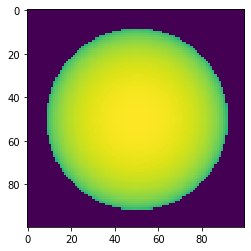

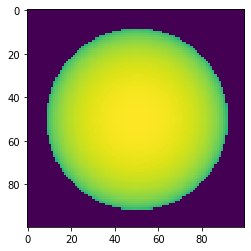

CPU times: user 2min 2s, sys: 3.18 s, total: 2min 5s
Wall time: 2min 10s


In [126]:
%%time
# Times how long it takes for the program to run

import numpy as np
import matplotlib.pyplot as plt

def intensity (z,x): # Draws the star with limb darkening  
    global r_star,centre_of_star
    r_squared= (z-centre_of_star)**2 + (x - centre_of_star)**2
    circle_mask = (z-centre_of_star)**2 + (x - centre_of_star)**2 <= r_star**2
    
    mu = np.sqrt(1 - r_squared/r_star**2,where=((z-centre_of_star)**2 + (x-centre_of_star)**2 <= r_star**2))
    
    return Intensity_max*(1-mu1*(1-mu)-mu2*(1 - mu)**2)*circle_mask

def planet_writer(z,x): # Draws the planet at the given centre  
    global centre_of_planet,r_planet
    return (z-centre_of_planet[1])**2 + (x-centre_of_planet[0])**2 > (r_planet)**2


def draw_stage(i,background): # Adds together the planet and star onto the same canvas
    global centre_of_planet, display_dim
    centre_of_planet = [X_coord_on_grid[i],Z_coord_on_grid[i]]
    
    display_added_planet = 1 * np.fromfunction(planet_writer, (display_dim, display_dim), dtype=int)
   
    return display_added_planet * background

###################################### Defining variables and constants

### Physical dimensions
radius_of_sun = 7e5 # Planet radius
radius_of_jupiter = 7e4 # Star radius

#### Stuff for orbit
a= 7.8e9 # Semi Major axis
e = 0.0489 # Eccentricity < 1 to work
theta = np.linspace(-0.6 *10e-4, 0.6*10e-4, num=500) # Angular range where the planet crosses the star
phase = 0 
f = theta - phase 
r = a*(1 - e**2)/ (1 + e*np.cos(f)) # Distance between the star and the planet
i = 0
omega = np.pi/2
w = omega + phase

#### Stuff for Limb Darkening
mu1 = 0.3 # Variables for limb darkening 
mu2 = 0.1 # Variables for limb darkening 
Intensity_max = 100 # Max Intensity for limb darkening

### Stuff for Display
display_dim = 100 # Size of the 'display'

### Stuff for Flux graph
flux = []
###################################### Equations of motion
X_3D = - r* np.cos(w +f) 
Y_3D = - r* np.sin(w +f)* np.cos(i)
Z_3D = r* np.sin(w +f)* np.sin(i)

###################################### Set up of display
display = np.zeros((display_dim, display_dim))
centre_of_display = display_dim/2

###################################### Planet
SF = (radius_of_sun + 2*radius_of_jupiter) # Scaling display to fit star/planet

X_coord_on_grid = np.round(X_3D/SF * centre_of_display + centre_of_display) # Scaling X with respect to display
Z_coord_on_grid = np.round(Z_3D/SF * centre_of_display + centre_of_display) # Scaling Z with respect to display

r_planet = radius_of_jupiter/SF *  display_dim/2 # Scaling planet radius with respect to display
###################################### Star 
centre_of_star = centre_of_display # Centre of star
r_star = radius_of_sun/SF * display_dim/2 # Scaling star centre with respect to display

display_with_star = np.fromfunction(intensity,(display_dim, display_dim), dtype=int) # Drawing Star

###################################### Moon Stuff
theta_moon = np.linspace(0, 12*np.pi, num=500)

r_moon_orbit = r_planet + 5
X_3D_Moon = - r_moon_orbit* np.cos(theta_moon) 
Y_3D_Moon = - r_moon_orbit* np.sin(theta_moon)* np.cos(0)
Z_3D_Moon = r_moon_orbit* np.sin(theta_moon)* np.sin(0)

def moon_writer(z,x):
    global centre_of_moon,centre_of_planet
    r=2
    return (z-centre_of_planet[1]-centre_of_moon[1])**2 + (x-centre_of_planet[0]-centre_of_moon[0])**2 > r**2

def planet_mask(x,y):
    global centre_of_planet,r_planet

    return (x-centre_of_planet[0])**2 + (y-centre_of_planet[1])**2 > r_planet**2

def draw_stage(i,background): # Adds together the planet and star onto the same canvas
    global centre_of_planet, display_dim
    centre_of_planet = [X_coord_on_grid[i],Z_coord_on_grid[i]]
    
    display_added_planet = 1 * np.fromfunction(planet_writer, (display_dim, display_dim), dtype=int)
   
    return display_added_planet * background


Y_Less_Zero = Y_3D>0





for i in range(0,500):
    
    star_planet = draw_stage(i,display_with_star)# Drawing the star/planet at each planet centre
    centre_of_moon = [X_3D_Moon[i],Z_3D_Moon[i]]
    planet_mask_canvas =1* np.fromfunction(planet_mask, (100, 100), dtype=int)
    
    if Y_Less_Zero[i] == True:
        addmask=planet_mask_canvas
    else:
        addmask = 1
        
    spot_canvas =   1* np.fromfunction(moon_writer, (100, 100), dtype=int)
    
    display = star_planet * spot_canvas*addmask 
    plt.imshow(display, interpolation='nearest')
    plt.show()

%%time
# Times how long it takes for the program to run

import numpy as np
import matplotlib.pyplot as plt

def intensity (z,x): # Draws the star with limb darkening  
    global r_star,centre_of_star
    r_squared= (z-centre_of_star)**2 + (x - centre_of_star)**2
    circle_mask = (z-centre_of_star)**2 + (x - centre_of_star)**2 <= r_star**2
    
    mu = np.sqrt(1 - r_squared/r_star**2,where=((z-centre_of_star)**2 + (x-centre_of_star)**2 <= r_star**2))
    
    return Intensity_max*(1-mu1*(1-mu)-mu2*(1 - mu)**2)*circle_mask

def planet_writer(z,x): # Draws the planet at the given centre  
    global centre_of_planet,r_planet
    return (z-centre_of_planet[1])**2 + (x-centre_of_planet[0])**2 > (r_planet)**2


def draw_stage(i,background): # Adds together the planet and star onto the same canvas
    global centre_of_planet, display_dim
    centre_of_planet = [X_coord_on_grid[i],Z_coord_on_grid[i]]
    
    display_added_planet = 1 * np.fromfunction(planet_writer, (display_dim, display_dim), dtype=int)
   
    return display_added_planet * background

###################################### Defining variables and constants

### Physical dimensions
radius_of_sun = 7e5 # Planet radius
radius_of_jupiter = 7e4 # Star radius

#### Stuff for orbit
a= 7.8e9 # Semi Major axis
e = 0.0489 # Eccentricity < 1 to work
theta = np.linspace(-0.6 *10e-4, 0.6*10e-4, num=500) # Angular range where the planet crosses the star
phase = 0 
f = theta - phase 
r = a*(1 - e**2)/ (1 + e*np.cos(f)) # Distance between the star and the planet
i = 0
omega = np.pi/2
w = omega + phase

#### Stuff for Limb Darkening
mu1 = 0.3 # Variables for limb darkening 
mu2 = 0.1 # Variables for limb darkening 
Intensity_max = 100 # Max Intensity for limb darkening

### Stuff for Display
display_dim = 100 # Size of the 'display'

### Stuff for Flux graph
flux = []
###################################### Equations of motion
X_3D = - r* np.cos(w +f) 
Y_3D = - r* np.sin(w +f)* np.cos(i)
Z_3D = r* np.sin(w +f)* np.sin(i)

###################################### Set up of display
display = np.zeros((display_dim, display_dim))
centre_of_display = display_dim/2

###################################### Planet
SF = (radius_of_sun + 2*radius_of_jupiter) # Scaling display to fit star/planet

X_coord_on_grid = np.round(X_3D/SF * centre_of_display + centre_of_display) # Scaling X with respect to display
Z_coord_on_grid = np.round(Z_3D/SF * centre_of_display + centre_of_display) # Scaling Z with respect to display

r_planet = radius_of_jupiter/SF *  display_dim/2 # Scaling planet radius with respect to display
###################################### Star 
centre_of_star = centre_of_display # Centre of star
r_star = radius_of_sun/SF * display_dim/2 # Scaling star centre with respect to display

display_with_star = np.fromfunction(intensity,(display_dim, display_dim), dtype=int) # Drawing Star

###################################### Moon Stuff
theta_moon = np.linspace(0, 12*np.pi, num=500)

r_moon_orbit = r_planet + 5
X_3D_Moon = - r_moon_orbit* np.cos(theta_moon) 
Y_3D_Moon = - r_moon_orbit* np.sin(theta_moon)* np.cos(0)
Z_3D_Moon = r_moon_orbit* np.sin(theta_moon)* np.sin(0)

def moon_writer(z,x):
    global centre_of_moon,centre_of_planet
    r=2
    return (z-centre_of_planet[1]-centre_of_moon[1])**2 + (x-centre_of_planet[0]-centre_of_moon[0])**2 > r**2

def planet_mask(x,y):
    global centre_of_planet,r_planet

    return (x-centre_of_planet[0])**2 + (y-centre_of_planet[1])**2 > r_planet**2

Y_Less_Zero = Y_3D>0





for i in range(0,500):
    
    star_planet = draw_stage(i,display_with_star)# Drawing the star/planet at each planet centre
    centre_of_moon = [X_3D_Moon[i],Z_3D_Moon[i]]
    planet_mask_canvas =1* np.fromfunction(planet_mask, (100, 100), dtype=int)
    
    if Y_Less_Zero[i] == True:
        addmask=planet_mask_canvas
    else:
        addmask = 1
        
    spot_canvas =   1* np.fromfunction(moon_writer, (100, 100), dtype=int)
    
    display = star_planet * spot_canvas*addmask 
    plt.imshow(display, interpolation='nearest')
    plt.show()

####################################################################################################################################################################################

Making an animation of the motion to check that the simulation is correct.

MovieWriter PillowWriter unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.


CPU times: user 6min 40s, sys: 1min 4s, total: 7min 45s
Wall time: 5min 39s


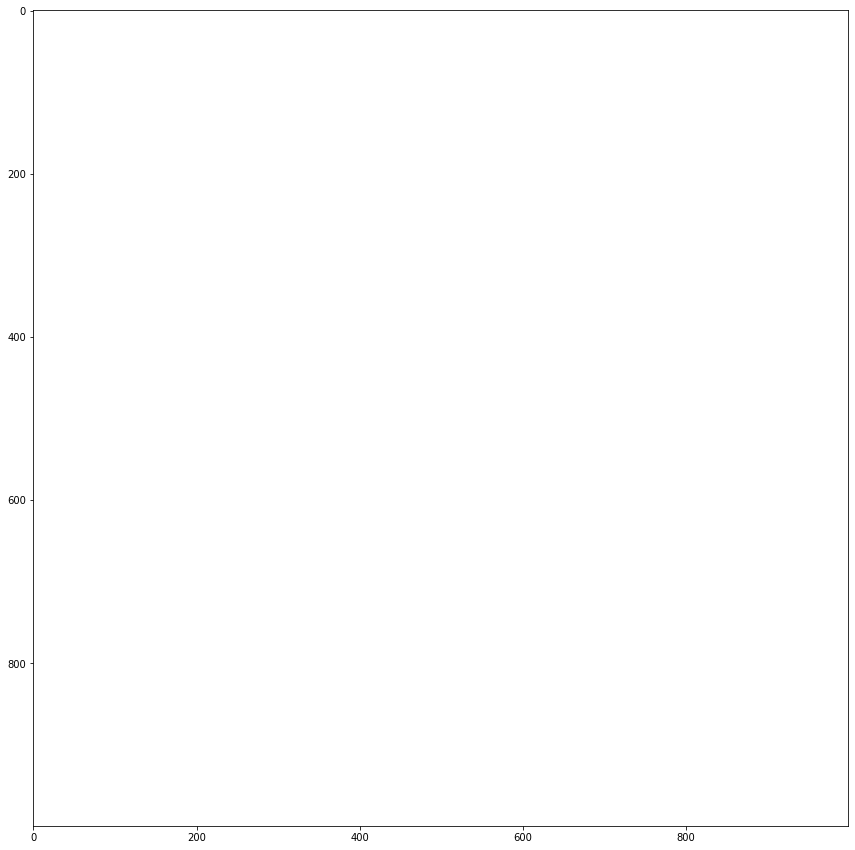

In [132]:
%%time
# Times how long it takes for the program to run

import numpy as np
import matplotlib.pyplot as plt
from celluloid import Camera

def intensity (z,x): # Draws the star with limb darkening  
    global r_star,centre_of_star
    r_squared= (z-centre_of_star)**2 + (x - centre_of_star)**2
    circle_mask = (z-centre_of_star)**2 + (x - centre_of_star)**2 <= r_star**2
    
    mu = np.sqrt(1 - r_squared/r_star**2,where=((z-centre_of_star)**2 + (x-centre_of_star)**2 <= r_star**2))
    
    return Intensity_max*(1-mu1*(1-mu)-mu2*(1 - mu)**2)*circle_mask

def planet_writer(z,x): # Draws the planet at the given centre  
    global centre_of_planet,r_planet
    return (z-centre_of_planet[1])**2 + (x-centre_of_planet[0])**2 > (r_planet)**2


def draw_stage(i,background): # Adds together the planet and star onto the same canvas
    global centre_of_planet, display_dim
    centre_of_planet = [X_coord_on_grid[i],Z_coord_on_grid[i]]
    
    display_added_planet = 1 * np.fromfunction(planet_writer, (display_dim, display_dim), dtype=int)
   
    return display_added_planet * background

###################################### Defining variables and constants

### Physical dimensions
radius_of_sun = 7e5 # Planet radius
radius_of_jupiter = 7e4 # Star radius
radius_of_ganymede = 5e3

#### Stuff for orbit
a= 7.8e9 # Semi Major axis
e = 0.0489 # Eccentricity < 1 to work
theta = np.linspace(-0.2 *10e-4, 0.2*10e-4, num=500) # Angular range where the planet crosses the star
phase = 0 
f = theta - phase 
r = a*(1 - e**2)/ (1 + e*np.cos(f)) # Distance between the star and the planet
i = 0
omega = np.pi/2
w = omega + phase

#### Stuff for Limb Darkening
mu1 = 0.3 # Variables for limb darkening 
mu2 = 0.1 # Variables for limb darkening 
Intensity_max = 100 # Max Intensity for limb darkening

### Stuff for Display
display_dim = 100 # Size of the 'display'

### Stuff for Flux graph
flux = []
###################################### Equations of motion
X_3D = - r* np.cos(w +f) 
Y_3D = - r* np.sin(w +f)* np.cos(i)
Z_3D = r* np.sin(w +f)* np.sin(i)

###################################### Set up of display
display = np.zeros((display_dim, display_dim))
centre_of_display = display_dim/2

###################################### Planet
SF = (radius_of_sun + 2*radius_of_jupiter) # Scaling display to fit star/planet

X_coord_on_grid = np.round(X_3D/SF * centre_of_display + centre_of_display) # Scaling X with respect to display
Z_coord_on_grid = np.round(Z_3D/SF * centre_of_display + centre_of_display) # Scaling Z with respect to display

r_planet = radius_of_jupiter/SF *  display_dim/2 # Scaling planet radius with respect to display
###################################### Star 
centre_of_star = centre_of_display # Centre of star
r_star = radius_of_sun/SF * display_dim/2 # Scaling star centre with respect to display

display_with_star = np.fromfunction(intensity,(display_dim, display_dim), dtype=int) # Drawing Star

###################################### Moon Stuff
r_moon = radius_of_ganymede/SF *  display_dim/2

theta_moon = np.linspace(0, 12*np.pi, num=500)

r_moon_orbit = r_planet*2
X_3D_Moon = - r_moon_orbit* np.cos(theta_moon) 
Y_3D_Moon = - r_moon_orbit* np.sin(theta_moon)* np.cos(0)
Z_3D_Moon = r_moon_orbit* np.sin(theta_moon)* np.sin(0)

def moon_writer(z,x):
    global centre_of_moon,centre_of_planet,r_moon
    return (z-centre_of_planet[1]-centre_of_moon[1])**2 + (x-centre_of_planet[0]-centre_of_moon[0])**2 > r_moon**2

def planet_mask(x,y):
    global centre_of_planet,r_planet

    return (x-centre_of_planet[0])**2 + (y-centre_of_planet[1])**2 > r_planet**2

Y_Less_Zero = Y_3D>0


for i in range(0,500):
    
    star_planet = draw_stage(i,display_with_star)# Drawing the star/planet at each planet centre
    centre_of_moon = [X_3D_Moon[i],Z_3D_Moon[i]]
    planet_mask_canvas =1* np.fromfunction(planet_mask, (display_dim, display_dim), dtype=int)
    
    if Y_Less_Zero[i] == True:
        addmask=planet_mask_canvas
    else:
        addmask = 1
        
    spot_canvas =   1* np.fromfunction(moon_writer, (display_dim, display_dim), dtype=int)
    
    display = star_planet * spot_canvas*addmask 
    ax.imshow(display, interpolation='nearest')
    camera.snap()

##########################################################################################


animation = camera.animate()
animation.save('Planet_and_moon.gif', writer='PillowWriter', fps=25)

Looking at the GIF, the motion of the moon and planet seems correct.

Next, I set the display dimensions to 1000 to see the moon better. It took 5 min 39s which is impressive given the program above takes 2 mins 10s for an array of 100 and doesn't have to make the gif.

CPU times: user 4.54 s, sys: 138 ms, total: 4.67 s
Wall time: 5.01 s


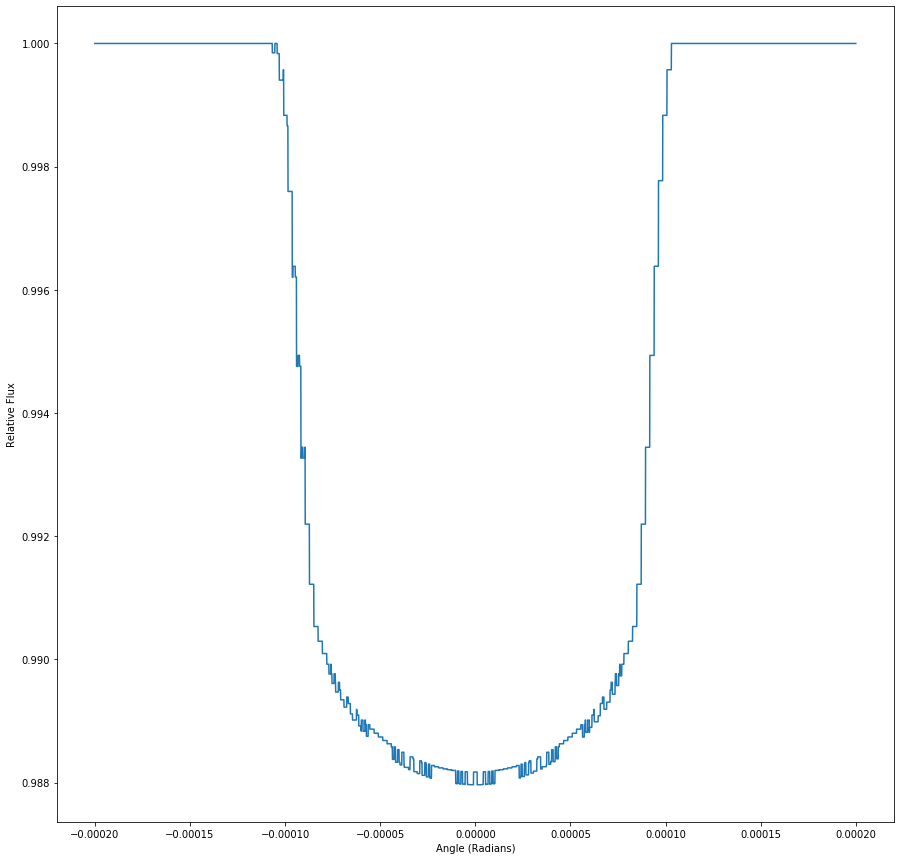

In [139]:
%%time
# Times how long it takes for the program to run

import numpy as np
import matplotlib.pyplot as plt
from celluloid import Camera

def intensity (z,x): # Draws the star with limb darkening  
    global r_star,centre_of_star
    r_squared= (z-centre_of_star)**2 + (x - centre_of_star)**2
    circle_mask = (z-centre_of_star)**2 + (x - centre_of_star)**2 <= r_star**2
    
    mu = np.sqrt(1 - r_squared/r_star**2,where=((z-centre_of_star)**2 + (x-centre_of_star)**2 <= r_star**2))
    
    return Intensity_max*(1-mu1*(1-mu)-mu2*(1 - mu)**2)*circle_mask

def planet_writer(z,x): # Draws the planet at the given centre  
    global centre_of_planet,r_planet
    return (z-centre_of_planet[1])**2 + (x-centre_of_planet[0])**2 > (r_planet)**2


def draw_stage(i,background): # Adds together the planet and star onto the same canvas
    global centre_of_planet, display_dim
    centre_of_planet = [X_coord_on_grid[i],Z_coord_on_grid[i]]
    
    display_added_planet = 1 * np.fromfunction(planet_writer, (display_dim, display_dim), dtype=int)
   
    return display_added_planet * background

def moon_writer(z,x):
    global centre_of_moon,centre_of_planet,r_moon
    return (z-centre_of_planet[1]-centre_of_moon[1])**2 + (x-centre_of_planet[0]-centre_of_moon[0])**2 > r_moon**2

def planet_mask(x,y):
    global centre_of_planet,r_planet

    return (x-centre_of_planet[0])**2 + (y-centre_of_planet[1])**2 > r_planet**2
###################################### Defining variables and constants
### Theta numbers
theta_values = 5000

### Physical dimensions
radius_of_sun = 7e5 # Planet radius
radius_of_jupiter = 7e4 # Star radius
radius_of_ganymede = 5e3

#### Stuff for orbit
a= 7.8e9 # Semi Major axis
e = 0.0489 # Eccentricity < 1 to work
theta = np.linspace(-0.2 *10e-4, 0.2*10e-4, num=theta_values) # Angular range where the planet crosses the star
phase = 0 
f = theta - phase 
r = a*(1 - e**2)/ (1 + e*np.cos(f)) # Distance between the star and the planet
i = 0
omega = np.pi/2
w = omega + phase

#### Stuff for Limb Darkening
mu1 = 0.3 # Variables for limb darkening 
mu2 = 0.1 # Variables for limb darkening 
Intensity_max = 100 # Max Intensity for limb darkening

### Stuff for Display
display_dim = 100 # Size of the 'display'

### Stuff for Flux graph
flux = []
###################################### Equations of motion
X_3D = - r* np.cos(w +f) 
Y_3D = - r* np.sin(w +f)* np.cos(i)
Z_3D = r* np.sin(w +f)* np.sin(i)

###################################### Set up of display
display = np.zeros((display_dim, display_dim))
centre_of_display = display_dim/2

###################################### Planet
SF = (radius_of_sun + 2*radius_of_jupiter) # Scaling display to fit star/planet

X_coord_on_grid = np.round(X_3D/SF * centre_of_display + centre_of_display) # Scaling X with respect to display
Z_coord_on_grid = np.round(Z_3D/SF * centre_of_display + centre_of_display) # Scaling Z with respect to display

r_planet = radius_of_jupiter/SF *  display_dim/2 # Scaling planet radius with respect to display
###################################### Star 
centre_of_star = centre_of_display # Centre of star
r_star = radius_of_sun/SF * display_dim/2 # Scaling star centre with respect to display

display_with_star = np.fromfunction(intensity,(display_dim, display_dim), dtype=int) # Drawing Star

###################################### Moon Stuff
r_moon = radius_of_ganymede/SF *  display_dim/2

theta_moon = np.linspace(0, 12*np.pi, num=theta_values)

r_moon_orbit = r_planet*2
X_3D_Moon = - r_moon_orbit* np.cos(theta_moon) 
Y_3D_Moon = - r_moon_orbit* np.sin(theta_moon)* np.cos(0)
Z_3D_Moon = r_moon_orbit* np.sin(theta_moon)* np.sin(0)


Y_Less_Zero = Y_3D>0


fig = plt.figure(figsize=(15,15))

for i in range(0,theta_values):
    
    star_planet = draw_stage(i,display_with_star)# Drawing the star/planet at each planet centre
    centre_of_moon = [X_3D_Moon[i],Z_3D_Moon[i]]
    planet_mask_canvas =1* np.fromfunction(planet_mask, (display_dim, display_dim), dtype=int)
    
    if Y_Less_Zero[i] == True:
        addmask=planet_mask_canvas
    else:
        addmask = 1
        
    spot_canvas =   1* np.fromfunction(moon_writer, (display_dim, display_dim), dtype=int)
    
    display = star_planet * spot_canvas*addmask 
    flux.append(np.sum(display))

##########################################################################################

plt.xlabel('Angle (Radians)')
plt.ylabel('Relative Flux')
plt.plot(theta[0:theta_values],flux/flux[0])

## ldtk library

We have been introduced to a new library to get the limb darkening parameters.

Python package ldtk for limb darkening parameters https://github.com/hpparvi/ldtk

In [138]:
#!pip3 install ldtk # Remove # to install ldtk

In [145]:
import ldtk

ModuleNotFoundError: No module named 'semantic_version'

I also need to install 'semantic_version' apparently

In [146]:
#!pip3 install semantic-version # Remove # to install semantic-version

In [147]:
import ldtk

In [148]:
help(ldtk) # Get some information about the library

Help on package ldtk:

NAME
    ldtk

DESCRIPTION
    Limb darkening toolkit
    Copyright (C) 2015  Hannu Parviainen <hpparvi@gmail.com>
    
    This program is free software; you can redistribute it and/or modify
    it under the terms of the GNU General Public License as published by
    the Free Software Foundation; either version 2 of the License, or
    (at your option) any later version.
    
    This program is distributed in the hope that it will be useful,
    but WITHOUT ANY WARRANTY; without even the implied warranty of
    MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.  See the
    GNU General Public License for more details.
    
    You should have received a copy of the GNU General Public License along
    with this program; if not, write to the Free Software Foundation, Inc.,
    51 Franklin Street, Fifth Floor, Boston, MA 02110-1301 USA.

PACKAGE CONTENTS
    client
    core
    filters
    ldmodel
    ldtk
    models (package)
    qe
    version

DATA
    kepl

This looks like something I'll leave until later.

## Code from ***** for time of transit

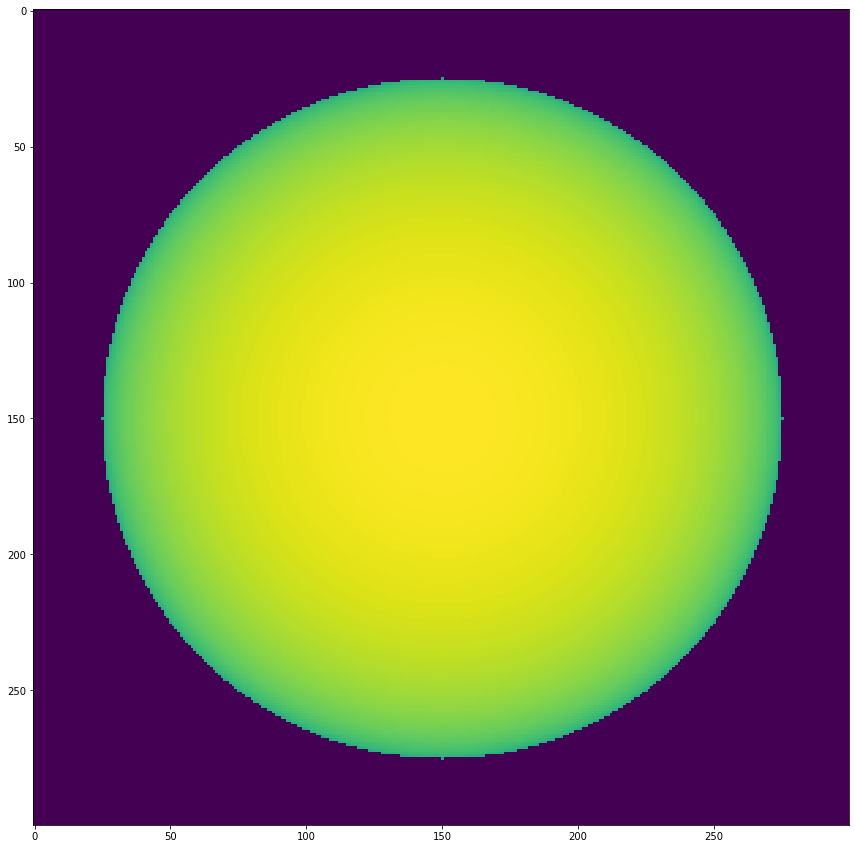

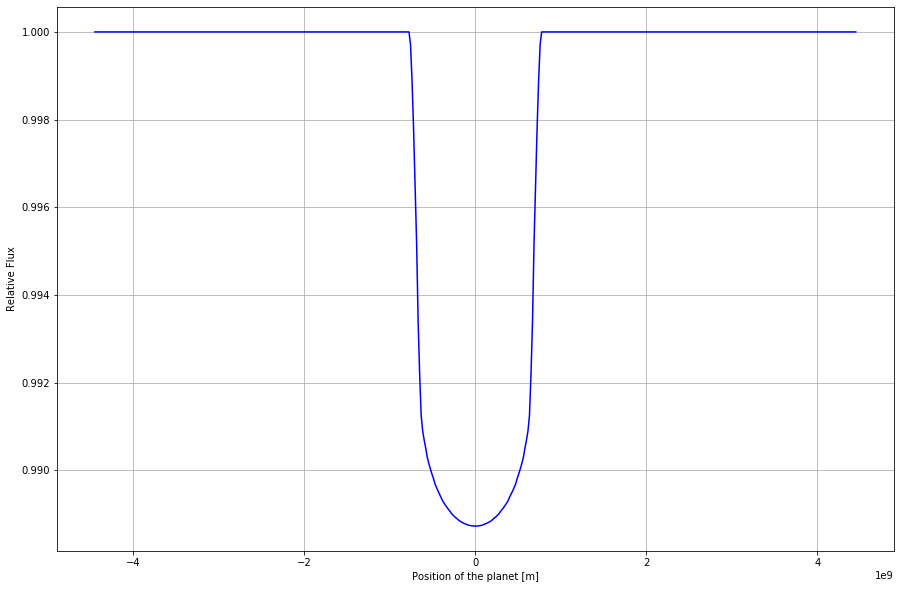

In [23]:
import numpy as np
import matplotlib.pyplot as plt

def intensity (x,y): # Draws the star with limb darkening  
    global r_star,centre_of_star
    r_squared= (x-centre_of_star[1])**2 + (y-centre_of_star[1])**2
    circle_mask = (x-centre_of_star[1])**2 + (y-centre_of_star[1])**2 <= r_star**2
    mu = np.sqrt(1 - r_squared/r_star**2,where=((x-centre_of_star[1])**2 + (y-centre_of_star[1])**2 <= r_star**2))
    
    return Intensity_max*(1-mu1*(1-mu)-mu2*(1 - mu)**2)*circle_mask

def planet_writer(x,y): # Draws the planet at the given centre  
    global centre_of_planet,r_planet
    return (x-centre_of_planet[1])**2 + (y-centre_of_planet[0])**2 > (r_planet)**2


def draw_stage(i,background): # Adds together the planet and star onto the same canvas
    global centre_of_planet, display_dim
    centre_of_planet = [X_coord_on_grid[i],Z_coord_on_grid[i]]
    
    display_added_planet = 1 * np.fromfunction(planet_writer, (display_dim, display_dim), dtype=int)
   
    return display_added_planet * background

###################################### Defining variables and constants

### Physical dimensions
radius_of_sun = 7e8 # Star radius in m
radius_of_jupiter = 7e7 # Planet radius in m

#### Stuff for orbit
a= 7.8e12 # Semi Major axis in m
e = 0.0489 # Eccentricity < 1 to work
theta = np.linspace(-0.6 *10e-4, 0.6*10e-4, num=500) # Angular range where the planet crosses the star
phase = 0 
f = theta - phase 
r = a*(1 - e**2)/ (1 + e*np.cos(f)) # Distance between the star and the planet
i = 0
omega = np.pi/2
w = omega + phase

#### Stuff for Limb Darkening
mu1 = 0.3 # Variables for limb darkening 
mu2 = 0.1 # Variables for limb darkening 
Intensity_max = 100 # Max Intensity for limb darkening

### Stuff for Display
'''For a high resolution display use display_dim = 1000
    For a quick-to-execute display use display_dim = 100'''

display_dim = 300 # Size of the 'display'



### Stuff for Flux graph
flux = []
###################################### Equations of motion
X_3D = - r* np.cos(w +f) 
Y_3D = - r* np.sin(w +f)* np.cos(i)
Z_3D = r* np.sin(w +f)* np.sin(i)

###################################### Set up of display
display = np.zeros((display_dim, display_dim))
centre_of_display = display_dim/2

###################################### Planet
SF = (radius_of_sun + 2*radius_of_jupiter) # Scaling display to fit star/planet

X_coord_on_grid = np.round(X_3D/SF * centre_of_display + centre_of_display) # Scaling X with respect to display
Z_coord_on_grid = np.round(Z_3D/SF * centre_of_display + centre_of_display) # Scaling Z with respect to display

r_planet = radius_of_jupiter/SF *  display_dim/2 # Scaling planet radius with respect to display
###################################### Star 
centre_of_star = [centre_of_display,centre_of_display] # Centre of star
r_star = radius_of_sun/SF * display_dim/2 # Scaling star centre with respect to display

display_with_star = np.fromfunction(intensity,(display_dim, display_dim), dtype=int) # Drawing Star

####################################### Graph of star and planet
i = 0

display = draw_stage(i,display_with_star)

fig = plt.figure(figsize=(15,15))
plt.imshow(display, interpolation='nearest')

###################################### Putting everything together

##################################### Finding the max flux
i = 0 

display = np.sum(draw_stage(i,display_with_star))
max_flux = display
normalisation_constant = max_flux

###################################### Finding the relative flux of the star at different planetary positions
i = 0

while i<500:

    display = np.sum(draw_stage(i,display_with_star)) # Drawing the star/planet at each planet centre
    flux.append(display)
    display = np.sum(draw_stage(0,display_with_star))
    
    i+=1
    
relative_flux = flux/normalisation_constant

#################################### Plotting the transit of the planet at different positions
i = range(500)

fig = plt.figure(figsize=(15,10))
ax = plt.plot(X_3D, relative_flux, 'b')
plt.grid()
plt.xlabel('Position of the planet [m]')
plt.ylabel('Relative Flux')
plt.show()

374453350.4126937
137445.5555334122


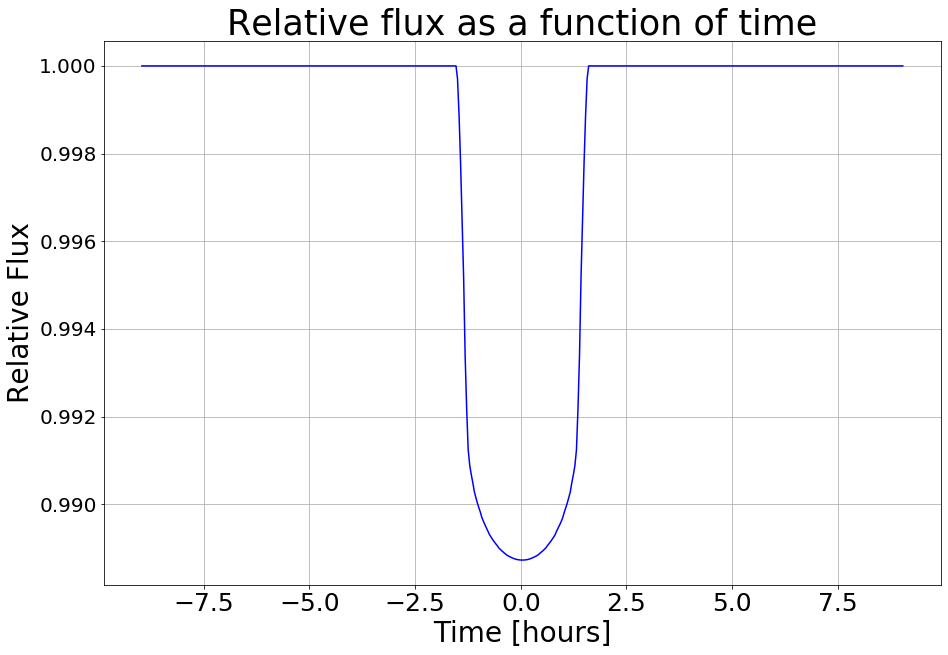

In [166]:
'''Other variables'''
from scipy.constants import physical_constants as pc_dict
G = pc_dict['Newtonian constant of gravitation'][0]
Ms = 2E+30   # approx mass of sun in kg
Mp = 1.9E+27  # approx mass of Jupiter in kg

''' Period of Orbit'''
P = np.sqrt((4*np.pi**2)/(G*(Ms+Mp)) *(a/10)**(3)) # NB: a is divided by 10 because the true value of the Jupiter semi-major axis is 7.8E11, however using this value in the above code gives a low resolution graph.
print (P)
''' Finding the velocity of the planet '''
n = 2*np.pi/P # mean motion 
v = np.sqrt((((n**2)*(a**2))/(1-e**2))*(1+2*e*np.cos(f)+e**2))
mean_v = np.sum(v)/len(v) # average velocity that is very similar to each velocity in the array of v
print (mean_v) # in m/s

'''Finding time'''
distance = np.abs(max(X_3D)) + np.abs(min(X_3D))  
t = distance/mean_v 
t = t/60**2

'''Plotting the graph'''
factor = flux.index(min(flux))/500  # factor to keep T=0 at the centre of the trough

fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(1, 1, 1)
ax = plt.plot(np.linspace(-np.round(t)*(factor),np.round(t)*(1-factor),500), relative_flux, 'b')
plt.grid()
plt.title('Relative flux as a function of time', size=35)
plt.xlabel('Time [hours]', size=28)
plt.xticks(fontsize=25)
plt.ylabel('Relative Flux', size=28)
plt.yticks(fontsize=20)
plt.savefig("fluxplot.png")
plt.show()

In [162]:
374453350.4126937/(3600*24*365) # About right for the period of Jupiters orbit 

11.873837849210226

Now I need to sync the period of the moon's orbit to the transit time:


In [2]:
## SUDO CODE TRYING TO FIGURE OUT HOW TO DO IT

#time_cross = t
#moon_period = 216
#moon_phase = 0

# moon period/ time_cross = 72 so range of theta for moon is 0+moon_phase,2*pi/72
#theta_moon = np.linspace(0, 12*np.pi, num=theta_values)
#moon_period/time_cross

<a id="6"></a>
# 1/3/21 - Planet-Moon transit
***
### Jump to date:
* [1/2/21 - Orbital Motion](#1)
* [8/2/21 - Limb darkening, Drawing the planet transiting in front of the star, Animation](#2)
* [Between Weeks - Optimisation and Bug fixing](#3)
* [15/2/21 - Spinning and Rotation](#4)
* [22/2/21 - Reading data and adding a moon](#5)
* [1/3/21 - Planet-Moon transit](#6)
* [8/3/21 - Improved limb darkening](#7)
* [15/3/21 - Planetry atmosphere](#8)

The things I aim to do today:
* Getting time for the transit

* I can then sync the transit time of the planet to the period of moons 

* I think the program has been looking in the wrong axis as I've used i = 0 for the transits where as paper 1 uses i = $\frac{\pi}{2}$. So far it has not mattered as I've used the XZ plane but paper 1 uses the XY plane but it will matter when we compare the model to real data.


Other thoughts:

* I thought about adding having the planet/moon orbit around the barycenter instead of just the planet centre. However, since the motion of the moon will have a negligible effect on the light curve, the mass of the moon is negligible to the mass of the planet so the barycentre will be close to the centre of the planet (It will probably only make a few pixels difference) and the effect to the light curve will remain largely the same (both objects will obscure the star at roughly the same time). I, therefore, don't think it is worth doing for now.

Questions:
Wavelength?

## Adding moon period

### For initialising functions and variables needed later:

In [2]:
%%time
# Times how long it takes for the program to run

import numpy as np
import matplotlib.pyplot as plt

def intensity (z,x): # Draws the star with limb darkening  
    global r_star,centre_of_star
    r_squared= (z-centre_of_star)**2 + (x - centre_of_star)**2
    circle_mask = (z-centre_of_star)**2 + (x - centre_of_star)**2 <= r_star**2
    
    mu = np.sqrt(1 - r_squared/r_star**2,where=((z-centre_of_star)**2 + (x-centre_of_star)**2 <= r_star**2))
    
    return Intensity_max*(1-mu1*(1-mu)-mu2*(1 - mu)**2)*circle_mask

def planet_writer(z,x): # Draws the planet at the given centre  
    global centre_of_planet,r_planet
    return (z-centre_of_planet[1])**2 + (x-centre_of_planet[0])**2 > (r_planet)**2


def draw_stage(i,background): # Adds together the planet and star onto the same canvas
    global centre_of_planet, display_dim
    centre_of_planet = [X_coord_on_grid[i],Z_coord_on_grid[i]]
    
    display_added_planet = 1 * np.fromfunction(planet_writer, (display_dim, display_dim), dtype=int)
   
    return display_added_planet * background

###################################### Defining variables and constants

### Physical dimensions
radius_of_sun = 7e8 # Planet radius
radius_of_jupiter = 7e7 # Star radius

#### Stuff for orbit
a= 7.8e12 # Semi Major axis
e = 0.0489 # Eccentricity < 1 to work
theta = np.linspace(-0.6 *10e-4, 0.6*10e-4, num=500) # Angular range where the planet crosses the star
phase = 0 
f = theta - phase 
r = a*(1 - e**2)/ (1 + e*np.cos(f)) # Distance between the star and the planet
i = 0
omega = np.pi/2
w = omega + phase

#### Stuff for Limb Darkening
mu1 = 0.3 # Variables for limb darkening 
mu2 = 0.1 # Variables for limb darkening 
Intensity_max = 100 # Max Intensity for limb darkening

### Stuff for Display
display_dim = 100 # Size of the 'display'

### Stuff for Flux graph
flux = []
###################################### Equations of motion
X_3D = - r* np.cos(w +f) 
Y_3D = - r* np.sin(w +f)* np.cos(i)
Z_3D = r* np.sin(w +f)* np.sin(i)

###################################### Set up of display
display = np.zeros((display_dim, display_dim))
centre_of_display = display_dim/2

###################################### Planet
SF = (radius_of_sun + 2*radius_of_jupiter) # Scaling display to fit star/planet

X_coord_on_grid = np.round(X_3D/SF * centre_of_display + centre_of_display) # Scaling X with respect to display
Z_coord_on_grid = np.round(Z_3D/SF * centre_of_display + centre_of_display) # Scaling Z with respect to display

r_planet = radius_of_jupiter/SF *  display_dim/2 # Scaling planet radius with respect to display
###################################### Star 
centre_of_star = centre_of_display # Centre of star
r_star = radius_of_sun/SF * display_dim/2 # Scaling star centre with respect to display

display_with_star = np.fromfunction(intensity,(display_dim, display_dim), dtype=int) # Drawing Star
###################################### Putting everything together

for i in range(0,500):
    display = np.sum(draw_stage(i,display_with_star)) # Drawing the star/planet at each planet centre
    flux.append(display)

fig = plt.figure(figsize=(15,10))
plt.plot(theta[0:500],flux/flux[0])

CPU times: user 862 ms, sys: 199 ms, total: 1.06 s
Wall time: 1.54 s


Getting the distance from the centre of the planet to centre of the star so that I can measure when the centre of the planet crosses the star.

In [200]:
distance_from_centre = np.sqrt(np.square(X_coord_on_grid - centre_of_display) + np.square(Z_coord_on_grid - centre_of_display))
print (distance_from_centre)
print (r_star)

[265. 264. 263. 262. 261. 260. 259. 258. 256. 255. 254. 253. 252. 251.
 250. 249. 248. 247. 246. 245. 244. 243. 242. 241. 239. 238. 237. 236.
 235. 234. 233. 232. 231. 230. 229. 228. 227. 226. 225. 224. 222. 221.
 220. 219. 218. 217. 216. 215. 214. 213. 212. 211. 210. 209. 208. 207.
 205. 204. 203. 202. 201. 200. 199. 198. 197. 196. 195. 194. 193. 192.
 191. 190. 188. 187. 186. 185. 184. 183. 182. 181. 180. 179. 178. 177.
 176. 175. 174. 173. 172. 170. 169. 168. 167. 166. 165. 164. 163. 162.
 161. 160. 159. 158. 157. 156. 155. 153. 152. 151. 150. 149. 148. 147.
 146. 145. 144. 143. 142. 141. 140. 139. 138. 136. 135. 134. 133. 132.
 131. 130. 129. 128. 127. 126. 125. 124. 123. 122. 121. 119. 118. 117.
 116. 115. 114. 113. 112. 111. 110. 109. 108. 107. 106. 105. 104. 102.
 101. 100.  99.  98.  97.  96.  95.  94.  93.  92.  91.  90.  89.  88.
  87.  85.  84.  83.  82.  81.  80.  79.  78.  77.  76.  75.  74.  73.
  72.  71.  70.  68.  67.  66.  65.  64.  63.  62.  61.  60.  59.  58.
  57. 

In [216]:
inside_sun = np.where(distance_from_centre <= r_star)[0]

print (inside_sun)

[211 212 213 214 215 216 217 218 219 220 221 222 223 224 225 226 227 228
 229 230 231 232 233 234 235 236 237 238 239 240 241 242 243 244 245 246
 247 248 249 250 251 252 253 254 255 256 257 258 259 260 261 262 263 264
 265 266 267 268 269 270 271 272 273 274 275 276 277 278 279 280 281 282
 283 284 285 286 287 288]


In [217]:
distance_from_centre[211]

41.0

In [218]:
first = inside_sun[0]
last = inside_sun[-1]

print (first)
print (last)

211
288


In [219]:
'''Other variables'''
from scipy.constants import physical_constants as pc_dict
G = pc_dict['Newtonian constant of gravitation'][0]
Ms = 2E+30   # approx mass of sun in kg
Mp = 1.9E+27  # approx mass of Jupiter in kg

''' Period of Orbit'''
P = np.sqrt((4*np.pi**2)/(G*(Ms+Mp)) *(a/10)**(3)) # NB: a is divided by 10 because the true value of the Jupiter semi-major axis is 7.8E11, however using this value in the above code gives a low resolution graph.
''' Finding the velocity of the planet '''
n = 2*np.pi/P # mean motion 
v = np.sqrt((((n**2)*(a**2))/(1-e**2))*(1+2*e*np.cos(f)+e**2))
mean_v = np.sum(v)/len(v) # average velocity that is very similar to each velocity in the array of v

'''Finding time'''
distance = np.abs(X_3D[first]) + np.abs(X_3D[last])  
t = distance/mean_v 
t = t/60**2 # in hours
factor = flux.index(min(flux))/theta_values

print (t)

2.776252787980902


I can compare this to 

In [220]:
relative_flux = flux/flux[0]

inside_sun = np.where(relative_flux < 1)[0]
first = inside_sun[0]
last = inside_sun[-1]

print (first)
print (last)

207
292


I can compare this to the total time the planet is in front of the star by looking at when the relative flux is not equal to zero. 

In [224]:
'''Other variables'''
from scipy.constants import physical_constants as pc_dict
G = pc_dict['Newtonian constant of gravitation'][0]
Ms = 2E+30   # approx mass of sun in kg
Mp = 1.9E+27  # approx mass of Jupiter in kg

''' Period of Orbit'''
P = np.sqrt((4*np.pi**2)/(G*(Ms+Mp)) *(a/10)**(3)) # NB: a is divided by 10 because the true value of the Jupiter semi-major axis is 7.8E11, however using this value in the above code gives a low resolution graph.
print (P)
''' Finding the velocity of the planet '''
n = 2*np.pi/P # mean motion 
v = np.sqrt((((n**2)*(a**2))/(1-e**2))*(1+2*e*np.cos(f)+e**2))
mean_v = np.sum(v)/len(v) # average velocity that is very similar to each velocity in the array of v
print (mean_v) # in m/s

'''Finding time'''
distance = np.abs(max(X_3D)) + np.abs(min(X_3D))  
t = distance/mean_v 
t = t/60**2

'''Plotting the graph'''
factor = flux.index(min(flux))/500  # factor to keep T=0 at the centre of the trough


374453350.4126937
137445.5555334122


In [225]:
arrival = np.linspace(-np.round(t)*(factor),np.round(t)*(1-factor),500)[first]

In [226]:
leave = np.linspace(-np.round(t)*(factor),np.round(t)*(1-factor),500)[last]

In [227]:
leave - arrival

3.0661322645290587

Adding the time to the moon orbit

In [210]:
time_cross = t # hours
moon_period = 216 # hours
moon_phase = 0
theta_values = 500

# moon period/ time_cross = 72 so range of theta for moon is 0+moon_phase,2*pi/72
fraction_of_orbit_in_transit = time_cross/moon_period

theta_moon = np.linspace(0+moon_phase, 2*np.pi * fraction_of_orbit_in_transit , num=theta_values)
print (theta_moon)

[0.         0.00016184 0.00032368 0.00048552 0.00064736 0.0008092
 0.00097104 0.00113288 0.00129472 0.00145656 0.0016184  0.00178023
 0.00194207 0.00210391 0.00226575 0.00242759 0.00258943 0.00275127
 0.00291311 0.00307495 0.00323679 0.00339863 0.00356047 0.00372231
 0.00388415 0.00404599 0.00420783 0.00436967 0.00453151 0.00469335
 0.00485519 0.00501703 0.00517886 0.0053407  0.00550254 0.00566438
 0.00582622 0.00598806 0.0061499  0.00631174 0.00647358 0.00663542
 0.00679726 0.0069591  0.00712094 0.00728278 0.00744462 0.00760646
 0.0077683  0.00793014 0.00809198 0.00825382 0.00841565 0.00857749
 0.00873933 0.00890117 0.00906301 0.00922485 0.00938669 0.00954853
 0.00971037 0.00987221 0.01003405 0.01019589 0.01035773 0.01051957
 0.01068141 0.01084325 0.01100509 0.01116693 0.01132877 0.01149061
 0.01165245 0.01181428 0.01197612 0.01213796 0.0122998  0.01246164
 0.01262348 0.01278532 0.01294716 0.013109   0.01327084 0.01343268
 0.01359452 0.01375636 0.0139182  0.01408004 0.01424188 0.01440

## Version 1.7:

The plot of the planet/moon orbiting the star with time added to the plot.

In [4]:
%%time
# Times how long it takes for the program to run

import numpy as np
import matplotlib.pyplot as plt



###################################### Defining variables and constants
from scipy.constants import physical_constants as pc_dict

### For time of transit
G = pc_dict['Newtonian constant of gravitation'][0]
Ms = 2E+30   # approx mass of sun in kg
Mp = 1.9E+27  # approx mass of Jupiter in kg

### Theta numbers
theta_values = 500

### Physical dimensions
radius_of_sun = 7e8 # Planet radius m
radius_of_jupiter = 7e7 # Star radius m 
radius_of_ganymede = 5e6 # Moon radius m 



#### Stuff for orbit
a= 7.8e12 # Semi Major axis in m
e = 0.0489 # Eccentricity < 1 to work

theta = np.linspace(-0.4 *10e-4, 0.4*10e-4, num=theta_values) # Angular range where the planet crosses the star
phase = 0 
f = theta - phase 
r = a*(1 - e**2)/ (1 + e*np.cos(f)) # Distance between the star and the planet
i = 0
omega = np.pi/2
w = omega + phase

#### Stuff for Limb Darkening
mu1 = 0.3 # Variables for limb darkening 
mu2 = 0.1 # Variables for limb darkening 
Intensity_max = 100 # Max Intensity for limb darkening

### Stuff for Display
display_dim = 100 # Size of the 'display'

### Moon Stuff
moon_period = 216 # hours
moon_phase = 0

###################################### Equations of motion
X_3D = - r* np.cos(w +f) 
Y_3D = - r* np.sin(w +f)* np.cos(i)
Z_3D = r* np.sin(w +f)* np.sin(i)

def intensity (z,x): # Draws the star with limb darkening  
    global r_star,centre_of_star
    r_squared= (z-centre_of_star)**2 + (x - centre_of_star)**2
    circle_mask = (z-centre_of_star)**2 + (x - centre_of_star)**2 <= r_star**2
    
    mu = np.sqrt(1 - r_squared/r_star**2,where=((z-centre_of_star)**2 + (x-centre_of_star)**2 <= r_star**2))
    
    return Intensity_max*(1-mu1*(1-mu)-mu2*(1 - mu)**2)*circle_mask

def planet_writer(z,x): # Draws the planet at the given centre  
    global centre_of_planet,r_planet
    return (z-centre_of_planet[1])**2 + (x-centre_of_planet[0])**2 > (r_planet)**2


def draw_stage(i,background): # Adds together the planet and star onto the same canvas
    global centre_of_planet, display_dim
    centre_of_planet = [X_coord_on_grid[i],Z_coord_on_grid[i]]
    
    display_added_planet = 1 * np.fromfunction(planet_writer, (display_dim, display_dim), dtype=int)
   
    return display_added_planet * background

def moon_writer(z,x):
    global centre_of_moon,centre_of_planet,r_moon
    return (z-centre_of_planet[1]-centre_of_moon[1])**2 + (x-centre_of_planet[0]-centre_of_moon[0])**2 > r_moon**2

def planet_mask(x,y):
    global centre_of_planet,r_planet

    return (x-centre_of_planet[0])**2 + (y-centre_of_planet[1])**2 > r_planet**2
######################################## Time stuff
''' Period of Orbit'''
P = np.sqrt((4*np.pi**2)/(G*(Ms+Mp)) *(a/10)**(3)) # NB: a is divided by 10 because the true value of the Jupiter semi-major axis is 7.8E11, however using this value in the above code gives a low resolution graph.
''' Finding the velocity of the planet '''
n = 2*np.pi/P # mean motion 
v = np.sqrt((((n**2)*(a**2))/(1-e**2))*(1+2*e*np.cos(f)+e**2))
mean_v = np.sum(v)/len(v) # average velocity that is very similar to each velocity in the array of v
# in m/s

'''Finding time'''
distance = np.abs(max(X_3D)) + np.abs(min(X_3D))  
t = distance/mean_v 
t = t/60**2


###################################### Set up of display
display = np.zeros((display_dim, display_dim))
centre_of_display = display_dim/2

###################################### Planet
SF = (radius_of_sun + 2*radius_of_jupiter) # Scaling display to fit star/planet

X_coord_on_grid = np.round(X_3D/SF * centre_of_display + centre_of_display) # Scaling X with respect to display
Z_coord_on_grid = np.round(Z_3D/SF * centre_of_display + centre_of_display) # Scaling Z with respect to display

r_planet = radius_of_jupiter/SF *  display_dim/2 # Scaling planet radius with respect to display
###################################### Star 
centre_of_star = centre_of_display # Centre of star
r_star = radius_of_sun/SF * display_dim/2 # Scaling star centre with respect to display

display_with_star = np.fromfunction(intensity,(display_dim, display_dim), dtype=int) # Drawing Star

### Stuff for Flux graph
flux = []

###################################### Moon Stuff
time_cross = t # hours
fraction_of_orbit_in_transit = time_cross/moon_period

theta_moon = np.linspace(0 + moon_phase, 2*np.pi * fraction_of_orbit_in_transit , num=theta_values)
r_moon = radius_of_ganymede/SF *  display_dim/2

r_moon_orbit = r_planet*2
X_3D_Moon = - r_moon_orbit* np.cos(theta_moon) 
Y_3D_Moon = - r_moon_orbit* np.sin(theta_moon)* np.cos(0)
Z_3D_Moon = r_moon_orbit* np.sin(theta_moon)* np.sin(0)

Y_Less_Zero = Y_3D>0

for i in range(0,theta_values):
    
    star_planet = draw_stage(i,display_with_star)# Drawing the star/planet at each planet centre
    centre_of_moon = [X_3D_Moon[i],Z_3D_Moon[i]]
    planet_mask_canvas =1* np.fromfunction(planet_mask, (display_dim, display_dim), dtype=int)
    
    if Y_Less_Zero[i] == True:
        addmask=planet_mask_canvas
    else:
        addmask = 1
        
    moon_canvas =   1* np.fromfunction(moon_writer, (display_dim, display_dim), dtype=int)
    
    display = star_planet * moon_canvas*addmask 
    
    
    flux.append(np.sum(display))

##########################################################################################
normalisation_constant = flux[0]

CPU times: user 370 ms, sys: 13.8 ms, total: 384 ms
Wall time: 405 ms


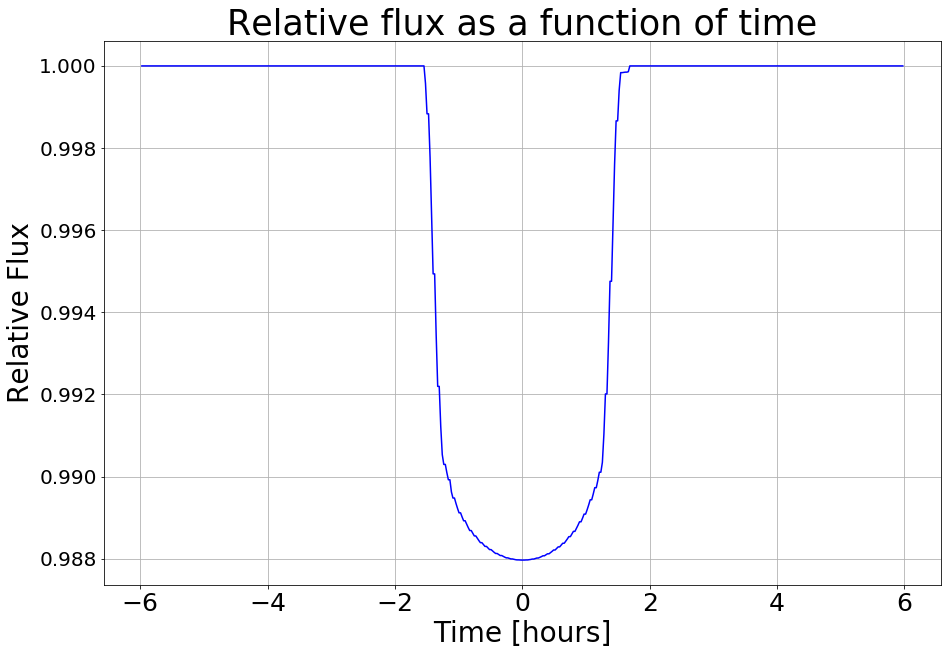

In [5]:
relative_flux = flux/normalisation_constant

'''Plotting the graph'''
factor = flux.index(min(flux))/theta_values  # factor to keep T=0 at the centre of the trough
fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(1, 1, 1)
ax = plt.plot(np.linspace(-np.round(t)*(factor),np.round(t)*(factor),theta_values), relative_flux, 'b')
plt.grid()
plt.title('Relative flux as a function of time', size=35)
plt.xlabel('Time [hours]', size=28)
plt.xticks(fontsize=25)
plt.ylabel('Relative Flux', size=28)
plt.yticks(fontsize=20)
plt.show()

In [284]:
inside_sun = np.where(relative_flux < 1)[0]
first = inside_sun[0]
last = inside_sun[-1]

arrival = np.linspace(-np.round(t)*(factor),np.round(t)*(1-factor),theta_values)[first]
leave = np.linspace(-np.round(t)*(factor),np.round(t)*(1-factor),theta_values)[last]

print ("Total time the star is obscured:")
print(leave - arrival) 

Total time the star is obscured:
3.1983967935871744


Just check everything is alright, I checked to see if the transit time is the same as before when without moon then with it. It does slightly make the transit longer when a moon is there.

The only thing left to do with the moons is to set a better orbit rather than just assuming the orbit is circular and having a variable for the moon's orbit rather than just putting in a number. 

<div class="alert alert-block alert-info">
<b>Project info:</b> I helped ***** sort out some problems with the code for the new exoplanet. The planet didn't appear to move across the screen so I had to debug the code to make sure there wasn't anything wrong with the model. It turns out the angular range was a factor of 100 out and that seemed to fix it when I changed it. This is quite suprising as I thought it should be about the same as for Jupiter/Sun. Although after speaking to *****, it makes sense that as the period is much shorter, a larger percentage of the orbit is the transit so a larger angular range needs to be considered.
</div>

### Fixed code:

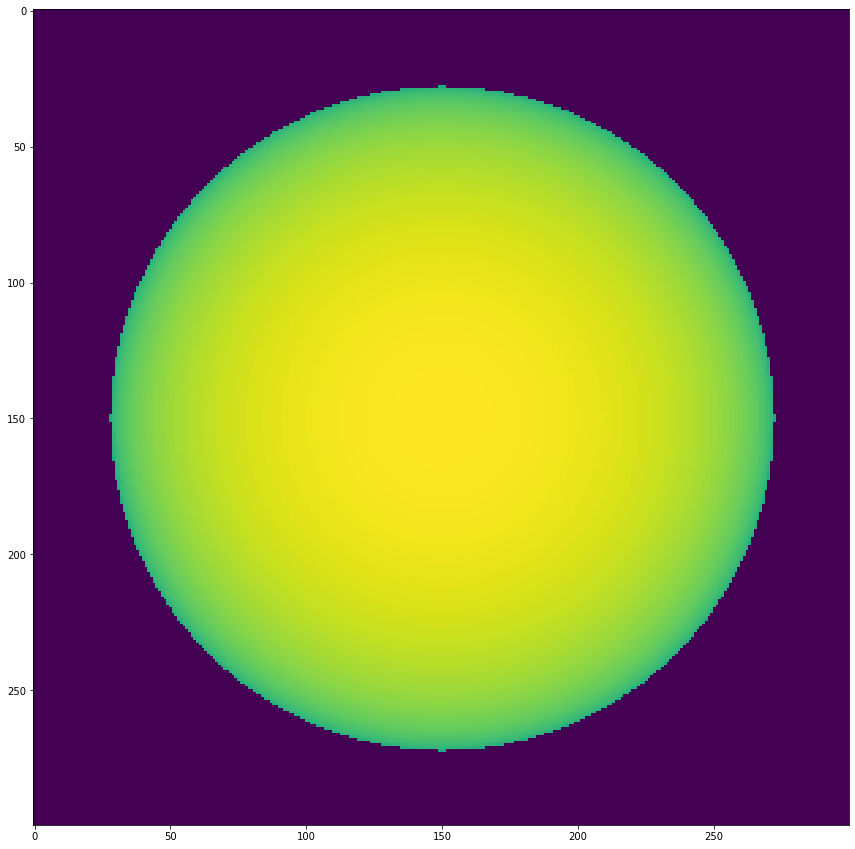

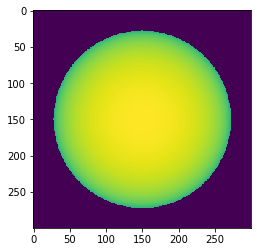

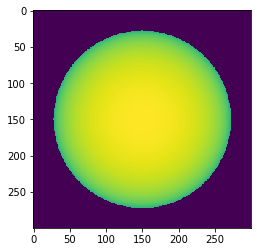

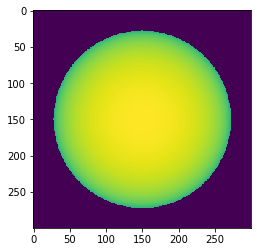

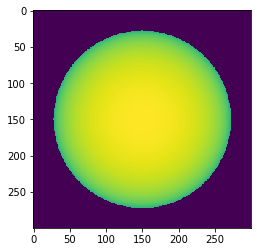

...

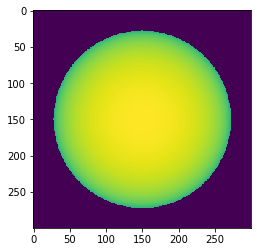

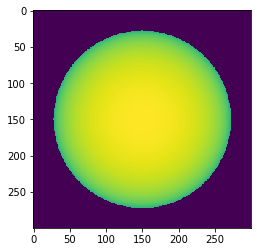

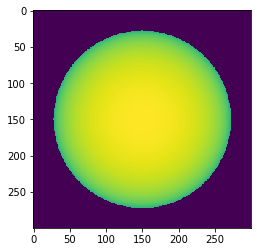

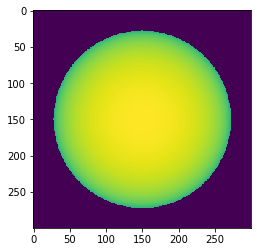

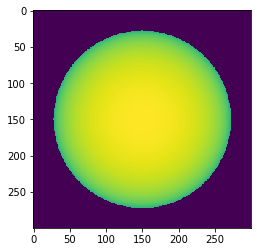

In [107]:
import numpy as np
import matplotlib.pyplot as plt 


def intensity (x,y): # Draws the star with limb darkening  
    global r_star,centre_of_star
    r_squared= (x-centre_of_star[1])**2 + (y-centre_of_star[1])**2
    circle_mask = (x-centre_of_star[1])**2 + (y-centre_of_star[1])**2 <= r_star**2
    mu = np.sqrt(1 - r_squared/r_star**2,where=((x-centre_of_star[1])**2 + (y-centre_of_star[1])**2 <= r_star**2))
    
    return Intensity_max*(1-mu1*(1-mu)-mu2*(1 - mu)**2)*circle_mask

def planet_writer(x,y): # Draws the planet at the given centre  
    global centre_of_planet,r_planet
    return (x-centre_of_planet[1])**2 + (y-centre_of_planet[0])**2 > (r_planet)**2


def draw_stage(i,background): # Adds together the planet and star onto the same canvas
    global centre_of_planet, display_dim
    centre_of_planet = [X_coord_on_grid[i],Z_coord_on_grid[i]]
    
    display_added_planet = 1 * np.fromfunction(planet_writer, (display_dim, display_dim), dtype=int)
   
    return display_added_planet * background
##################################################
theta_values = 50 # So that the amount theta values can be changed for better resolution


radius_of_sun = 1.203*7e8 # Star radius in m
radius_of_jupiter = 1.38*7e7 # Planet radius in m

''' Orbital Variables '''
a= 0.04747*1.496E+11 # Semi Major axis in m
e = 0.0082 # Eccentricity < 1 to work
theta = np.linspace(-2.5 *10e-2, 2.5*10e-2, num=theta_values) # Angular range where the planet crosses the star
phase = 0 
f = theta - phase 
r = a*(1 - e**2)/ (1 + e*np.cos(f)) # Distance between the star and the planet
i = 0
omega = np.pi/2
w = omega + phase

''' Limb Darkening Variables '''
mu1 = 0.3 # Variables for limb darkening 
mu2 = 0.1 # Variables for limb darkening 
Intensity_max = 100 # Max Intensity for limb darkening


''' Display '''
# For a high resolution display use display_dim = 1000
# For a quick-to-execute display use display_dim = 100'''

display_dim = 300 # Size of the 'display'

''' Flux Graph '''
flux = []
###################################### Equations of motion
X_3D = - r* np.cos(w +f) 
Y_3D = - r* np.sin(w +f)* np.cos(i)
Z_3D = r* np.sin(w +f)* np.sin(i)

###################################### Set up of display
display = np.zeros((display_dim, display_dim))
centre_of_display = display_dim/2

###################################### Planet
SF = (radius_of_sun + 2*radius_of_jupiter) # Scaling display to fit star/planet

X_coord_on_grid = np.round(X_3D/SF * centre_of_display + centre_of_display) # Scaling X with respect to display
Z_coord_on_grid = np.round(Z_3D/SF * centre_of_display + centre_of_display) # Scaling Z with respect to display

r_planet = radius_of_jupiter/SF *  display_dim/2 # Scaling planet radius with respect to display
###################################### Star 
centre_of_star = [centre_of_display,centre_of_display] # Centre of star
r_star = radius_of_sun/SF * display_dim/2 # Scaling star centre with respect to display

display_with_star = np.fromfunction(intensity,(display_dim, display_dim), dtype=int) # Drawing Star


##################################### Finding the max flux
i = 0 

display = np.sum(draw_stage(i,display_with_star))
max_flux = display
normalisation_constant = max_flux


################################################################## Changed code
fig = plt.figure(figsize=(15,15))
for i in range(0,theta_values):# Neater way of doing for loop
    
    display = draw_stage(i,display_with_star) # Got rid of the np.sum so that the display can be graphed
    
    plt.imshow(display, interpolation='nearest')
    plt.show()
    flux.append(np.sum(display))

                
#################################################################

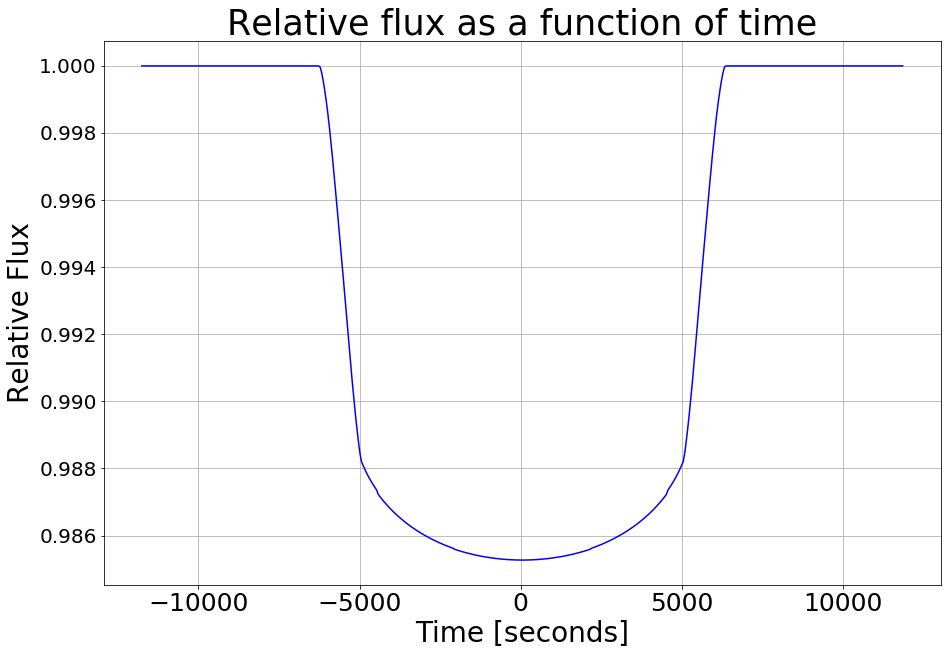

In [106]:
relative_flux = flux/normalisation_constant


''' Period of Orbit'''
P = 3.52472*24*60**2

''' Finding the velocity of the planet '''
n = 2*np.pi/P # mean motion 
v = np.sqrt((((n**2)*(a**2))/(1-e**2))*(1+2*e*np.cos(f)+e**2))
mean_v = np.sum(v)/len(v) # average velocity that is very similar to each velocity in the array of v
mean_v # in m/s

'''Finding time'''
distance = np.abs(max(X_3D)) + np.abs(min(X_3D))  
t = distance/mean_v 
t = t   # time in hours

'''Plotting the graph'''
factor = flux.index(min(flux))/theta_values  # factor to keep T=0 at the centre of the trough

fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(1, 1, 1)
ax = plt.plot(np.linspace(-np.round(t)*(factor),np.round(t)*(1-factor),theta_values), relative_flux, 'b')
plt.grid()
plt.title('Relative flux as a function of time', size=35)
plt.xlabel('Time [seconds]', size=28)
plt.xlim()
plt.xticks(fontsize=25)
plt.ylabel('Relative Flux', size=28)
plt.yticks(fontsize=20)
plt.show()

<div class="alert alert-block alert-info">
<b>Project info:</b> I helped fix ******'s code and also made some improvements so that it works. ******''s code had a problem where the spot intensity function gave imaginary values. I fixed this in a similar way to the limb darkening of the star by adding a where=() in the square root so that the square root wouldn't output imaginary numbers. I also removed all mention of i as nothing is being iterated over (as she used code from the planet), and changed the centre of the spot to the centre of the display. It still doesn't completely work though as the spot does not have intensity values as all of the values are just NAN for some reason.
</div>

### Improved code

/Users/mathew3/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in sqrt
  if sys.path[0] == '':


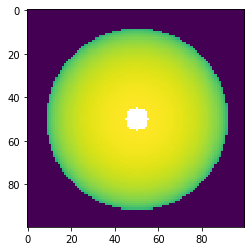

In [312]:
def intensity (x,y): # Draws the star with limb darkening 
    global r_star,centre_of_star
    r_squared= (x-centre_of_star[1])**2 + (y-centre_of_star[1])**2
    circle_mask = (x-centre_of_star[1])**2 + (y-centre_of_star[1])**2 <= r_star**2
    mu = np.sqrt(1 - r_squared/r_star**2,where=((x-centre_of_star[1])**2 + (y-centre_of_star[1])**2 <= r_star**2))
    
    return Intensity_max*(1-mu1*(1-mu)-mu2*(1 - mu)**2)*circle_mask

def intensity_spot (x,y):  #Draws the starspot with limb darkening
    global r_spot, centre_of_spot
    p = np.sqrt((x)**2+(y)**2)
    mu_2 = np.sqrt(1-(p)**2,where=((x-centre_of_spot[0])**2 + (y-centre_of_spot[1])**2 <= r_spot**2))
    return (1/np.pi)*((1-mu1*(1-mu_2)-mu2*(1 - mu_2)**2)/(1-(mu1/3)-(mu2/6)))

def draw_stage(background): # Adds together the starspot and star onto the same canvas
    global centre_of_spot, display_dim
    #centre_of_spot = [Y_coord_on_grid[i],Z_coord_on_grid[i]] You don't need this bit because you haven't go an i
    centre_of_spot = [50,50]
    
    display_added_spot = 1 * np.fromfunction(intensity_spot, (display_dim, display_dim), dtype=int)
   
    return display_added_spot * background

Intensity_max=100
radius_of_sun = 7e5 # Planet radius
radius_of_jupiter = 7e4 # Star radius
radius_of_spot = 6e3 # Starspot radius
SF = (radius_of_sun + 2*radius_of_jupiter) # Scaling display to fit star/planet
display_dim=100
centre_of_display = 50
mu1 = 0.3 # Variables for limb darkening 
mu2 = 0.1
r_spot = 5

centre_of_star = [centre_of_display,centre_of_display] # Centre of star
r_star = radius_of_sun/SF * display_dim/2 # Scaling star centre with respect to display

display_with_star = np.fromfunction(intensity,(display_dim, display_dim), dtype=int) # Drawing Star
#display_with_spot = draw_stage(i,background)

plt.imshow(draw_stage(display_with_star), interpolation='nearest')

The star spot still gives NaN values

In [313]:
np.sum(draw_stage(display_with_star))

/Users/mathew3/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in sqrt
  if sys.path[0] == '':


nan

## Version 1.8

In [6]:
%%time
# Times how long it takes for the program to run

import numpy as np
import matplotlib.pyplot as plt



###################################### Defining variables and constants
from scipy.constants import physical_constants as pc_dict

### For time of transit
G = pc_dict['Newtonian constant of gravitation'][0]
Ms = 2E+30   # approx mass of sun in kg
Mp = 1.9E+27  # approx mass of Jupiter in kg

### Theta numbers
theta_values = 500

### Physical dimensions
radius_of_sun = 7e8 # Planet radius m
radius_of_jupiter = 7e7 # Star radius m 
radius_of_ganymede = 5e6 # Moon radius m 



#### Stuff for orbit
a= 7.8e12 # Semi Major axis in m
e = 0.0489 # Eccentricity < 1 to work

theta = np.linspace(-0.4 *10e-4, 0.4*10e-4, num=theta_values) # Angular range where the planet crosses the star
phase = 0 
f = theta - phase 
r = a*(1 - e**2)/ (1 + e*np.cos(f)) # Distance between the star and the planet
i = 0
omega = np.pi/2
w = omega + phase

#### Stuff for Limb Darkening
mu1 = 0.3 # Variables for limb darkening 
mu2 = 0.1 # Variables for limb darkening 
Intensity_max = 100 # Max Intensity for limb darkening

### Stuff for Display
display_dim = 100 # Size of the 'display'

### Moon Stuff
moon_period = 216 # hours
moon_phase = 0

###################################### Equations of motion
X_3D = - r* np.cos(w +f) 
Y_3D = - r* np.sin(w +f)* np.cos(i)
Z_3D = r* np.sin(w +f)* np.sin(i)



def intensity (z,x): # Draws the star with limb darkening  
    global r_star,centre_of_star
    r_squared= (z-centre_of_star)**2 + (x - centre_of_star)**2
    circle_mask = (z-centre_of_star)**2 + (x - centre_of_star)**2 <= r_star**2
    
    mu = np.sqrt(1 - r_squared/r_star**2,where=((z-centre_of_star)**2 + (x-centre_of_star)**2 <= r_star**2))
    
    return Intensity_max*(1-mu1*(1-mu)-mu2*(1 - mu)**2)*circle_mask

def planet_writer(z,x): # Draws the planet at the given centre  
    global centre_of_planet,r_planet
    return (z-centre_of_planet[1])**2 + (x-centre_of_planet[0])**2 > (r_planet)**2


def draw_stage(i,background): # Adds together the planet and star onto the same canvas
    global centre_of_planet, display_dim
    centre_of_planet = [X_coord_on_grid[i],Z_coord_on_grid[i]]
    
    display_added_planet = 1 * np.fromfunction(planet_writer, (display_dim, display_dim), dtype=int)
   
    return display_added_planet * background

def moon_writer(z,x):
    global centre_of_moon,centre_of_planet,r_moon
    return (z-centre_of_planet[1]-centre_of_moon[1])**2 + (x-centre_of_planet[0]-centre_of_moon[0])**2 > r_moon**2

def planet_mask(x,y):
    global centre_of_planet,r_planet

    return (x-centre_of_planet[0])**2 + (y-centre_of_planet[1])**2 > r_planet**2
######################################## Time stuff
''' Period of Orbit'''
P = np.sqrt((4*np.pi**2)/(G*(Ms+Mp)) *(a/10)**(3)) # NB: a is divided by 10 because the true value of the Jupiter semi-major axis is 7.8E11, however using this value in the above code gives a low resolution graph.
''' Finding the velocity of the planet '''
n = 2*np.pi/P # mean motion 
v = np.sqrt((((n**2)*(a**2))/(1-e**2))*(1+2*e*np.cos(f)+e**2))
mean_v = np.sum(v)/len(v) # average velocity that is very similar to each velocity in the array of v
# in m/s

'''Finding time'''
distance = np.abs(max(X_3D)) + np.abs(min(X_3D))  
t = distance/mean_v 
t = t/60**2


###################################### Set up of display
display = np.zeros((display_dim, display_dim))
centre_of_display = display_dim/2

###################################### Planet
SF = (radius_of_sun + 2*radius_of_jupiter) # Scaling display to fit star/planet

X_coord_on_grid = np.round(X_3D/SF * centre_of_display + centre_of_display) # Scaling X with respect to display
Z_coord_on_grid = np.round(Z_3D/SF * centre_of_display + centre_of_display) # Scaling Z with respect to display

r_planet = radius_of_jupiter/SF *  display_dim/2 # Scaling planet radius with respect to display
###################################### Star 
centre_of_star = centre_of_display # Centre of star
r_star = radius_of_sun/SF * display_dim/2 # Scaling star centre with respect to display

display_with_star = np.fromfunction(intensity,(display_dim, display_dim), dtype=int) # Drawing Star

### Stuff for Flux graph
flux = []

###################################### Moon Stuff
time_cross = t # hours
fraction_of_orbit_in_transit = time_cross/moon_period

theta_moon = np.linspace(0 + moon_phase, 2*np.pi * fraction_of_orbit_in_transit , num=theta_values)
r_moon = radius_of_ganymede/SF *  display_dim/2



a_moon= 1e9 # Semi Major axis in m
e_moon = 0.0011 # Eccentricity < 1 to work

phase_moon = 0 
f_moon = theta - phase 
r_moon_orbit = a_moon*(1 - e_moon**2)/ (1 + e_moon*np.cos(f_moon)) # Distance between the star and the planet
i_moon = 0.204
omega_moon = np.pi/2
w_moon = omega_moon + phase_moon



X_3D = - r* np.cos(w +f) 
Y_3D = - r* np.sin(w +f)* np.cos(i)
Z_3D = r* np.sin(w +f)* np.sin(i)

X_3D_Moon = - r_moon_orbit* np.cos(w_moon + f_moon) 
Y_3D_Moon = - r_moon_orbit* np.sin(w_moon + f_moon)* np.cos(i_moon)
Z_3D_Moon = r_moon_orbit* np.sin(w_moon + f_moon)* np.sin(i_moon)

X_3D_Moon_on_grid = np.round(X_3D_Moon/SF * centre_of_display + centre_of_display) # Scaling X with respect to display
Z_3D_Moon_on_grid = np.round(Z_3D_Moon/SF * centre_of_display + centre_of_display) # Scaling Z with respect to display


Y_Less_Zero = Y_3D>0

for i in range(0,theta_values):
    
    star_planet = draw_stage(i,display_with_star)# Drawing the star/planet at each planet centre
    centre_of_moon = [X_3D_Moon_on_grid[i],Z_3D_Moon_on_grid[i]]
    planet_mask_canvas =1* np.fromfunction(planet_mask, (display_dim, display_dim), dtype=int)
    
    if Y_Less_Zero[i] == True:
        addmask=planet_mask_canvas
    else:
        addmask = 1
        
    moon_canvas =   1* np.fromfunction(moon_writer, (display_dim, display_dim), dtype=int)
    
    display = star_planet * moon_canvas*addmask 
    
    
    flux.append(np.sum(display))

##########################################################################################
normalisation_constant = flux[0]

CPU times: user 358 ms, sys: 20.7 ms, total: 378 ms
Wall time: 431 ms


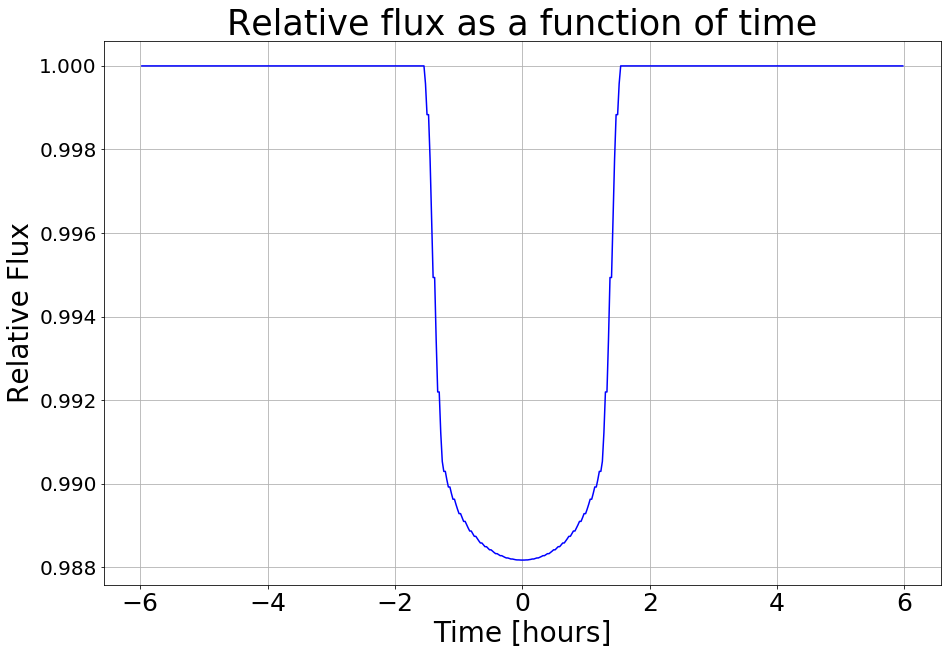

In [7]:
relative_flux = flux/normalisation_constant

'''Plotting the graph'''
factor = flux.index(min(flux))/theta_values  # factor to keep T=0 at the centre of the trough
fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(1, 1, 1)
ax = plt.plot(np.linspace(-np.round(t)*(factor),np.round(t)*(factor),theta_values), relative_flux, 'b')
plt.grid()
plt.title('Relative flux as a function of time', size=35)
plt.xlabel('Time [hours]', size=28)
plt.xticks(fontsize=25)
plt.ylabel('Relative Flux', size=28)
plt.yticks(fontsize=20)
plt.show()

## Things to do next week:

* Wavelength as a function for limb darkening 
* Planetry atmosphere effects

<a id="7"></a>
# 8/3/21 - Improved limb darkening
***
### Jump to date:
* [1/2/21 - Orbital Motion](#1)
* [8/2/21 - Limb darkening, Drawing the planet transiting in front of the star, Animation](#2)
* [Between Weeks - Optimisation and Bug fixing](#3)
* [15/2/21 - Spinning and Rotation](#4)
* [22/2/21 - Reading data and adding a moon](#5)
* [1/3/21 - Planet-Moon transit](#6)
* [8/3/21 - Improved limb darkening](#7)
* [15/3/21 - Planetry atmosphere](#8)

In [2]:
import numpy as np

### My aims for today are:

* To get better estimates for the limb darkening variables
* Look into the effects of planetry atmosphere

To familiarise myself with the library, I will try to understand the example from https://github.com/hpparvi/ldtk

In [4]:
%pylab inline
from IPython.display import display, Latex
import seaborn as sb
sb.set_context('notebook')
sb.set_style('ticks')

Populating the interactive namespace from numpy and matplotlib


In [5]:
from ldtk import LDPSetCreator, BoxcarFilter, TabulatedFilter
from ldtk.filters import sdss_g, sdss_r, sdss_i, sdss_z

In [6]:
sc = LDPSetCreator(teff=(5500,100), logg=(4.5,0.2), z=(0.25,0.05),
                   filters=[sdss_g, sdss_r, sdss_i, sdss_z], dataset='vis-lowres')

TypeError: __init__() got an unexpected keyword argument 'dataset'

After struggling to use the ldtk library, I decided just to use the limb darkening variables given to us in the paper the data is from. 

Using https://core.ac.uk/download/pdf/12816221.pdf equation 3:
$I(\mu) = 1 - \sum_{n=1}^{4} c_{n}(1-\mu^{n/2})$

and equation 4:

$\mu = cos \theta$ where theta is the angle between the surface normal and the observer



In [4]:
def intensity (z,x): # Draws the star with limb darkening  
    global r_star,centre_of_star
    r_squared= (z-centre_of_star)**2 + (x - centre_of_star)**2
    circle_mask = (z-centre_of_star)**2 + (x - centre_of_star)**2 <= r_star**2
    
    mu = np.sqrt(1 - r_squared/r_star**2,where=((z-centre_of_star)**2 + (x-centre_of_star)**2 <= r_star**2))
    
    return Intensity_max*(1-mu1*(1-mu)-mu2*(1 - mu)**2)*circle_mask

To find the normal vector we need the y value, then the dot product of the two vectors can be done to get the angle between them

Z^2 + X^2 + Y^2 = r_star^2

Y = sqrt(r_star^2 - (Z^2 + X^2)) Only want positive values since this is the side that can be seen

In [38]:
def Y_Value(Z,X):
    r_star = 40
    
    Y = np.sqrt(r_star**2 - ((Z-50)**2 + (X-50)**2), where=((Z-50)**2 + (X-50)**2 <= r_star**2) )
    return X,Y,Z
    
x,y,z =1* np.fromfunction(Y_Value, (100, 100), dtype=int)

In [43]:
x = np.reshape(x,-1)
y = np.reshape(y,-1)
z = np.reshape(z,-1)

print (y.shape)

(10000,)


## Displaying the sphere in 3d

[100. 100. 100. 100. 100. 100. 100. 100. 100. 100.]


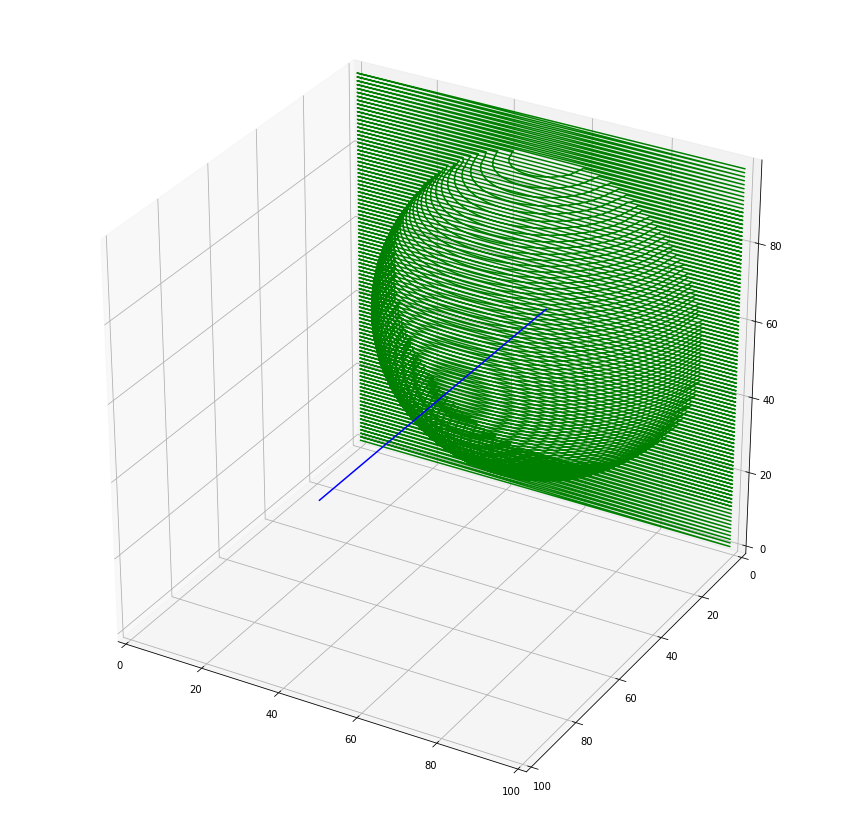

In [45]:
from mpl_toolkits import mplot3d 

fig = plt.figure(figsize=(15,15))
ax = plt.axes(projection ='3d') 
observer = np.linspace(100,0,10)
print (100*np.ones(10))


ax.plot3D(x,y,z,'green') 
ax.plot3D(50*np.ones(10),observer,50*np.ones(10),'blue') 
plt.xlim([0, 100])
plt.ylim([100, 0])
plt.show() 

Testing out the dot product function so that $\cos \theta$ can be found.

In [5]:
x = np.array([1,2])
mag = np.sqrt(x.dot(x))
print (mag)

2.23606797749979


In [6]:
hello = np.array([0,0,1])
print (hello)
mu = np.dot([0,1,0],hello)/np.sqrt(hello.dot(hello))
print (mu)

[0 0 1]
0.0


Using the dot product to find the stellar limb darkening.

In [181]:
def Y_Value(Z,X):
    r_star = 30
    
    Y=0
    Y = np.sqrt(r_star**2 - ((Z-50)**2 + (X-50)**2), where=((Z-50)**2 + (X-50)**2 <= r_star**2) )
    circle_mask = (Z-50)**2 + (X - 50)**2 <= r_star**2
    Y = circle_mask * Y
    return X,Y,Z
    

x,y,z=1* np.fromfunction(Y_Value, (100,100), dtype=int)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


To get the dot product at each point, the array of x,y,z coordinates need to be flattened into 1 dimensional arrays and iterated through.

In [182]:

x = np.reshape(x,-1)
y = np.reshape(y,-1)
z = np.reshape(z,-1)
coords = list(zip(x,y,z))

print (len(x))
i=0
trial_array = np.array([coords[i][0],coords[i][1],coords[i][2]])

templist = []

for i in range(len(x)):
    hello = np.array([coords[i][0] - 50,coords[i][1],coords[i][2]- 50])
    templist.append(np.dot([0,1,0],hello)/np.sqrt(hello.dot(hello)))
    
print(len(templist))
temp = np.array(templist)

temp_array2 = temp.reshape((100,100))



#print ([np.dot([0,1,0],np.array([coords[i][0],coords[i][1],coords[i][2]]))/np.sqrt(np.array([coords[i][0],coords[i][1],coords[i][2]]).dot(np.array([coords[i][0],coords[i][1],coords[i][2]])) for i in range(len(coords))])

10000
10000


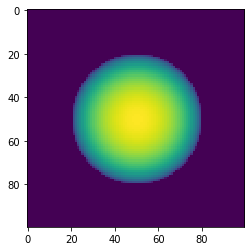

In [183]:
plt.imshow(temp_array2, interpolation='nearest')

In [159]:
hello1 = np.array([1,2,3,4])
hello2 = np.array([2,3,4,5])

print (list(zip(hello1,hello2)))

[(1, 2), (2, 3), (3, 4), (4, 5)]


https://blog.finxter.com/how-to-merge-lists-into-a-list-of-tuples/
https://stackoverflow.com/questions/9171158/how-do-you-get-the-magnitude-of-a-vector-in-numpy
https://numpy.org/doc/stable/reference/generated/numpy.dot.html
https://thispointer.com/delete-elements-from-a-numpy-array-by-value-or-conditions-in-python/

In [160]:
[x for x in range(3)] 

[0, 1, 2]

Testing the limb darkening with 4 limb darkening variables.

In [161]:
c1 = -0.1015
c2 = 0.5547
c3 = 0.6096
c4 = -0.2814

limb_darkening = 1 - (c1*(1-np.power(temp_array2, 0.5)) + (c2*(1-temp_array2)) + (c3*(1-np.power(temp_array2, 1.5))) + (c4*(1-np.power(temp_array2, 2))))

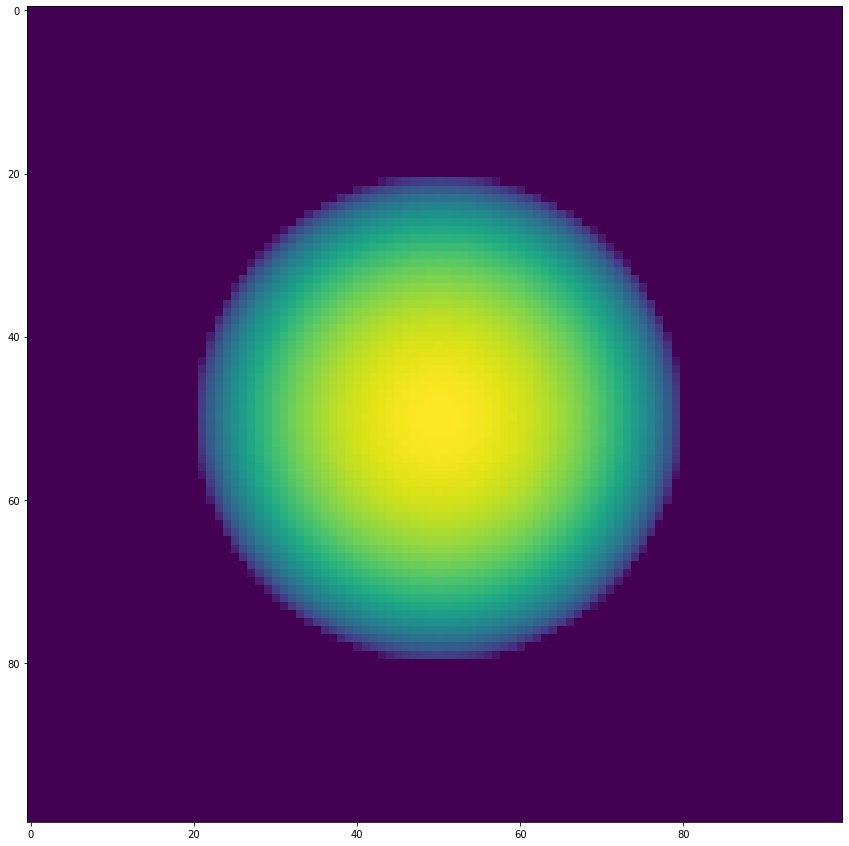

In [162]:

fig = plt.figure(figsize=(15,15))
plt.imshow(limb_darkening, interpolation='nearest')

To test the difference between the old limb darkening function and the new one, I modified the old function to accomodate 4 variables and subtracted one model from the other to see the difference. 

In [177]:
centre_of_star = 50
r_star = 30
def intensity (z,x): # Draws the star with limb darkening  
    global r_star,centre_of_star
    r_squared= (z-centre_of_star)**2 + (x - centre_of_star)**2
    circle_mask = (z-centre_of_star)**2 + (x - centre_of_star)**2 <= r_star**2
    
    mu = np.sqrt(1 - r_squared/r_star**2,where=((z-centre_of_star)**2 + (x-centre_of_star)**2 <= r_star**2))
    
    return circle_mask*(1 - (c1*(1-np.power(mu, 0.5)) + (c2*(1-mu)) + (c3*(1-np.power(mu, 1.5))) + (c4*(1-np.power(mu, 2)))))




In [178]:
old_one =1* np.fromfunction(intensity, (100,100), dtype=int)

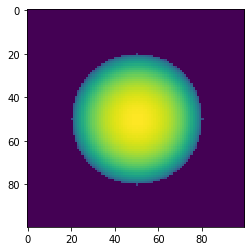

In [179]:
plt.imshow(old_one, interpolation='nearest')

In [186]:
def planet_mask(x,y):
    r=30
    return (x-50)**2 + (y-50)**2 <= 30**2
mask =1* np.fromfunction(planet_mask, (100,100), dtype=int)

The resulting difference in limb darkening.

0.0
-2.220446049250313e-15
2.220446049250313e-16


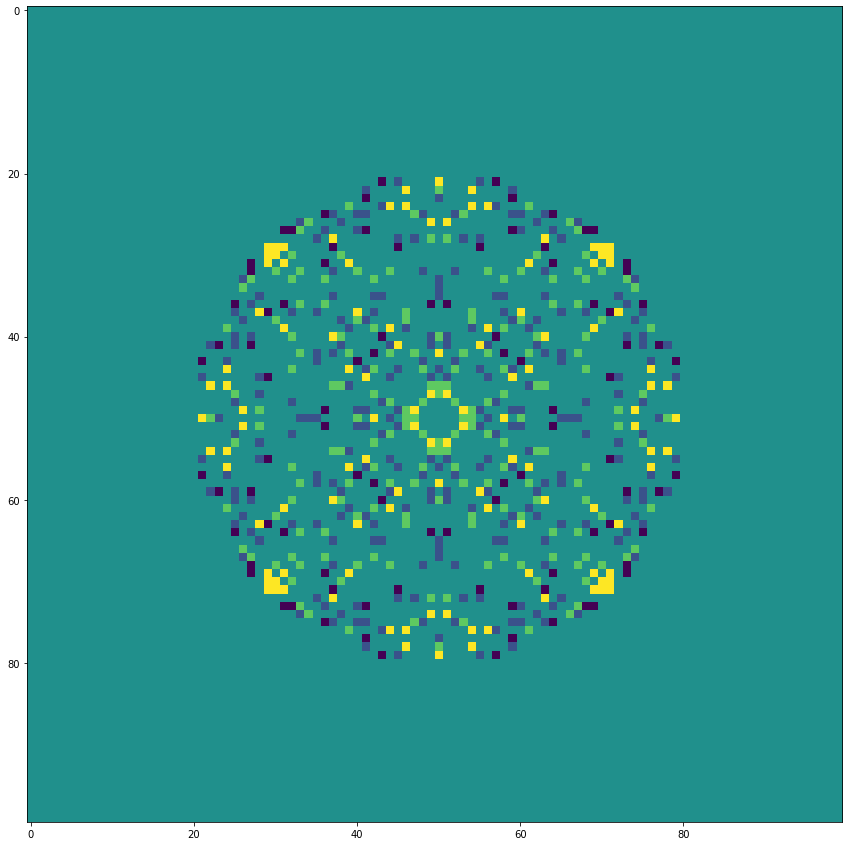

In [196]:
limb_darkening = limb_darkening*mask
fig = plt.figure(figsize=(15,15))

difference = old_one - limb_darkening
plt.imshow(difference, interpolation='nearest')

print (difference[0][0])

print (np.sum(difference))
print (difference.max())

Creating a list of the different limb darkening variables at different wavelengths. Variables from Using Stellar Limb-Darkening to Refine the Properties of HD 209458b   

In [276]:
c1 = [-0.1015,0.0284,0.2022,0.3765,0.4957,0.5566,0.6239,0.6495,0.6623,0.6535]
c2 = [0.5547,0.4248,0.1101,-0.0119,-0.2057,-0.2972,-0.4176,-0.4916,-0.5338,-0.5323]
c3 = [0.6096,0.6646,0.9690,0.8863,0.9157,0.9190,0.8889,0.8722,0.8411,0.8142]
c4 = [-0.2814,-0.3450,-0.4801,-0.4504,-0.4340,-0.4288,-0.4026,-0.3844,-0.3661,-0.3566]

p = 7

c1 = c1[p]
c2 = c2[p]
c3 = c3[p]
c4 = c4[p]

10000
[-50.   0. -50.]
[-49.   0. -50.]
[-48.   0. -50.]
[-47.   0. -50.]
[-46.   0. -50.]
[-45.   0. -50.]
[-44.   0. -50.]
[-43.   0. -50.]
[-42.   0. -50.]
[-41.   0. -50.]
[-40.   0. -50.]
[-39.   0. -50.]
[-38.   0. -50.]
[-37.   0. -50.]
[-36.   0. -50.]
[-35.   0. -50.]
[-34.   0. -50.]
[-33.   0. -50.]
[-32.   0. -50.]
[-31.   0. -50.]
[-30.   0. -50.]
[-29.   0. -50.]
[-28.   0. -50.]
[-27.   0. -50.]
[-26.   0. -50.]
[-25.   0. -50.]
[-24.   0. -50.]
[-23.   0. -50.]
[-22.   0. -50.]
[-21.   0. -50.]
[-20.   0. -50.]
[-19.   0. -50.]
[-18.   0. -50.]
[-17.   0. -50.]
[-16.   0. -50.]
[-15.   0. -50.]
[-14.   0. -50.]
[-13.   0. -50.]
[-12.   0. -50.]
[-11.   0. -50.]
[-10.   0. -50.]
[ -9.   0. -50.]
[ -8.   0. -50.]
[ -7.   0. -50.]
[ -6.   0. -50.]
[ -5.   0. -50.]
[ -4.   0. -50.]
[ -3.   0. -50.]
[ -2.   0. -50.]
[ -1.   0. -50.]
[  0.   0. -50.]
[  1.   0. -50.]
[  2.   0. -50.]
[  3.   0. -50.]
[  4.   0. -50.]
[  5.   0. -50.]
[  6.   0. -50.]
[  7.   0. -50.]
[  8.   

[ 11.   0. -45.]
[ 12.   0. -45.]
[ 13.   0. -45.]
[ 14.   0. -45.]
[ 15.   0. -45.]
[ 16.   0. -45.]
[ 17.   0. -45.]
[ 18.   0. -45.]
[ 19.   0. -45.]
[ 20.   0. -45.]
[ 21.   0. -45.]
[ 22.   0. -45.]
[ 23.   0. -45.]
[ 24.   0. -45.]
[ 25.   0. -45.]
[ 26.   0. -45.]
[ 27.   0. -45.]
[ 28.   0. -45.]
[ 29.   0. -45.]
[ 30.   0. -45.]
[ 31.   0. -45.]
[ 32.   0. -45.]
[ 33.   0. -45.]
[ 34.   0. -45.]
[ 35.   0. -45.]
[ 36.   0. -45.]
[ 37.   0. -45.]
[ 38.   0. -45.]
[ 39.   0. -45.]
[ 40.   0. -45.]
[ 41.   0. -45.]
[ 42.   0. -45.]
[ 43.   0. -45.]
[ 44.   0. -45.]
[ 45.   0. -45.]
[ 46.   0. -45.]
[ 47.   0. -45.]
[ 48.   0. -45.]
[ 49.   0. -45.]
[-50.   0. -44.]
[-49.   0. -44.]
[-48.   0. -44.]
[-47.   0. -44.]
[-46.   0. -44.]
[-45.   0. -44.]
[-44.   0. -44.]
[-43.   0. -44.]
[-42.   0. -44.]
[-41.   0. -44.]
[-40.   0. -44.]
[-39.   0. -44.]
[-38.   0. -44.]
[-37.   0. -44.]
[-36.   0. -44.]
[-35.   0. -44.]
[-34.   0. -44.]
[-33.   0. -44.]
[-32.   0. -44.]
[-31.   0. -44

[-50.   0. -38.]
[-49.   0. -38.]
[-48.   0. -38.]
[-47.   0. -38.]
[-46.   0. -38.]
[-45.   0. -38.]
[-44.   0. -38.]
[-43.   0. -38.]
[-42.   0. -38.]
[-41.   0. -38.]
[-40.   0. -38.]
[-39.   0. -38.]
[-38.   0. -38.]
[-37.   0. -38.]
[-36.   0. -38.]
[-35.   0. -38.]
[-34.   0. -38.]
[-33.   0. -38.]
[-32.   0. -38.]
[-31.   0. -38.]
[-30.   0. -38.]
[-29.   0. -38.]
[-28.   0. -38.]
[-27.   0. -38.]
[-26.   0. -38.]
[-25.   0. -38.]
[-24.   0. -38.]
[-23.   0. -38.]
[-22.   0. -38.]
[-21.   0. -38.]
[-20.   0. -38.]
[-19.   0. -38.]
[-18.   0. -38.]
[-17.   0. -38.]
[-16.   0. -38.]
[-15.   0. -38.]
[-14.   0. -38.]
[-13.   0. -38.]
[-12.   0. -38.]
[-11.   0. -38.]
[-10.   0. -38.]
[ -9.   0. -38.]
[ -8.   0. -38.]
[ -7.   0. -38.]
[ -6.   0. -38.]
[ -5.   0. -38.]
[ -4.   0. -38.]
[ -3.   0. -38.]
[ -2.   0. -38.]
[ -1.   0. -38.]
[  0.   0. -38.]
[  1.   0. -38.]
[  2.   0. -38.]
[  3.   0. -38.]
[  4.   0. -38.]
[  5.   0. -38.]
[  6.   0. -38.]
[  7.   0. -38.]
[  8.   0. -38

[-24.   0. -32.]
[-23.   0. -32.]
[-22.   0. -32.]
[-21.   0. -32.]
[-20.   0. -32.]
[-19.   0. -32.]
[-18.   0. -32.]
[-17.   0. -32.]
[-16.   0. -32.]
[-15.   0. -32.]
[-14.   0. -32.]
[-13.   0. -32.]
[-12.   0. -32.]
[-11.   0. -32.]
[-10.   0. -32.]
[ -9.   0. -32.]
[ -8.   0. -32.]
[ -7.   0. -32.]
[ -6.   0. -32.]
[ -5.   0. -32.]
[ -4.   0. -32.]
[ -3.   0. -32.]
[ -2.   0. -32.]
[ -1.   0. -32.]
[  0.   0. -32.]
[  1.   0. -32.]
[  2.   0. -32.]
[  3.   0. -32.]
[  4.   0. -32.]
[  5.   0. -32.]
[  6.   0. -32.]
[  7.   0. -32.]
[  8.   0. -32.]
[  9.   0. -32.]
[ 10.   0. -32.]
[ 11.   0. -32.]
[ 12.   0. -32.]
[ 13.   0. -32.]
[ 14.   0. -32.]
[ 15.   0. -32.]
[ 16.   0. -32.]
[ 17.   0. -32.]
[ 18.   0. -32.]
[ 19.   0. -32.]
[ 20.   0. -32.]
[ 21.   0. -32.]
[ 22.   0. -32.]
[ 23.   0. -32.]
[ 24.   0. -32.]
[ 25.   0. -32.]
[ 26.   0. -32.]
[ 27.   0. -32.]
[ 28.   0. -32.]
[ 29.   0. -32.]
[ 30.   0. -32.]
[ 31.   0. -32.]
[ 32.   0. -32.]
[ 33.   0. -32.]
[ 34.   0. -32

[ 32.   0. -26.]
[ 33.   0. -26.]
[ 34.   0. -26.]
[ 35.   0. -26.]
[ 36.   0. -26.]
[ 37.   0. -26.]
[ 38.   0. -26.]
[ 39.   0. -26.]
[ 40.   0. -26.]
[ 41.   0. -26.]
[ 42.   0. -26.]
[ 43.   0. -26.]
[ 44.   0. -26.]
[ 45.   0. -26.]
[ 46.   0. -26.]
[ 47.   0. -26.]
[ 48.   0. -26.]
[ 49.   0. -26.]
[-50.   0. -25.]
[-49.   0. -25.]
[-48.   0. -25.]
[-47.   0. -25.]
[-46.   0. -25.]
[-45.   0. -25.]
[-44.   0. -25.]
[-43.   0. -25.]
[-42.   0. -25.]
[-41.   0. -25.]
[-40.   0. -25.]
[-39.   0. -25.]
[-38.   0. -25.]
[-37.   0. -25.]
[-36.   0. -25.]
[-35.   0. -25.]
[-34.   0. -25.]
[-33.   0. -25.]
[-32.   0. -25.]
[-31.   0. -25.]
[-30.   0. -25.]
[-29.   0. -25.]
[-28.   0. -25.]
[-27.   0. -25.]
[-26.   0. -25.]
[-25.   0. -25.]
[-24.   0. -25.]
[-23.   0. -25.]
[-22.   0. -25.]
[-21.   0. -25.]
[-20.   0. -25.]
[-19.   0. -25.]
[-18.   0. -25.]
[-17.   0. -25.]
[-16.           4.35889894 -25.        ]
[-15.           7.07106781 -25.        ]
[-14.           8.88819442 -25.   

[-22.   0. -22.]
[-21.   0. -22.]
[-20.   4. -22.]
[-19.           7.41619849 -22.        ]
[-18.           9.59166305 -22.        ]
[-17.          11.26942767 -22.        ]
[-16.          12.64911064 -22.        ]
[-15.          13.82027496 -22.        ]
[-14.          14.83239697 -22.        ]
[-13.          15.71623365 -22.        ]
[-12.         16.4924225 -22.       ]
[-11.          17.17556404 -22.        ]
[-10.          17.77638883 -22.        ]
[ -9.          18.30300522 -22.        ]
[ -8.          18.76166304 -22.        ]
[ -7.          19.15724406 -22.        ]
[ -6.          19.49358869 -22.        ]
[ -5.          19.77371993 -22.        ]
[ -4.  20. -22.]
[ -3.        20.174241 -22.      ]
[ -2.          20.29778313 -22.        ]
[ -1.          20.37154879 -22.        ]
[  0.          20.39607805 -22.        ]
[  1.          20.37154879 -22.        ]
[  2.          20.29778313 -22.        ]
[  3.        20.174241 -22.      ]
[  4.  20. -22.]
[  5.          19.77371993 -

[ -5.          24.87971061 -16.        ]
[ -4.          25.05992817 -16.        ]
[ -3.          25.19920634 -16.        ]
[ -2.          25.29822128 -16.        ]
[ -1.          25.35744467 -16.        ]
[  0.          25.37715508 -16.        ]
[  1.          25.35744467 -16.        ]
[  2.          25.29822128 -16.        ]
[  3.          25.19920634 -16.        ]
[  4.          25.05992817 -16.        ]
[  5.          24.87971061 -16.        ]
[  6.          24.65765601 -16.        ]
[  7.          24.39262184 -16.        ]
[  8.          24.08318916 -16.        ]
[  9.          23.72762104 -16.        ]
[ 10.          23.32380758 -16.        ]
[ 11.          22.86919325 -16.        ]
[ 12.          22.36067977 -16.        ]
[ 13.          21.79449472 -16.        ]
[ 14.          21.16601049 -16.        ]
[ 15.          20.46948949 -16.        ]
[ 16.         19.6977156 -16.       ]
[ 17.          18.84144368 -16.        ]
[ 18.          17.88854382 -16.        ]
[ 19.          16.8

[ 27.           1.41421356 -13.        ]
[ 28.   0. -13.]
[ 29.   0. -13.]
[ 30.   0. -13.]
[ 31.   0. -13.]
[ 32.   0. -13.]
[ 33.   0. -13.]
[ 34.   0. -13.]
[ 35.   0. -13.]
[ 36.   0. -13.]
[ 37.   0. -13.]
[ 38.   0. -13.]
[ 39.   0. -13.]
[ 40.   0. -13.]
[ 41.   0. -13.]
[ 42.   0. -13.]
[ 43.   0. -13.]
[ 44.   0. -13.]
[ 45.   0. -13.]
[ 46.   0. -13.]
[ 47.   0. -13.]
[ 48.   0. -13.]
[ 49.   0. -13.]
[-50.   0. -12.]
[-49.   0. -12.]
[-48.   0. -12.]
[-47.   0. -12.]
[-46.   0. -12.]
[-45.   0. -12.]
[-44.   0. -12.]
[-43.   0. -12.]
[-42.   0. -12.]
[-41.   0. -12.]
[-40.   0. -12.]
[-39.   0. -12.]
[-38.   0. -12.]
[-37.   0. -12.]
[-36.   0. -12.]
[-35.   0. -12.]
[-34.   0. -12.]
[-33.   0. -12.]
[-32.   0. -12.]
[-31.   0. -12.]
[-30.   0. -12.]
[-29.   0. -12.]
[-28.   0. -12.]
[-27.           5.19615242 -12.        ]
[-26.           8.94427191 -12.        ]
[-25.          11.44552314 -12.        ]
[-24.          13.41640786 -12.        ]
[-23.          15.06651917 -12

[-21.         19.4422221  -9.       ]
[-20.          20.46948949  -9.        ]
[-19.          21.40093456  -9.        ]
[-18.          22.24859546  -9.        ]
[-17.          23.02172887  -9.        ]
[-16.          23.72762104  -9.        ]
[-15.          24.37211521  -9.        ]
[-14.          24.95996795  -9.        ]
[-13.          25.49509757  -9.        ]
[-12.          25.98076211  -9.        ]
[-11.          26.41968963  -9.        ]
[-10.          26.81417536  -9.        ]
[-9.         27.16615541 -9.        ]
[-8.         27.47726333 -9.        ]
[-7.         27.74887385 -9.        ]
[-6.         27.98213716 -9.        ]
[-5.         28.17800561 -9.        ]
[-4.         28.33725463 -9.        ]
[-3.         28.46049894 -9.        ]
[-2.         28.54820485 -9.        ]
[-1.         28.60069929 -9.        ]
[ 0.         28.61817604 -9.        ]
[ 1.         28.60069929 -9.        ]
[ 2.         28.54820485 -9.        ]
[ 3.         28.46049894 -9.        ]
[ 4.         28.3

[26.        13.7113092 -6.       ]
[27.         11.61895004 -6.        ]
[28.          8.94427191 -6.        ]
[29.          4.79583152 -6.        ]
[30.  0. -6.]
[31.  0. -6.]
[32.  0. -6.]
[33.  0. -6.]
[34.  0. -6.]
[35.  0. -6.]
[36.  0. -6.]
[37.  0. -6.]
[38.  0. -6.]
[39.  0. -6.]
[40.  0. -6.]
[41.  0. -6.]
[42.  0. -6.]
[43.  0. -6.]
[44.  0. -6.]
[45.  0. -6.]
[46.  0. -6.]
[47.  0. -6.]
[48.  0. -6.]
[49.  0. -6.]
[-50.   0.  -5.]
[-49.   0.  -5.]
[-48.   0.  -5.]
[-47.   0.  -5.]
[-46.   0.  -5.]
[-45.   0.  -5.]
[-44.   0.  -5.]
[-43.   0.  -5.]
[-42.   0.  -5.]
[-41.   0.  -5.]
[-40.   0.  -5.]
[-39.   0.  -5.]
[-38.   0.  -5.]
[-37.   0.  -5.]
[-36.   0.  -5.]
[-35.   0.  -5.]
[-34.   0.  -5.]
[-33.   0.  -5.]
[-32.   0.  -5.]
[-31.   0.  -5.]
[-30.   0.  -5.]
[-29.           5.83095189  -5.        ]
[-28.           9.53939201  -5.        ]
[-27.          12.08304597  -5.        ]
[-26.          14.10673598  -5.        ]
[-25.         15.8113883  -5.       ]
[-24.       

[-15.          25.90366769  -2.        ]
[-14.          26.45751311  -2.        ]
[-13.          26.96293753  -2.        ]
[-12.         27.4226184  -2.       ]
[-11.          27.83882181  -2.        ]
[-10.          28.21347196  -2.        ]
[-9.         28.54820485 -2.        ]
[-8.        28.8444102 -2.       ]
[-7.         29.10326442 -2.        ]
[-6.        29.3257566 -2.       ]
[-5.         29.51270913 -2.        ]
[-4.         29.66479395 -2.        ]
[-3.         29.78254522 -2.        ]
[-2.         29.86636905 -2.        ]
[-1.        29.9165506 -2.       ]
[ 0.         29.93325909 -2.        ]
[ 1.        29.9165506 -2.       ]
[ 2.         29.86636905 -2.        ]
[ 3.         29.78254522 -2.        ]
[ 4.         29.66479395 -2.        ]
[ 5.         29.51270913 -2.        ]
[ 6.        29.3257566 -2.       ]
[ 7.         29.10326442 -2.        ]
[ 8.        28.8444102 -2.       ]
[ 9.         28.54820485 -2.        ]
[10.         28.21347196 -2.        ]
[11.         27

[44.  0.  1.]
[45.  0.  1.]
[46.  0.  1.]
[47.  0.  1.]
[48.  0.  1.]
[49.  0.  1.]
[-50.   0.   2.]
[-49.   0.   2.]
[-48.   0.   2.]
[-47.   0.   2.]
[-46.   0.   2.]
[-45.   0.   2.]
[-44.   0.   2.]
[-43.   0.   2.]
[-42.   0.   2.]
[-41.   0.   2.]
[-40.   0.   2.]
[-39.   0.   2.]
[-38.   0.   2.]
[-37.   0.   2.]
[-36.   0.   2.]
[-35.   0.   2.]
[-34.   0.   2.]
[-33.   0.   2.]
[-32.   0.   2.]
[-31.   0.   2.]
[-30.   0.   2.]
[-29.           7.41619849   2.        ]
[-28.          10.58300524   2.        ]
[-27.          12.92284798   2.        ]
[-26.          14.83239697   2.        ]
[-25.          16.46207763   2.        ]
[-24.          17.88854382   2.        ]
[-23.          19.15724406   2.        ]
[-22.          20.29778313   2.        ]
[-21.          21.33072901   2.        ]
[-20.          22.27105745   2.        ]
[-19.          23.13006701   2.        ]
[-18.          23.91652149   2.        ]
[-17.          24.63736999   2.        ]
[-16.          25.29822128

[ 1.       29.563491  5.      ]
[ 2.         29.51270913  5.        ]
[ 3.         29.42787794  5.        ]
[ 4.         29.30870178  5.        ]
[ 5.         29.15475947  5.        ]
[ 6.         28.96549672  5.        ]
[ 7.         28.74021573  5.        ]
[ 8.         28.47806173  5.        ]
[ 9.         28.17800561  5.        ]
[10.         27.83882181  5.        ]
[11.         27.45906044  5.        ]
[12.         27.03701167  5.        ]
[13.         26.57066051  5.        ]
[14.         26.05762844  5.        ]
[15.         25.49509757  5.        ]
[16.         24.87971061  5.        ]
[17.         24.20743687  5.        ]
[18.         23.47338919  5.        ]
[19.        22.6715681  5.       ]
[20.         21.79449472  5.        ]
[21.         20.83266666  5.        ]
[22.         19.77371993  5.        ]
[23.         18.60107524  5.        ]
[24.         17.29161647  5.        ]
[25.        15.8113883  5.       ]
[26.         14.10673598  5.        ]
[27.         12.08304597

[-36.   0.   9.]
[-35.   0.   9.]
[-34.   0.   9.]
[-33.   0.   9.]
[-32.   0.   9.]
[-31.   0.   9.]
[-30.   0.   9.]
[-29.   0.   9.]
[-28.           5.91607978   9.        ]
[-27.           9.48683298   9.        ]
[-26.          11.95826074   9.        ]
[-25.          13.92838828   9.        ]
[-24.          15.58845727   9.        ]
[-23.          17.02938637   9.        ]
[-22.          18.30300522   9.        ]
[-21.         19.4422221   9.       ]
[-20.          20.46948949   9.        ]
[-19.          21.40093456   9.        ]
[-18.          22.24859546   9.        ]
[-17.          23.02172887   9.        ]
[-16.          23.72762104   9.        ]
[-15.          24.37211521   9.        ]
[-14.          24.95996795   9.        ]
[-13.          25.49509757   9.        ]
[-12.          25.98076211   9.        ]
[-11.          26.41968963   9.        ]
[-10.          26.81417536   9.        ]
[-9.         27.16615541  9.        ]
[-8.         27.47726333  9.        ]
[-7.        

[-3.         27.33130074 12.        ]
[-2.        27.4226184 12.       ]
[-1.         27.47726333 12.        ]
[ 0.         27.49545417 12.        ]
[ 1.         27.47726333 12.        ]
[ 2.        27.4226184 12.       ]
[ 3.         27.33130074 12.        ]
[ 4.         27.20294102 12.        ]
[ 5.         27.03701167 12.        ]
[ 6.         26.83281573 12.        ]
[ 7.        26.5894716 12.       ]
[ 8.         26.30589288 12.        ]
[ 9.         25.98076211 12.        ]
[10.         25.61249695 12.        ]
[11.         25.19920634 12.        ]
[12.         24.73863375 12.        ]
[13.         24.22808288 12.        ]
[14.         23.66431913 12.        ]
[15.         23.04343724 12.        ]
[16.         22.36067977 12.        ]
[17.         21.61018278 12.        ]
[18.         20.78460969 12.        ]
[19.         19.87460691 12.        ]
[20.         18.86796226 12.        ]
[21.         17.74823935 12.        ]
[22.        16.4924225 12.       ]
[23.         15.06651917

[ 9.         24.37211521 15.        ]
[10.         23.97915762 15.        ]
[11.         23.53720459 15.        ]
[12.         23.04343724 15.        ]
[13.         22.49444376 15.        ]
[14.         21.88606863 15.        ]
[15.         21.21320344 15.        ]
[16.         20.46948949 15.        ]
[17.        19.6468827 15.       ]
[18.       18.734994 15.      ]
[19.         17.72004515 15.        ]
[20.         16.58312395 15.        ]
[21.         15.29705854 15.        ]
[22.         13.82027496 15.        ]
[23.         12.08304597 15.        ]
[24.          9.94987437 15.        ]
[25.          7.07106781 15.        ]
[26.  0. 15.]
[27.  0. 15.]
[28.  0. 15.]
[29.  0. 15.]
[30.  0. 15.]
[31.  0. 15.]
[32.  0. 15.]
[33.  0. 15.]
[34.  0. 15.]
[35.  0. 15.]
[36.  0. 15.]
[37.  0. 15.]
[38.  0. 15.]
[39.  0. 15.]
[40.  0. 15.]
[41.  0. 15.]
[42.  0. 15.]
[43.  0. 15.]
[44.  0. 15.]
[45.  0. 15.]
[46.  0. 15.]
[47.  0. 15.]
[48.  0. 15.]
[49.  0. 15.]
[-50.   0.  16.]
[-49.   0.

[-39.   0.  19.]
[-38.   0.  19.]
[-37.   0.  19.]
[-36.   0.  19.]
[-35.   0.  19.]
[-34.   0.  19.]
[-33.   0.  19.]
[-32.   0.  19.]
[-31.   0.  19.]
[-30.   0.  19.]
[-29.   0.  19.]
[-28.   0.  19.]
[-27.   0.  19.]
[-26.   0.  19.]
[-25.   0.  19.]
[-24.   0.  19.]
[-23.           3.16227766  19.        ]
[-22.           7.41619849  19.        ]
[-21.           9.89949494  19.        ]
[-20.          11.78982612  19.        ]
[-19.          13.34166406  19.        ]
[-18.         14.6628783  19.       ]
[-17.         15.8113883  19.       ]
[-16.          16.82260384  19.        ]
[-15.          17.72004515  19.        ]
[-14.          18.52025918  19.        ]
[-13.          19.23538406  19.        ]
[-12.          19.87460691  19.        ]
[-11.         20.4450483  19.       ]
[-10.          20.95232684  19.        ]
[-9.         21.40093456 19.        ]
[-8.         21.79449472 19.        ]
[-7.         22.13594362 19.        ]
[-6.         22.42766149 19.        ]
[-5.       

[12.         11.44552314 25.        ]
[13.         10.29563014 25.        ]
[14.          8.88819442 25.        ]
[15.          7.07106781 25.        ]
[16.          4.35889894 25.        ]
[17.  0. 25.]
[18.  0. 25.]
[19.  0. 25.]
[20.  0. 25.]
[21.  0. 25.]
[22.  0. 25.]
[23.  0. 25.]
[24.  0. 25.]
[25.  0. 25.]
[26.  0. 25.]
[27.  0. 25.]
[28.  0. 25.]
[29.  0. 25.]
[30.  0. 25.]
[31.  0. 25.]
[32.  0. 25.]
[33.  0. 25.]
[34.  0. 25.]
[35.  0. 25.]
[36.  0. 25.]
[37.  0. 25.]
[38.  0. 25.]
[39.  0. 25.]
[40.  0. 25.]
[41.  0. 25.]
[42.  0. 25.]
[43.  0. 25.]
[44.  0. 25.]
[45.  0. 25.]
[46.  0. 25.]
[47.  0. 25.]
[48.  0. 25.]
[49.  0. 25.]
[-50.   0.  26.]
[-49.   0.  26.]
[-48.   0.  26.]
[-47.   0.  26.]
[-46.   0.  26.]
[-45.   0.  26.]
[-44.   0.  26.]
[-43.   0.  26.]
[-42.   0.  26.]
[-41.   0.  26.]
[-40.   0.  26.]
[-39.   0.  26.]
[-38.   0.  26.]
[-37.   0.  26.]
[-36.   0.  26.]
[-35.   0.  26.]
[-34.   0.  26.]
[-33.   0.  26.]
[-32.   0.  26.]
[-31.   0.  26.]
[-30.   

[27.  0. 32.]
[28.  0. 32.]
[29.  0. 32.]
[30.  0. 32.]
[31.  0. 32.]
[32.  0. 32.]
[33.  0. 32.]
[34.  0. 32.]
[35.  0. 32.]
[36.  0. 32.]
[37.  0. 32.]
[38.  0. 32.]
[39.  0. 32.]
[40.  0. 32.]
[41.  0. 32.]
[42.  0. 32.]
[43.  0. 32.]
[44.  0. 32.]
[45.  0. 32.]
[46.  0. 32.]
[47.  0. 32.]
[48.  0. 32.]
[49.  0. 32.]
[-50.   0.  33.]
[-49.   0.  33.]
[-48.   0.  33.]
[-47.   0.  33.]
[-46.   0.  33.]
[-45.   0.  33.]
[-44.   0.  33.]
[-43.   0.  33.]
[-42.   0.  33.]
[-41.   0.  33.]
[-40.   0.  33.]
[-39.   0.  33.]
[-38.   0.  33.]
[-37.   0.  33.]
[-36.   0.  33.]
[-35.   0.  33.]
[-34.   0.  33.]
[-33.   0.  33.]
[-32.   0.  33.]
[-31.   0.  33.]
[-30.   0.  33.]
[-29.   0.  33.]
[-28.   0.  33.]
[-27.   0.  33.]
[-26.   0.  33.]
[-25.   0.  33.]
[-24.   0.  33.]
[-23.   0.  33.]
[-22.   0.  33.]
[-21.   0.  33.]
[-20.   0.  33.]
[-19.   0.  33.]
[-18.   0.  33.]
[-17.   0.  33.]
[-16.   0.  33.]
[-15.   0.  33.]
[-14.   0.  33.]
[-13.   0.  33.]
[-12.   0.  33.]
[-11.   0.  33.

[34.  0. 39.]
[35.  0. 39.]
[36.  0. 39.]
[37.  0. 39.]
[38.  0. 39.]
[39.  0. 39.]
[40.  0. 39.]
[41.  0. 39.]
[42.  0. 39.]
[43.  0. 39.]
[44.  0. 39.]
[45.  0. 39.]
[46.  0. 39.]
[47.  0. 39.]
[48.  0. 39.]
[49.  0. 39.]
[-50.   0.  40.]
[-49.   0.  40.]
[-48.   0.  40.]
[-47.   0.  40.]
[-46.   0.  40.]
[-45.   0.  40.]
[-44.   0.  40.]
[-43.   0.  40.]
[-42.   0.  40.]
[-41.   0.  40.]
[-40.   0.  40.]
[-39.   0.  40.]
[-38.   0.  40.]
[-37.   0.  40.]
[-36.   0.  40.]
[-35.   0.  40.]
[-34.   0.  40.]
[-33.   0.  40.]
[-32.   0.  40.]
[-31.   0.  40.]
[-30.   0.  40.]
[-29.   0.  40.]
[-28.   0.  40.]
[-27.   0.  40.]
[-26.   0.  40.]
[-25.   0.  40.]
[-24.   0.  40.]
[-23.   0.  40.]
[-22.   0.  40.]
[-21.   0.  40.]
[-20.   0.  40.]
[-19.   0.  40.]
[-18.   0.  40.]
[-17.   0.  40.]
[-16.   0.  40.]
[-15.   0.  40.]
[-14.   0.  40.]
[-13.   0.  40.]
[-12.   0.  40.]
[-11.   0.  40.]
[-10.   0.  40.]
[-9.  0. 40.]
[-8.  0. 40.]
[-7.  0. 40.]
[-6.  0. 40.]
[-5.  0. 40.]
[-4.  0. 

[-3.  0. 46.]
[-2.  0. 46.]
[-1.  0. 46.]
[ 0.  0. 46.]
[ 1.  0. 46.]
[ 2.  0. 46.]
[ 3.  0. 46.]
[ 4.  0. 46.]
[ 5.  0. 46.]
[ 6.  0. 46.]
[ 7.  0. 46.]
[ 8.  0. 46.]
[ 9.  0. 46.]
[10.  0. 46.]
[11.  0. 46.]
[12.  0. 46.]
[13.  0. 46.]
[14.  0. 46.]
[15.  0. 46.]
[16.  0. 46.]
[17.  0. 46.]
[18.  0. 46.]
[19.  0. 46.]
[20.  0. 46.]
[21.  0. 46.]
[22.  0. 46.]
[23.  0. 46.]
[24.  0. 46.]
[25.  0. 46.]
[26.  0. 46.]
[27.  0. 46.]
[28.  0. 46.]
[29.  0. 46.]
[30.  0. 46.]
[31.  0. 46.]
[32.  0. 46.]
[33.  0. 46.]
[34.  0. 46.]
[35.  0. 46.]
[36.  0. 46.]
[37.  0. 46.]
[38.  0. 46.]
[39.  0. 46.]
[40.  0. 46.]
[41.  0. 46.]
[42.  0. 46.]
[43.  0. 46.]
[44.  0. 46.]
[45.  0. 46.]
[46.  0. 46.]
[47.  0. 46.]
[48.  0. 46.]
[49.  0. 46.]
[-50.   0.  47.]
[-49.   0.  47.]
[-48.   0.  47.]
[-47.   0.  47.]
[-46.   0.  47.]
[-45.   0.  47.]
[-44.   0.  47.]
[-43.   0.  47.]
[-42.   0.  47.]
[-41.   0.  47.]
[-40.   0.  47.]
[-39.   0.  47.]
[-38.   0.  47.]
[-37.   0.  47.]
[-36.   0.  47.]
[-3

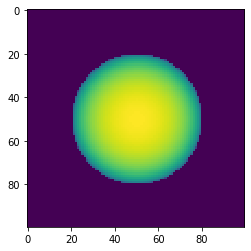

In [277]:
def Y_Value(Z,X):
    r_star = 30
    
    Y=0
    Y = np.sqrt(r_star**2 - ((Z-50)**2 + (X-50)**2), where=((Z-50)**2 + (X-50)**2 <= r_star**2) )
    circle_mask = (Z-50)**2 + (X - 50)**2 <= r_star**2
    Y = circle_mask * Y
    return X,Y,Z
    

x,y,z=1* np.fromfunction(Y_Value, (100,100), dtype=int)
x = np.reshape(x,-1)
y = np.reshape(y,-1)
z = np.reshape(z,-1)
coords = list(zip(x,y,z))

print (len(x))
i=0
trial_array = np.array([coords[i][0],coords[i][1],coords[i][2]])

templist = []

for i in range(len(x)):
    hello = np.array([coords[i][0] - 50, coords[i][1],coords[i][2]- 50])
    print (hello)
    templist.append(np.dot([0,1,0],hello)/np.sqrt(hello.dot(hello)))
    
print(len(templist))
temp = np.array(templist)

temp_array2 = temp.reshape((100,100))

limb_darkening = 1 - (c1*(1-np.power(temp_array2, 0.5)) + (c2*(1-temp_array2)) + (c3*(1-np.power(temp_array2, 1.5))) + (c4*(1-np.power(temp_array2, 2))))

plt.imshow(limb_darkening, interpolation='nearest')

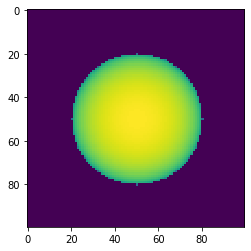

In [278]:
centre_of_star = 50
r_star = 30
def intensity (z,x): # Draws the star with limb darkening  
    global r_star,centre_of_star
    r_squared= (z-centre_of_star)**2 + (x - centre_of_star)**2
    circle_mask = (z-centre_of_star)**2 + (x - centre_of_star)**2 <= r_star**2
    
    mu = np.sqrt(1 - r_squared/r_star**2,where=((z-centre_of_star)**2 + (x-centre_of_star)**2 <= r_star**2))
    
    return circle_mask*(1 - (c1*(1-np.power(mu, 0.5)) + (c2*(1-mu)) + (c3*(1-np.power(mu, 1.5))) + (c4*(1-np.power(mu, 2)))))



old_one =1* np.fromfunction(intensity, (100,100), dtype=int)

plt.imshow(old_one, interpolation='nearest')

0.0
2.6645352591003757e-15
2.220446049250313e-16


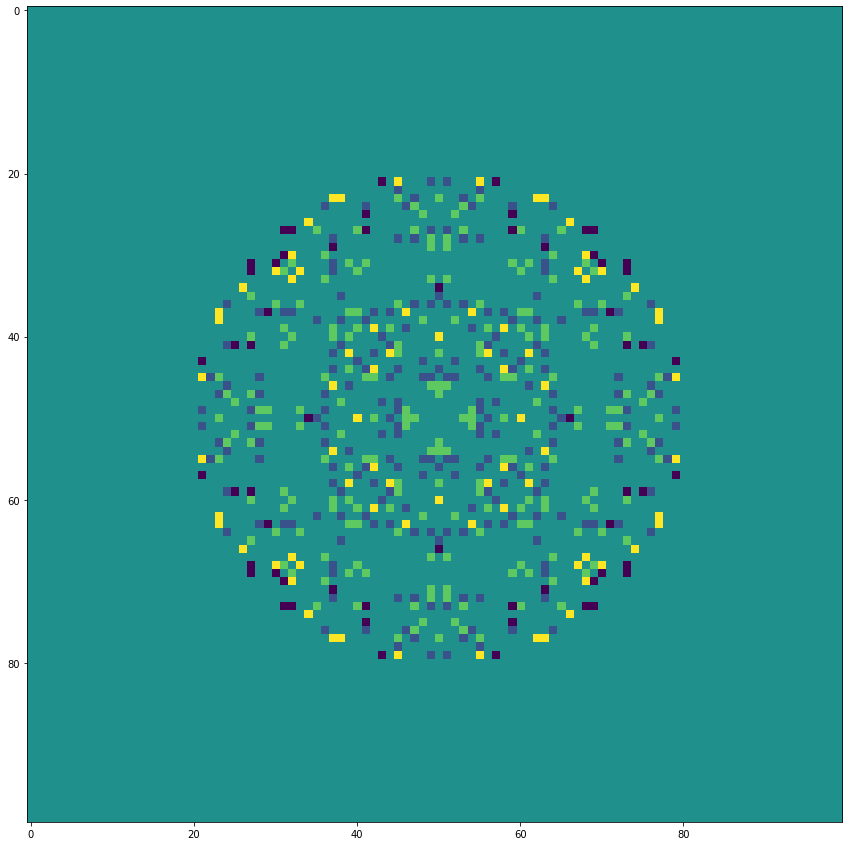

In [279]:
limb_darkening = limb_darkening*mask
fig = plt.figure(figsize=(15,15))

difference = old_one - limb_darkening
plt.imshow(difference, interpolation='nearest')

print (difference[0][0])

print (np.sum(difference))
print (difference.max())

In [280]:
c1 = [-0.1015,0.0284,0.2022,0.3765,0.4957,0.5566,0.6239,0.6495,0.6623,0.6535]
c2 = [0.5547,0.4248,0.1101,-0.0119,-0.2057,-0.2972,-0.4176,-0.4916,-0.5338,-0.5323]
c3 = [0.6096,0.6646,0.9690,0.8863,0.9157,0.9190,0.8889,0.8722,0.8411,0.8142]
c4 = [-0.2814,-0.3450,-0.4801,-0.4504,-0.4340,-0.4288,-0.4026,-0.3844,-0.3661,-0.3566]

p = 0 # Change this to go throught the wavelength ranges

c1 = c1[p]
c2 = c2[p]
c3 = c3[p]
c4 = c4[p]

# 293 - 347   0
# 348 - 402   1 
# 403 - 457   2
# 458 - 512   3
# 512 - 567   4
# 532 - 629   5
# 629 - 726   6
# 727 - 824   7
# 825 - 922   8
# 922 - 1019  9

def intensity (z,x): # Draws the star with limb darkening  
    global r_star,centre_of_star
    r_squared= (z-centre_of_star)**2 + (x - centre_of_star)**2
    circle_mask = (z-centre_of_star)**2 + (x - centre_of_star)**2 <= r_star**2
    
    mu = np.sqrt(1 - r_squared/r_star**2,where=((z-centre_of_star)**2 + (x-centre_of_star)**2 <= r_star**2))
    
    return Intensity_max*circle_mask*(1 - (c1*(1-np.power(mu, 0.5)) + (c2*(1-mu)) + (c3*(1-np.power(mu, 1.5))) + (c4*(1-np.power(mu, 2)))))

Animation of the differences in the two models over the different wavelengths.

MovieWriter PillowWriter unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.


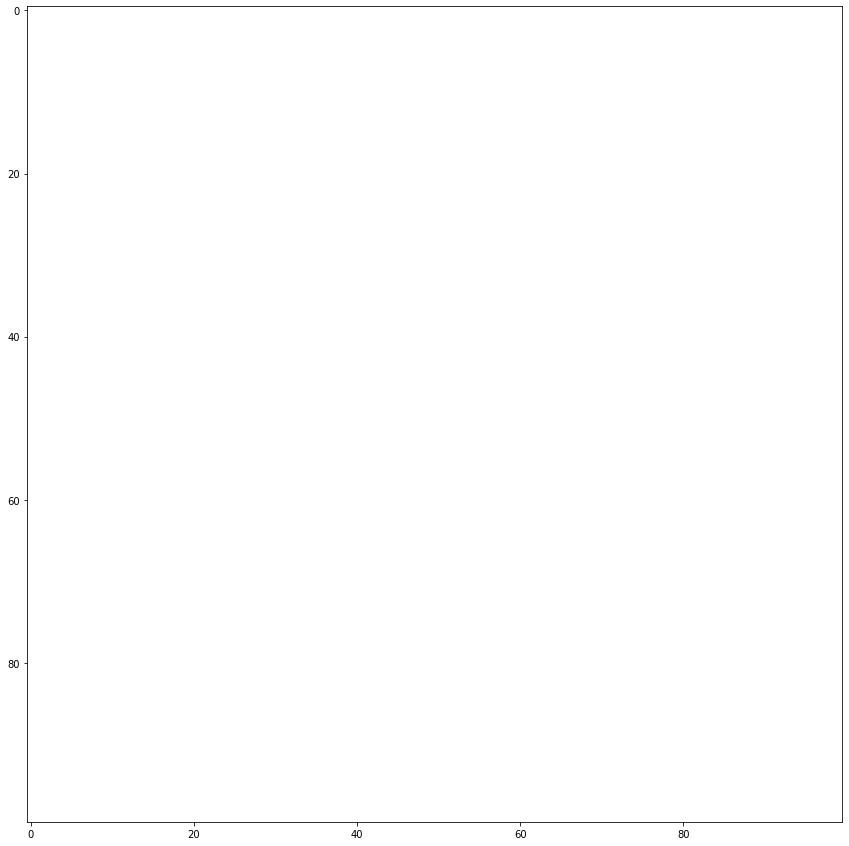

In [290]:
from celluloid import Camera
def Y_Value(Z,X):
    r_star = 30
    
    Y=0
    Y = np.sqrt(r_star**2 - ((Z-50)**2 + (X-50)**2), where=((Z-50)**2 + (X-50)**2 <= r_star**2) )
    circle_mask = (Z-50)**2 + (X - 50)**2 <= r_star**2
    Y = circle_mask * Y
    return X,Y,Z

def intensity (z,x): # Draws the star with limb darkening  
    global r_star,centre_of_star
    r_squared= (z-centre_of_star)**2 + (x - centre_of_star)**2
    circle_mask = (z-centre_of_star)**2 + (x - centre_of_star)**2 <= r_star**2
    
    mu = np.sqrt(1 - r_squared/r_star**2,where=((z-centre_of_star)**2 + (x-centre_of_star)**2 <= r_star**2))
    
    return circle_mask*(1 - (c1*(1-np.power(mu, 0.5)) + (c2*(1-mu)) + (c3*(1-np.power(mu, 1.5))) + (c4*(1-np.power(mu, 2)))))

c1l = [-0.1015,0.0284,0.2022,0.3765,0.4957,0.5566,0.6239,0.6495,0.6623,0.6535]
c2l = [0.5547,0.4248,0.1101,-0.0119,-0.2057,-0.2972,-0.4176,-0.4916,-0.5338,-0.5323]
c3l = [0.6096,0.6646,0.9690,0.8863,0.9157,0.9190,0.8889,0.8722,0.8411,0.8142]
c4l = [-0.2814,-0.3450,-0.4801,-0.4504,-0.4340,-0.4288,-0.4026,-0.3844,-0.3661,-0.3566]
    


fig = plt.figure(figsize=(15,15))
ax = plt.axes()
camera = Camera(fig)
for p in range(len(c1l)):


    c1 = c1l[p]
    c2 = c2l[p]
    c3 = c3l[p]
    c4 = c4l[p]




    x,y,z=1* np.fromfunction(Y_Value, (100,100), dtype=int)
    x = np.reshape(x,-1)
    y = np.reshape(y,-1)
    z = np.reshape(z,-1)
    coords = list(zip(x,y,z))
    
    i=0
    trial_array = np.array([coords[i][0],coords[i][1],coords[i][2]])

    templist = []

    for i in range(len(x)):
        hello = np.array([coords[i][0] - 50, coords[i][1],coords[i][2]- 50])
        templist.append(np.dot([0,1,0],hello)/np.sqrt(hello.dot(hello)))
    

    temp = np.array(templist)

    temp_array2 = temp.reshape((100,100))

    limb_darkening = 1 - (c1*(1-np.power(temp_array2, 0.5)) + (c2*(1-temp_array2)) + (c3*(1-np.power(temp_array2, 1.5))) + (c4*(1-np.power(temp_array2, 2))))

    centre_of_star = 50
    r_star = 30



    old_one =1* np.fromfunction(intensity, (100,100), dtype=int)

    limb_darkening = limb_darkening*mask
    

    difference = old_one - limb_darkening
    ax.imshow(difference, interpolation='nearest')
    camera.snap()
    
animation = camera.animate()
animation.save('Cool.gif', writer='PillowWriter', fps=5)

<a id="8"></a>
# 15/3/21 - Planetry atmosphere
***
### Jump to date:
* [1/2/21 - Orbital Motion](#1)
* [8/2/21 - Limb darkening, Drawing the planet transiting in front of the star, Animation](#2)
* [Between Weeks - Optimisation and Bug fixing](#3)
* [15/2/21 - Spinning and Rotation](#4)
* [22/2/21 - Reading data and adding a moon](#5)
* [1/3/21 - Planet-Moon transit](#6)
* [8/3/21 - Improved limb darkening](#7)
* [15/3/21 - Planetry atmosphere](#8)

Tasks to do today:
* Look into the effects of planetry atmosphere

The atmosphere of a planet also obscures some of the light from the star meaning the planet's apparent size is larger than the planet itself.

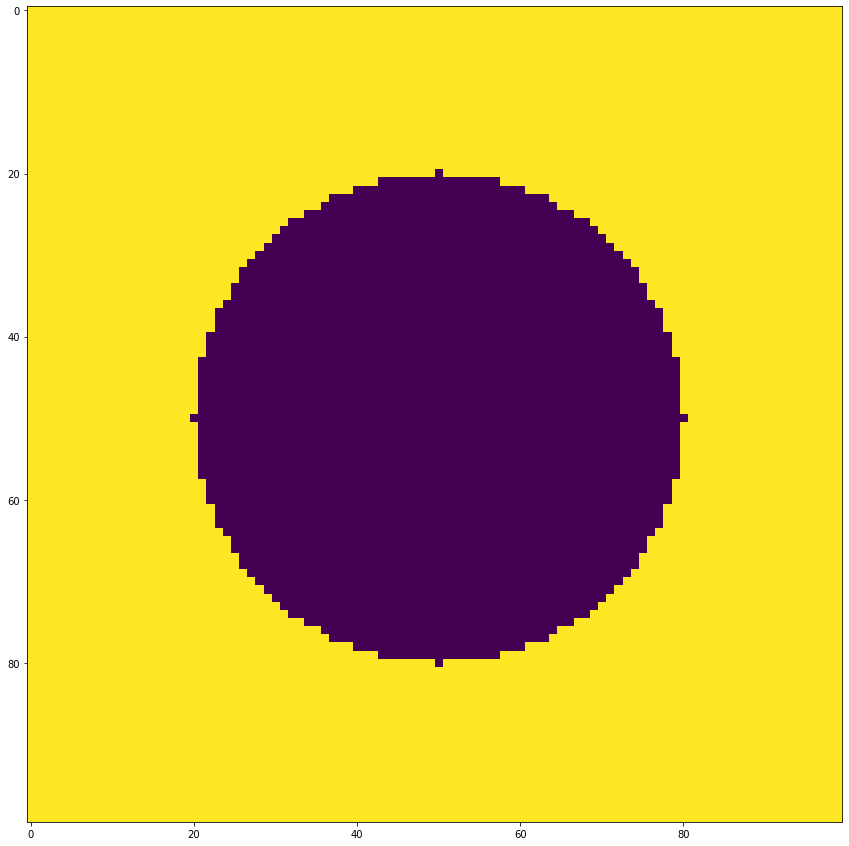

In [31]:
def planet_writer(z,x): # Draws the planet at the given centre  
    global centre_of_planet,r_planet
    return(z-centre_of_planet[1])**2 + (x-centre_of_planet[0])**2 > (r_planet)**2

centre_of_planet=[50,50]
r_planet = 30

display_with_planet = np.fromfunction(planet_writer,(100, 100), dtype=int)

fig = plt.figure(figsize=(15,15))
plt.imshow(display_with_planet, interpolation='nearest')

Taking modified code from the limb darkening of a star, the atmosphere surrounding a planet can be modified. This is just a demonstration of the capabilities of the model rather than actually adding real science as it would take too long to implement at this stage of the project as there are too many variables such as wavelength, temperature, gravity, molecular mass, ect. to consider. The atmosphere is modelled to follow and exponential decay. 

In theory, the apparent thickness of the atmosphere could be changed by changing the "thickness" variable (where larger values mean the atmosphere drops off faster) to model different wavelengths passing through the atmosphere. 

1.0
[[1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]
 ...
 [1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]]


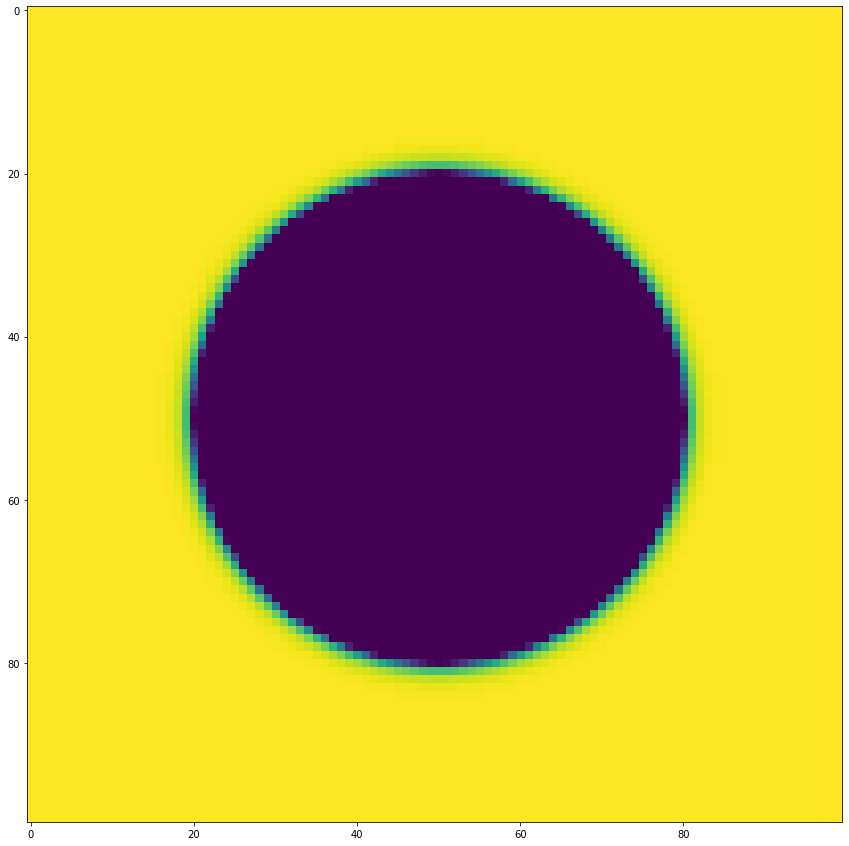

In [4]:
centre_of_planet=50
r_planet = 30
thickness = 1.2
def planet_atmosphere(z,x): # Draws planet with atmosphere
    global centre_of_planet,r_planet,thickness
    r_squared= (z-centre_of_planet)**2 + (x - centre_of_planet)**2
    circle_mask = (z-centre_of_planet)**2 + (x - centre_of_planet)**2 > r_planet**2
    return (1- np.round(np.e**(-thickness*(np.sqrt(r_squared)-r_planet)),2)) *circle_mask


display_with_atmosphere = np.fromfunction(planet_atmosphere,(100, 100), dtype=int)
print (display_with_atmosphere.max())
fig = plt.figure(figsize=(15,15))
plt.imshow(display_with_atmosphere, interpolation='nearest')

print(display_with_atmosphere)

The extra effects of the atmosphere can be seen below:

[ 0.98  0.98  0.97  0.97  0.96  0.95  0.94  0.93  0.91  0.89  0.86  0.83
  0.8   0.75  0.7   0.63  0.55  0.45  0.33  0.18  0.   -0.   -0.   -0.
 -0.   -0.   -0.   -0.   -0.   -0.   -0.   -0.   -0.   -0.   -0.   -0.
 -0.   -0.   -0.   -0.   -0.   -0.   -0.   -0.   -0.   -0.   -0.   -0.
 -0.   -0.   -0.   -0.   -0.   -0.   -0.   -0.   -0.   -0.   -0.   -0.
 -0.   -0.   -0.   -0.   -0.   -0.   -0.   -0.   -0.   -0.   -0.   -0.
 -0.   -0.   -0.   -0.   -0.   -0.   -0.   -0.    0.    0.18  0.33  0.45
  0.55  0.63  0.7   0.75  0.8   0.83  0.86  0.89  0.91  0.93  0.94  0.95
  0.96  0.97  0.97  0.98]


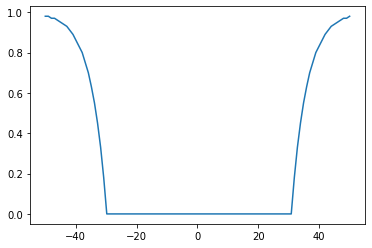

In [115]:
intensity_with_r = display_with_atmosphere[50:51,:][0]
r = np.linspace(-50,50,num=100)
print (intensity_with_r)
plt.plot(r,intensity_with_r)

## Putting it into a real transit using version 1.6 (multiplying atmosphere by 1.2 instead of 0.4 - more realistic)

In [5]:
%%time
# Times how long it takes for the program to run

import numpy as np
import matplotlib.pyplot as plt

def intensity (z,x): # Draws the star with limb darkening  
    global r_star,centre_of_star
    r_squared= (z-centre_of_star)**2 + (x - centre_of_star)**2
    circle_mask = (z-centre_of_star)**2 + (x - centre_of_star)**2 <= r_star**2
    
    mu = np.sqrt(1 - r_squared/r_star**2,where=((z-centre_of_star)**2 + (x-centre_of_star)**2 <= r_star**2))
    
    return Intensity_max*(1-mu1*(1-mu)-mu2*(1 - mu)**2)*circle_mask

def planet_writer(z,x): # Draws the planet at the given centre  
    global centre_of_planet,r_planet
    return (z-centre_of_planet[1])**2 + (x-centre_of_planet[0])**2 > (r_planet)**2



def draw_stage(i,background): # Adds together the planet and star onto the same canvas
    global centre_of_planet, display_dim
    centre_of_planet = [X_coord_on_grid[i],Z_coord_on_grid[i]]
    
    display_added_planet = 1 * np.fromfunction(planet_writer, (display_dim, display_dim), dtype=int)
   
    return display_added_planet * background

###################################### Defining variables and constants

### Physical dimensions
radius_of_sun = 7e5 # Planet radius
radius_of_jupiter = 7e4 # Star radius

#### Stuff for orbit
a= 7.8e9 # Semi Major axis
e = 0.0489 # Eccentricity < 1 to work
theta = np.linspace(-0.6 *10e-4, 0.6*10e-4, num=500) # Angular range where the planet crosses the star
phase = 0 
f = theta - phase 
r = a*(1 - e**2)/ (1 + e*np.cos(f)) # Distance between the star and the planet
i = 0
omega = np.pi/2
w = omega + phase

#### Stuff for Limb Darkening
mu1 = 0.3 # Variables for limb darkening 
mu2 = 0.1 # Variables for limb darkening 
Intensity_max = 100 # Max Intensity for limb darkening

### Stuff for Display
display_dim = 100 # Size of the 'display'

### Stuff for Flux graph
flux_old = []
###################################### Equations of motion
X_3D = - r* np.cos(w +f) 
Y_3D = - r* np.sin(w +f)* np.cos(i)
Z_3D = r* np.sin(w +f)* np.sin(i)

###################################### Set up of display
display = np.zeros((display_dim, display_dim))
centre_of_display = display_dim/2

###################################### Planet
SF = (radius_of_sun + 2*radius_of_jupiter) # Scaling display to fit star/planet

X_coord_on_grid = np.round(X_3D/SF * centre_of_display + centre_of_display) # Scaling X with respect to display
Z_coord_on_grid = np.round(Z_3D/SF * centre_of_display + centre_of_display) # Scaling Z with respect to display

r_planet = radius_of_jupiter/SF *  display_dim/2 # Scaling planet radius with respect to display
###################################### Star 
centre_of_star = centre_of_display # Centre of star
r_star = radius_of_sun/SF * display_dim/2 # Scaling star centre with respect to display

display_with_star = np.fromfunction(intensity,(display_dim, display_dim), dtype=int) # Drawing Star
###################################### Putting everything together

for i in range(0,500):
    display = np.sum(draw_stage(i,display_with_star)) # Drawing the star/planet at each planet centre
    flux_old.append(display)

CPU times: user 127 ms, sys: 6.75 ms, total: 134 ms
Wall time: 136 ms


In [6]:
%%time
# Times how long it takes for the program to run

import numpy as np
import matplotlib.pyplot as plt

def intensity (z,x): # Draws the star with limb darkening  
    global r_star,centre_of_star
    r_squared= (z-centre_of_star)**2 + (x - centre_of_star)**2
    circle_mask = (z-centre_of_star)**2 + (x - centre_of_star)**2 <= r_star**2
    
    mu = np.sqrt(1 - r_squared/r_star**2,where=((z-centre_of_star)**2 + (x-centre_of_star)**2 <= r_star**2))
    
    return Intensity_max*(1-mu1*(1-mu)-mu2*(1 - mu)**2)*circle_mask

def planet_atmosphere(z,x): # Draws planet with atmosphere
    global centre_of_planet,r_planet
    r_squared= (z-centre_of_planet[1])**2 + (x-centre_of_planet[0])**2
    circle_mask = (z-centre_of_planet[1])**2 + (x-centre_of_planet[0])**2 > r_planet**2
    return (1- np.round(np.e**(-1.2*(np.sqrt(r_squared)-r_planet)),2)) *circle_mask


def draw_stage(i,background): # Adds together the planet and star onto the same canvas
    global centre_of_planet, display_dim
    centre_of_planet = [X_coord_on_grid[i],Z_coord_on_grid[i]]
    
    display_added_planet = 1 * np.fromfunction(planet_atmosphere, (display_dim, display_dim), dtype=int)
   
    return display_added_planet * background

###################################### Defining variables and constants

### Physical dimensions
radius_of_sun = 7e5 # Planet radius
radius_of_jupiter = 7e4 # Star radius

#### Stuff for orbit
a= 7.8e9 # Semi Major axis
e = 0.0489 # Eccentricity < 1 to work
theta = np.linspace(-0.6 *10e-4, 0.6*10e-4, num=500) # Angular range where the planet crosses the star
phase = 0 
f = theta - phase 
r = a*(1 - e**2)/ (1 + e*np.cos(f)) # Distance between the star and the planet
i = 0
omega = np.pi/2
w = omega + phase

#### Stuff for Limb Darkening
mu1 = 0.3 # Variables for limb darkening 
mu2 = 0.1 # Variables for limb darkening 
Intensity_max = 100 # Max Intensity for limb darkening

### Stuff for Display
display_dim = 100 # Size of the 'display'

### Stuff for Flux graph
flux = []
###################################### Equations of motion
X_3D = - r* np.cos(w +f) 
Y_3D = - r* np.sin(w +f)* np.cos(i)
Z_3D = r* np.sin(w +f)* np.sin(i)

###################################### Set up of display
display = np.zeros((display_dim, display_dim))
centre_of_display = display_dim/2

###################################### Planet
SF = (radius_of_sun + 2*radius_of_jupiter) # Scaling display to fit star/planet

X_coord_on_grid = np.round(X_3D/SF * centre_of_display + centre_of_display) # Scaling X with respect to display
Z_coord_on_grid = np.round(Z_3D/SF * centre_of_display + centre_of_display) # Scaling Z with respect to display

r_planet = radius_of_jupiter/SF *  display_dim/2 # Scaling planet radius with respect to display
###################################### Star 
centre_of_star = centre_of_display # Centre of star
r_star = radius_of_sun/SF * display_dim/2 # Scaling star centre with respect to display

display_with_star = np.fromfunction(intensity,(display_dim, display_dim), dtype=int) # Drawing Star
###################################### Putting everything together

for i in range(0,500):
    display = np.sum(draw_stage(i,display_with_star)) # Drawing the star/planet at each planet centre
    flux.append(display)

CPU times: user 537 ms, sys: 6.15 ms, total: 543 ms
Wall time: 544 ms


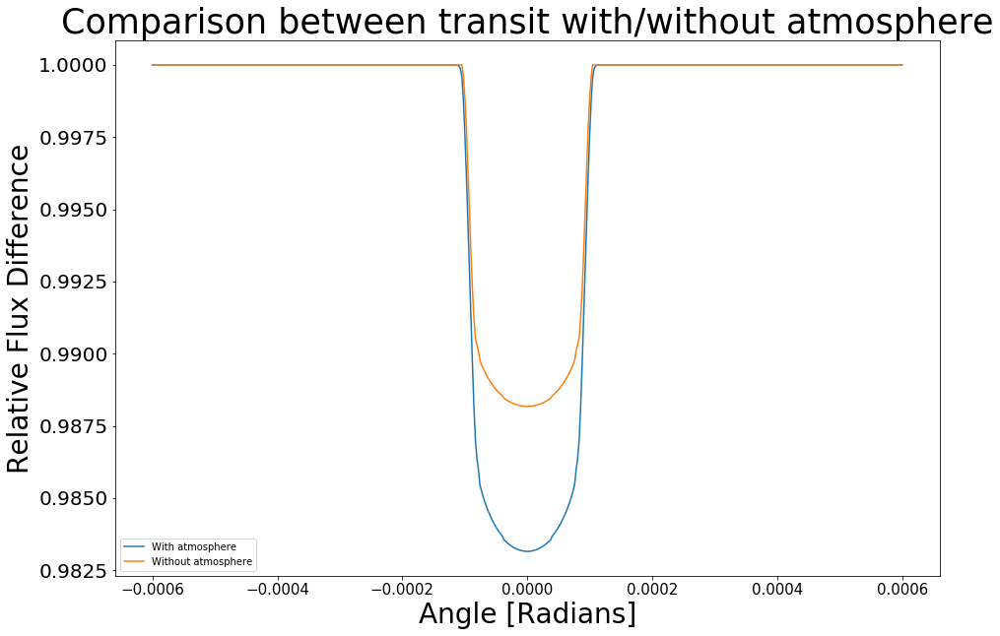

In [9]:
fig = plt.figure(figsize=(15,10))
plt.plot(theta[0:500],flux/flux[0],label= "With atmosphere")
plt.plot(theta[0:500],flux_old/flux_old[0],label= "Without atmosphere")

plt.title('Comparison between transit with/without atmosphere', size=35)
plt.xlabel('Angle [Radians]', size=28)
plt.xticks(fontsize=15)
plt.ylabel('Relative Flux Difference', size=28)
plt.yticks(fontsize=20)
plt.legend()

<div class="alert alert-block alert-info">
<b>Project info:</b> I helped ***** fix her code so that the intensity spot function outputs values by normalising it so that the values are real. I also added two different ways of adding the starspot to the star, either multiplying the fractional values (from 1 to 0) on top of the limb darkening or punching a hole in the spot where the spot is meant to go by multipying the star with a spot of zeros then adding the spot in (multiplied by Intensity_max so that the values were between 100 to 0). I then compared them to see if there was a difference. Close to the centre, it doesn't seem to make a difference. However, if the spot is near the edge the effects of limb darkening mean the starspot on top of the limb darkening has a lower total value. After speaking to ******, the spot on top of the limb darkening was determined to be the correct implementation. 
</div>

### Improved code - Spot on top of limb darkening

100.0
0.0


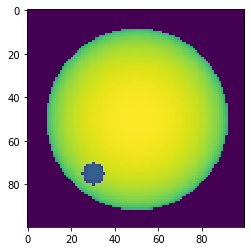

In [84]:
def intensity (x,y): # Draws the star with limb darkening  
    global r_star,centre_of_star
    r_squared= (x-centre_of_star[1])**2 + (y-centre_of_star[1])**2
    circle_mask = (x-centre_of_star[1])**2 + (y-centre_of_star[1])**2 <= r_star**2
    mu = np.sqrt(1 - r_squared/r_star**2,where=((x-centre_of_star[1])**2 + (y-centre_of_star[1])**2 <= r_star**2))
    
    return Intensity_max*(1-mu1*(1-mu)-mu2*(1 - mu)**2)*circle_mask

def intensity_spot (x,y):  #Draws the starspot with limb darkening
    global r_spot, centre_of_spot
    
    p_squared = (x-centre_of_spot[0])**2+(y-centre_of_spot[1])**2
    circle_mask = (x-centre_of_spot[0])**2+(y-centre_of_spot[1])**2 <= r_spot**2
    add_one_mask = (x-centre_of_spot[0])**2+(y-centre_of_spot[1])**2 > r_spot**2 # Used to add one where the spot = zero so that it can be multiplied with the display 
    
    mu_spot = np.sqrt(1 - p_squared/r_spot**2, where=((x-centre_of_spot[0])**2 + (y-centre_of_spot[1])**2 <= r_spot**2)) # 1/r_spot**2 needed to normalise 
    return ((1/np.pi)*((1-mu1_spot*(1-mu_spot)-mu2_spot*(1 - mu_spot)**2)/(1-(mu1_spot/3)-(mu2_spot/6)))*circle_mask) + add_one_mask


def draw_stage(background): # Adds together the starspot and star onto the same canvas
    global centre_of_spot, display_dim

    
    display_added_spot = 1 * np.fromfunction(intensity_spot, (display_dim, display_dim), dtype=int)
   
    return background * display_added_spot


Intensity_max=100
radius_of_sun = 7e5 # Planet radius
radius_of_jupiter = 7e4 # Star radius
radius_of_spot = 6e3 # Starspot radius
SF = (radius_of_sun + 2*radius_of_jupiter) # Scaling display to fit star/planet
display_dim=100
centre_of_display = 50
mu1 = 0.3 # Variables for limb darkening 
mu2 = 0.1

### Spot stuff
r_spot = 5
centre_of_spot = [75,30]

mu1_spot = 0.2 # Variables for limb darkening for the spot
mu2_spot= 0.2

sb_constant = 5.67e-8 # Stefan-Boltzmamm constant
temperature_of_sun = 5500 # Celsius
temperature_of_spot = 3500 #Celsius
sun_luminosity = 4*np.pi*((radius_of_sun)**2)*sb_constant*((temperature_of_sun)**4)
flux = sb_constant*((temperature_of_sun)**4)
ratio = (temperature_of_sun/temperature_of_spot)**4

centre_of_star = [centre_of_display,centre_of_display] # Centre of star
r_star = radius_of_sun/SF * display_dim/2 # Scaling star centre with respect to display

display_with_star = np.fromfunction(intensity,(display_dim, display_dim), dtype=int) # Drawing Star


display = draw_stage(display_with_star)

print(display.max())
print(display.min())
plt.imshow(display, interpolation='nearest')

Intensty across the row of the array the middle of the starspot is in to check the intensity of the star spot follows limb darkening.

[ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.         65.51533439
 70.69824    73.83774076 76.21959577 78.16622886 79.81929595 81.25623506
 82.52494056 17.75267565 26.59405873 28.82141914 30.01828912 30.71494828
 31.08968026 31.18733904 30.95399037 30.19253392 28.31783281 19.22955481
 91.02992417 91.40603426 91.74753213 92.05619728 92.33356806 92.58097289
 92.79955552 92.99029544 93.15402441 93.29143987 93.40311567 93.48951061
 93.55097508 93.58775595 93.6        93.58775595 93.55097508 93.48951061
 93.40311567 93.29143987 93.15402441 92.99029544 92.79955552 92.58097289
 92.33356806 92.05619728 91.74753213 91.40603426 91.02992417 90.6171422
 90.16529952 89.67161604 89.13284066 88.54514768 87.904      87.2039653
 86.43846395 85.59941469 84.67672252 83.65751311 82.52494056 81.25623506
 79.81929595 78.16622886 76.21959577 73.83774076 70.69824    65.51533

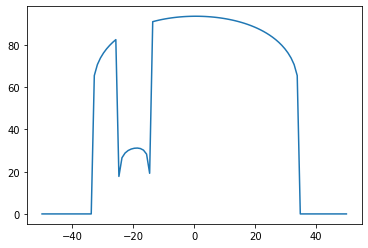

In [85]:
intensity_with_r = display[75:76,:][0]
r = np.linspace(-50,50,num=100)
print (intensity_with_r)
plt.plot(r,intensity_with_r)

As can be seen in the graph, the intensity of the star spot shows the limb darkening from the spot and is not even due to the limb darkening of the star.

## Improved code - spot independant of the stellar limb darkening 

100.0
0.0


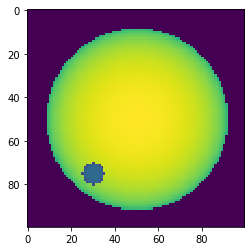

In [86]:
def intensity (x,y): # Draws the star with limb darkening  
    global r_star,centre_of_star
    r_squared= (x-centre_of_star[1])**2 + (y-centre_of_star[1])**2
    circle_mask = (x-centre_of_star[1])**2 + (y-centre_of_star[1])**2 <= r_star**2
    mu = np.sqrt(1 - r_squared/r_star**2,where=((x-centre_of_star[1])**2 + (y-centre_of_star[1])**2 <= r_star**2))
    
    return Intensity_max*(1-mu1*(1-mu)-mu2*(1 - mu)**2)*circle_mask

def intensity_spot (x,y):  #Draws the starspot with limb darkening
    global r_spot, centre_of_spot
    
    p_squared = (x-centre_of_spot[0])**2+(y-centre_of_spot[1])**2
    circle_mask = (x-centre_of_spot[0])**2+(y-centre_of_spot[1])**2 <= r_spot**2
    mu_spot = np.sqrt(1 - p_squared/r_spot**2, where=((x-centre_of_spot[0])**2 + (y-centre_of_spot[1])**2 <= r_spot**2)) # 1/r_spot**2 needed to normalise 
    return Intensity_max*((1/np.pi)*((1-mu1_spot*(1-mu_spot)-mu2_spot*(1 - mu_spot)**2)/(1-(mu1_spot/3)-(mu2_spot/6)))*circle_mask),circle_mask


def draw_stage(background): # Adds together the starspot and star onto the same canvas
    global centre_of_spot, display_dim
    
    display_added_spot, spot_punch_hole = 1 * np.fromfunction(intensity_spot, (display_dim, display_dim), dtype=int)
    spot_punch_hole = 1 - spot_punch_hole
    
    return background * spot_punch_hole + display_added_spot


Intensity_max=100
radius_of_sun = 7e5 # Planet radius
radius_of_jupiter = 7e4 # Star radius
radius_of_spot = 6e3 # Starspot radius
SF = (radius_of_sun + 2*radius_of_jupiter) # Scaling display to fit star/planet
display_dim=100
centre_of_display = 50
mu1 = 0.3 # Variables for limb darkening 
mu2 = 0.1

### Spot stuff
r_spot = 5
centre_of_spot = [75,30]

mu1_spot = 0.2 # Variables for limb darkening for the spot
mu2_spot= 0.2

sb_constant = 5.67e-8 # Stefan-Boltzmamm constant
temperature_of_sun = 5500 # Celsius
temperature_of_spot = 3500 #Celsius
sun_luminosity = 4*np.pi*((radius_of_sun)**2)*sb_constant*((temperature_of_sun)**4)
flux = sb_constant*((temperature_of_sun)**4)
ratio = (temperature_of_sun/temperature_of_spot)**4

centre_of_star = [centre_of_display,centre_of_display] # Centre of star
r_star = radius_of_sun/SF * display_dim/2 # Scaling star centre with respect to display

display_with_star = np.fromfunction(intensity,(display_dim, display_dim), dtype=int) # Drawing Star


display1 = draw_stage(display_with_star)

print(display1.max())
print(display1.min())
plt.imshow(display1, interpolation='nearest')

[ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.         65.51533439
 70.69824    73.83774076 76.21959577 78.16622886 79.81929595 81.25623506
 82.52494056 17.75267565 26.59405873 28.82141914 30.01828912 30.71494828
 31.08968026 31.18733904 30.95399037 30.19253392 28.31783281 19.22955481
 91.02992417 91.40603426 91.74753213 92.05619728 92.33356806 92.58097289
 92.79955552 92.99029544 93.15402441 93.29143987 93.40311567 93.48951061
 93.55097508 93.58775595 93.6        93.58775595 93.55097508 93.48951061
 93.40311567 93.29143987 93.15402441 92.99029544 92.79955552 92.58097289
 92.33356806 92.05619728 91.74753213 91.40603426 91.02992417 90.6171422
 90.16529952 89.67161604 89.13284066 88.54514768 87.904      87.2039653
 86.43846395 85.59941469 84.67672252 83.65751311 82.52494056 81.25623506
 79.81929595 78.16622886 76.21959577 73.83774076 70.69824    65.51533

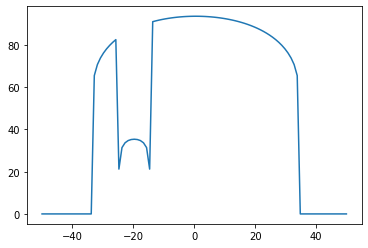

In [87]:
intensity_with_r1 = display1[75:76,:][0]
r = np.linspace(-50,50,num=100)
print (intensity_with_r)
plt.plot(r,intensity_with_r1)

As can be seen in the graph, the intensity of the star spot shows the limb darkening from the spot and is symmetrical as limb darkening of the star is not taken into account.

## Difference between the two methods

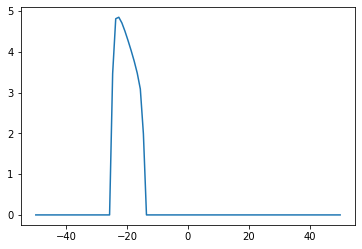

In [88]:
plt.plot(r,intensity_with_r1 - intensity_with_r)

### Plotting a nice graph for the presentation:

In [149]:
%%time
# Times how long it takes for the program to run

import numpy as np
import matplotlib.pyplot as plt



###################################### Defining variables and constants
from scipy.constants import physical_constants as pc_dict

### For time of transit
G = pc_dict['Newtonian constant of gravitation'][0]
Ms = 2E+30   # approx mass of sun in kg
Mp = 1.9E+27  # approx mass of Jupiter in kg

### Theta numbers
theta_values = 500

### Physical dimensions
radius_of_sun = 7e8 # Planet radius m
radius_of_jupiter = 7e7 # Star radius m 
radius_of_ganymede = 5e6 # Moon radius m 



#### Stuff for orbit
a= 7.8e12 # Semi Major axis in m
e = 0.0489 # Eccentricity < 1 to work

theta = np.linspace(-0.4 *10e-4, 0.4*10e-4, num=theta_values) # Angular range where the planet crosses the star
phase = 0 
f = theta - phase 
r = a*(1 - e**2)/ (1 + e*np.cos(f)) # Distance between the star and the planet
i = 0
omega = np.pi/2
w = omega + phase

#### Stuff for Limb Darkening
mu1 = 0.3 # Variables for limb darkening 
mu2 = 0.1 # Variables for limb darkening 
Intensity_max = 100 # Max Intensity for limb darkening

### Stuff for Display
display_dim = 100 # Size of the 'display'

### Moon Stuff
moon_period = 216 # hours
moon_phase = 0





def intensity (z,x): # Draws the star with limb darkening  
    global r_star,centre_of_star
    r_squared= (z-centre_of_star)**2 + (x - centre_of_star)**2
    circle_mask = (z-centre_of_star)**2 + (x - centre_of_star)**2 <= r_star**2
    
    mu = np.sqrt(1 - r_squared/r_star**2,where=((z-centre_of_star)**2 + (x-centre_of_star)**2 <= r_star**2))
    
    return Intensity_max*(1-mu1*(1-mu)-mu2*(1 - mu)**2)*circle_mask

def planet_writer(z,x): # Draws the planet at the given centre  
    global centre_of_planet,r_planet
    return (z-centre_of_planet[1])**2 + (x-centre_of_planet[0])**2 > (r_planet)**2


def draw_stage(i,background): # Adds together the planet and star onto the same canvas
    global centre_of_planet, display_dim
    centre_of_planet = [X_coord_on_grid[i],Z_coord_on_grid[i]]
    
    display_added_planet = 1 * np.fromfunction(planet_writer, (display_dim, display_dim), dtype=int)
   
    return display_added_planet * background

def moon_writer(z,x):
    global centre_of_moon,centre_of_planet,r_moon
    return (z-centre_of_planet[1]-centre_of_moon[1])**2 + (x-centre_of_planet[0]-centre_of_moon[0])**2 > r_moon**2

def planet_mask(x,y):
    global centre_of_planet,r_planet

    return (x-centre_of_planet[0])**2 + (y-centre_of_planet[1])**2 > r_planet**2
######################################## Time stuff
''' Period of Orbit'''
P = np.sqrt((4*np.pi**2)/(G*(Ms+Mp)) *(a/10)**(3)) # NB: a is divided by 10 because the true value of the Jupiter semi-major axis is 7.8E11, however using this value in the above code gives a low resolution graph.
''' Finding the velocity of the planet '''
n = 2*np.pi/P # mean motion 
v = np.sqrt((((n**2)*(a**2))/(1-e**2))*(1+2*e*np.cos(f)+e**2))
mean_v = np.sum(v)/len(v) # average velocity that is very similar to each velocity in the array of v
# in m/s

'''Finding time'''
distance = np.abs(max(X_3D)) + np.abs(min(X_3D))  
t = distance/mean_v 
t = t/60**2

###################################### Equations of motion
X_3D = - r* np.cos(w +f) 
Y_3D = - r* np.sin(w +f)* np.cos(i)
Z_3D = r* np.sin(w +f)* np.sin(i)

###################################### Set up of display
display = np.zeros((display_dim, display_dim))
centre_of_display = display_dim/2

###################################### Planet
SF = (radius_of_sun + 2*radius_of_jupiter) # Scaling display to fit star/planet

X_coord_on_grid = np.round(X_3D/SF * centre_of_display + centre_of_display) # Scaling X with respect to display
Z_coord_on_grid = np.round(Z_3D/SF * centre_of_display + centre_of_display) # Scaling Z with respect to display

r_planet = radius_of_jupiter/SF *  display_dim/2 # Scaling planet radius with respect to display
###################################### Star 
centre_of_star = centre_of_display # Centre of star
r_star = radius_of_sun/SF * display_dim/2 # Scaling star centre with respect to display

display_with_star = np.fromfunction(intensity,(display_dim, display_dim), dtype=int) # Drawing Star

### Stuff for Flux graph
flux = []

###################################### Moon Stuff
time_cross = t # hours
fraction_of_orbit_in_transit = time_cross/moon_period

theta_moon = np.linspace(0 + moon_phase, 2*np.pi * fraction_of_orbit_in_transit , num=theta_values)
r_moon = radius_of_ganymede/SF *  display_dim/2

r_moon_orbit = r_planet*2
X_3D_Moon = - r_moon_orbit* np.cos(theta_moon) 
Y_3D_Moon = - r_moon_orbit* np.sin(theta_moon)* np.cos(0)
Z_3D_Moon = r_moon_orbit* np.sin(theta_moon)* np.sin(0)

Y_Less_Zero = Y_3D>0

for i in range(0,theta_values):
    
    star_planet = draw_stage(i,display_with_star)# Drawing the star/planet at each planet centre
    centre_of_moon = [X_3D_Moon[i],Z_3D_Moon[i]]
    planet_mask_canvas =1* np.fromfunction(planet_mask, (display_dim, display_dim), dtype=int)
    
    if Y_Less_Zero[i] == True:
        addmask=planet_mask_canvas
    else:
        addmask = 1
        
    moon_canvas =   1* np.fromfunction(moon_writer, (display_dim, display_dim), dtype=int)
    
    display = star_planet * moon_canvas*addmask 
    
    
    flux.append(np.sum(display))

##########################################################################################
normalisation_constant = flux[0]

CPU times: user 394 ms, sys: 14.1 ms, total: 408 ms
Wall time: 415 ms


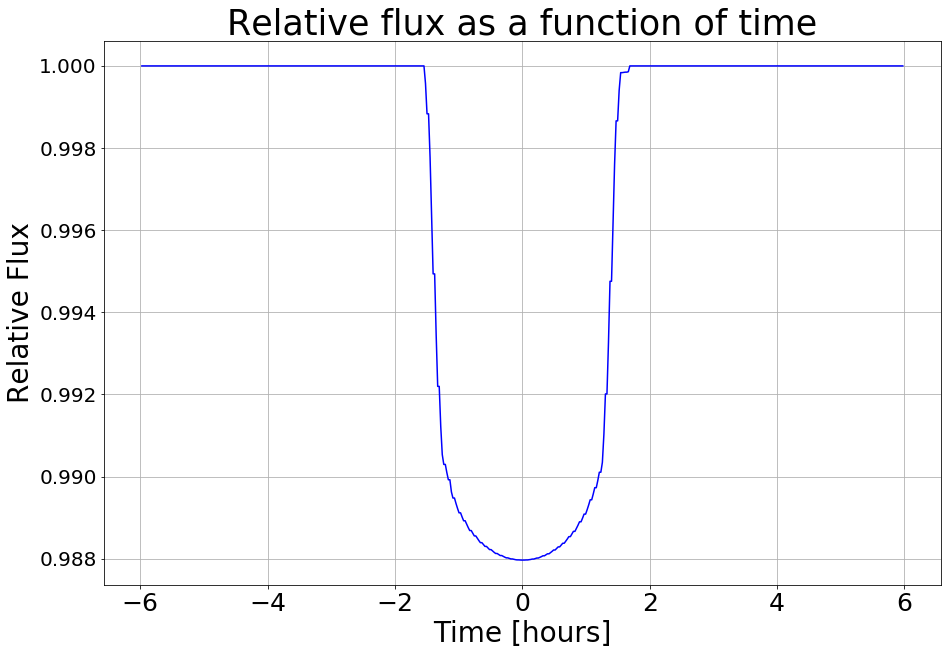

In [150]:
relative_flux = flux/normalisation_constant

'''Plotting the graph'''
factor = flux.index(min(flux))/theta_values  # factor to keep T=0 at the centre of the trough
fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(1, 1, 1)
ax = plt.plot(np.linspace(-np.round(t)*(factor),np.round(t)*(factor),theta_values), relative_flux, 'b')
plt.grid()
plt.title('Relative flux as a function of time', size=35)
plt.xlabel('Time [hours]', size=28)
plt.xticks(fontsize=25)
plt.ylabel('Relative Flux', size=28)
plt.yticks(fontsize=20)
plt.show()

<div class="alert alert-block alert-info">
<b>Project info:</b> ***** needed help finding a way to get the residuals between the real data and the model. I was able to find the scipy interp1d function which allowed the model's outputs of relative intensity at certain times to be interpolated over and used to make a function which outputs relative intensity at a given time</div>

In [163]:
from scipy.interpolate import interp1d
model_as_func_of_time = interp1d(np.linspace(-np.round(t)*(factor),np.round(t)*(factor),theta_values), relative_flux, kind='nearest')

Inputting a time to get the relative intensity.

In [164]:
model_as_func_of_time(-0.5)

array(0.98821981)

Iterating over all the times in the data to compute the relative flux at those times according to the model.

In [165]:
relative_flux_func = []
for i in (np.linspace(-np.round(t)*(factor),np.round(t)*(factor),theta_values)):
    relative_flux_func.append(f2(i))
    
relative_flux_func = np.array(relative_flux_func)

## Comparing the function of time to the model's outputs

### From function

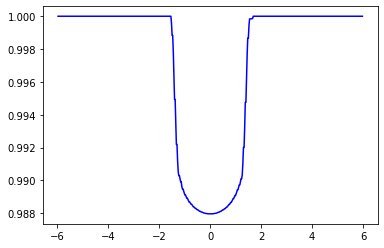

In [159]:
plt.plot(np.linspace(-np.round(t)*(factor),np.round(t)*(factor),theta_values), relative_flux_func, 'b')

### From model

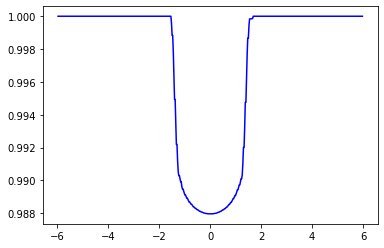

In [160]:
plt.plot(np.linspace(-np.round(t)*(factor),np.round(t)*(factor),theta_values), relative_flux, 'b')

### Difference

In [161]:
relative_flux_func - relative_flux

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

There is no difference between the relative flux predicted by the model and the function of time at the times the model considers.